## Morphodynamic and signaling state analysis

##### Load h5 files with image, segmentation, and cell features, apply data-driven modeling and analysis tools

In [3]:
#%%capture
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.path.append('/home/groups/ZuckermanLab/copperma/cell/celltraj/celltraj')
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
sys.path.append('/home/groups/ZuckermanLab/copperma/msmWE/BayesianBootstrap')
import bootstrap
import umap
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas
import itertools
import sklearn

Solver suite is petsc
{'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.1', 'matplotlib': '3.9.0', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': '4.8.4', 'solver': 'petsc'}


##### Specify segmentation model files

In [41]:
date = '14jun24'
os.system(f'mkdir -p {date}')
modelNames = [f'20240214_T4mammaryorganoid_FA',f'20240408_Mammary_Organoid_T4_ERK003',f'20240408_Mammary_Organoid_T4_ERK_96hRepeat005',f'20240408_Mammary_Organoid_T4_ERK_14_dayRepeat'] #results will be saved/named using this string
datapaths=['/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA','/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/Derivation_2024_04_08','/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/Derivation_2024_04_08/96h','/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/Derivation_2024_04_08']

In [5]:
#some convenience visualization functions here, eventually these will be incorporated into the packages....
def show_image_3channel(bf_img,nuc_img,rep_img,ax=None):
        if ax is None:
            ax=plt.gca()
        ax.imshow(imprep.znorm(bf_img),cmap=plt.cm.binary,clim=(-5,5))
        cs=ax.contour(imprep.znorm(nuc_img),cmap=plt.cm.BuPu,levels=np.linspace(0,np.percentile(imprep.znorm(nuc_img),99),7),alpha=.5,linewidths=.5)
        cs.cmap.set_over('purple')
        cs=ax.contour(imprep.znorm(rep_img),cmap=plt.cm.YlOrBr_r,levels=np.linspace(0,np.percentile(imprep.znorm(rep_img),99),7),alpha=.25,linewidths=.5)
        cs.cmap.set_over('yellow')
        return ax

def rescale_to_int(img,maxint=255,dtype=np.uint16):
    img=maxint*((img-np.min(img))/np.max(img-np.min(img)))
    return img.astype(dtype)

def show_3dseg_zproj(fig,im3d,labels,fmap=None,fmapscale=None,labels2=None,fmsk=None):
    zproj=np.sum(im3d,axis=0)
    labels_zproj=np.max(labels,axis=0)
    plt.imshow(zproj,cmap=plt.cm.gray_r)
    plt.contour(labels_zproj,levels=np.arange(np.max(labels_zproj)),colors='blue',linewidths=1)
    if fmap is not None:
        #plt.contour(np.max(fmap,axis=0),levels=np.linspace(np.min(fmap),np.max(fmap),21),cmap=plt.cm.PiYG_r)
        plt.imshow(np.max(fmap,axis=0),cmap=plt.cm.YlOrRd,alpha=.33,clim=fmapscale)
    if labels2 is not None:
        labels2_zproj=np.max(labels2,axis=0)
        plt.contour(labels2_zproj,levels=np.arange(np.max(labels2_zproj)),colors='green',linewidths=1)
    if fmsk is not None:
        fmsk_zproj=np.max(fmsk,axis=0)
        plt.contour(fmsk_zproj,levels=np.arange(np.max(fmsk_zproj)),colors='red',linewidths=1)    
    plt.axis('equal');plt.axis('off')

def log_ztransform(img):
    img=np.log(imprep.znorm(img)+1.-np.min(imprep.znorm(img)))
    return img

def nuc_viewtransform(im3d_nuc,zcut_nuc=2.0,rsmooth=1.0,zscale=5.0):
    im3d_nuc=skimage.filters.gaussian(im3d_nuc,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_nuc=imprep.znorm(im3d_nuc)
    im3d_nuc[im3d_nuc<zcut_nuc]=0
    im3d_nuc=rescale_to_int(log_ztransform(im3d_nuc))
    return im3d_nuc

def bf_viewtransform(im3d_bf,rsmooth=10.0,zscale=5.0,zcut=2.0,remove_background=False):
    im3d_bf=skimage.filters.difference_of_gaussians(im3d_bf,.5,1.5)
    if remove_background:
        im3d_bf_smth=skimage.filters.gaussian(np.abs(im3d_bf),sigma=[rsmooth/zscale,rsmooth,rsmooth])
        msk_bf=imprep.znorm(im3d_bf_smth)>zcut
        msk_bf=binary_fill_holes_2dstack(msk_bf)
    im3d_bf=rescale_to_int(log_ztransform(im3d_bf))
    im3d_bf=np.max(im3d_bf)-im3d_bf
    if remove_background:
        im3d_bf[np.logical_not(msk_bf)]=0
    return im3d_bf

def rep_viewtransform(im3d_rep,rsmooth=1.0,zscale=5.0):
    im3d_rep=skimage.filters.gaussian(im3d_rep,sigma=[rsmooth/zscale,rsmooth,rsmooth])
    im3d_rep=rescale_to_int(log_ztransform(im3d_rep))
    return im3d_rep

def binary_fill_holes_2dstack(im3d):
    for iz in range(im3d.shape[0]):
        im3d[iz,...]=ndimage.binary_fill_holes(im3d[iz,...])
    return im3d

##### Loop through model files and load cell data

In [6]:
#02-14,04-08 day 0, 04-08 day 2 missing rn, 04-08 day 14
modelLists = [None]*len(modelNames)
inds_imagingSet=[]
for idataset in range(len(modelNames)):
    modelLists[idataset]=imprep.list_images(f'{datapaths[idataset]}/{modelNames[idataset]}_xy*_roi*.h5')
    inds_dataset=[idataset]*len(modelLists[idataset])
    inds_imagingSet.append(inds_dataset)

inds_imagingSet=list(itertools.chain(*inds_imagingSet))
#modelLists=list(itertools.chain(*modelLists))

In [7]:
print(f'movies: {modelLists[0]}')
print(f'movies: {modelLists[1]}')
print(f'movies: {modelLists[2]}')
print(f'movies: {modelLists[3]}')

movies: ['/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy10_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy11_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy1_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy2_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy3_roi0.h5', '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy4_roi0.

In [8]:
#tmSet=['ctrl','AKTi','MEKi'] #,'ctrl2','IGF1','FGF2','AKTi+MEKi','MEKi','AKTi']
tmSet=['ctrl-d0','ctrl-d4','ctrl_d14','AKTi-d0','AKTi-d4','AKTi_d14','MEKi-d0','MEKi-d4','MEKi_d14'] #,'ctrl2','IGF1','FGF2','AKTi+MEKi','MEKi','AKTi']
colorSet =np.array(['black','dimgray','lightgrey','purple','mediumorchid','violet','blue','cornflowerblue','lightsteelblue'])
daySet=[0,4,14]
nxySet=[12,23,24,23]
inds_tmSet=[0]*12+[0]*1+[3]*6+[6]*3+[0]*8+[3]*4+[6]*1+[4]*5+[7]*4+[1]*5+[4]*4+[7]*6+[2]*3+[2]*5+[5]*2+[8]*3+[2]*5+[5]*4+[8]*1
#inds_tmSet=[0]*12+[0]*1+[1]*6+[2]*3+[0]*8+[1]*4+[2]*1+[1]*5+[2]*4+[0]*5+[1]*4+[2]*6+[0]*3+[0]*5+[1]*2+[2]*3+[0]*5+[1]*4+[2]*1
print(f'specified {np.sum(nxySet)} wells and {len(inds_tmSet)} treatments provided')
print(np.array(tmSet)[inds_tmSet])
#[1]*5+[2]*4+[0]*5+[1]*4+[2]*6 48hr

specified 82 wells and 82 treatments provided
['ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0'
 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'AKTi-d0'
 'AKTi-d0' 'AKTi-d0' 'AKTi-d0' 'AKTi-d0' 'AKTi-d0' 'MEKi-d0' 'MEKi-d0'
 'MEKi-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0' 'ctrl-d0'
 'ctrl-d0' 'ctrl-d0' 'AKTi-d0' 'AKTi-d0' 'AKTi-d0' 'AKTi-d0' 'MEKi-d0'
 'AKTi-d4' 'AKTi-d4' 'AKTi-d4' 'AKTi-d4' 'AKTi-d4' 'MEKi-d4' 'MEKi-d4'
 'MEKi-d4' 'MEKi-d4' 'ctrl-d4' 'ctrl-d4' 'ctrl-d4' 'ctrl-d4' 'ctrl-d4'
 'AKTi-d4' 'AKTi-d4' 'AKTi-d4' 'AKTi-d4' 'MEKi-d4' 'MEKi-d4' 'MEKi-d4'
 'MEKi-d4' 'MEKi-d4' 'MEKi-d4' 'ctrl_d14' 'ctrl_d14' 'ctrl_d14' 'ctrl_d14'
 'ctrl_d14' 'ctrl_d14' 'ctrl_d14' 'ctrl_d14' 'AKTi_d14' 'AKTi_d14'
 'MEKi_d14' 'MEKi_d14' 'MEKi_d14' 'ctrl_d14' 'ctrl_d14' 'ctrl_d14'
 'ctrl_d14' 'ctrl_d14' 'AKTi_d14' 'AKTi_d14' 'AKTi_d14' 'AKTi_d14'
 'MEKi_d14']


In [9]:
nf=len(tmSet)
inds_imagingSet_models=[]
inds_tmSet_models=[]
modelList=[]
i_tm=0
for idataset in range(len(modelNames)):
    nxy=nxySet[idataset]
    ind_xy=np.arange(nxy).astype(int)
    for ii in range(nxy):
        ixy=ind_xy[ii]
        modelName=modelNames[idataset]
        datapath=datapaths[idataset]
        mlist = imprep.list_images(f'{datapath}/{modelName}_xy{ixy}_roi*.h5')
        for mstring in mlist:
            modelList.append(mstring)
            inds_imagingSet_models.append(inds_imagingSet[ii])
            inds_tmSet_models.append(inds_tmSet[i_tm])
            print(f'found model {mstring} cond: {tmSet[inds_tmSet[i_tm]]}')
        i_tm=i_tm+1
        print(i_tm)

inds_imagingSet_models=np.array(inds_imagingSet_models)
inds_tmSet_models=np.array(inds_tmSet_models)
nmodels=len(modelList)
print(f'{nmodels} models found')

found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5 cond: ctrl-d0
1
found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy1_roi0.h5 cond: ctrl-d0
2
found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy2_roi0.h5 cond: ctrl-d0
3
found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy3_roi0.h5 cond: ctrl-d0
4
found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy4_roi0.h5 cond: ctrl-d0
5
found model /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy5_roi0.h5 cond: ctrl-d0


In [10]:
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): #now go back through and try to load data
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]
        modelSet[i].get_image_shape()#some missing info, add in to metadata in future
        nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        fore_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel;sctm.mskchannel=mskchannel
        status=modelSet[i].load_from_h5(f'/cell_data_m{mskchannel}/')
        if status:
            print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel}') 
        else:
            print(f'cell info on {mskchannel} not found') 
        if status and np.sum(np.logical_not(np.isfinite(modelSet[i].Xf)))==0:
            print('has BF features')
            ind_cbc_start=np.where(modelSet[i].Xf_feature_list==b'featBoundaryCB-0_msk1cmsk1')[0][0]
            print(f'cb: {np.mean(modelSet[i].Xf[:,ind_cbc_start])}')
            if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{rep_img_channel}_crosscorr'):
                print('has ERK features')
                if hasattr(modelSet[i],f'm{mskchannel}_img{nuc_img_channel}img{akt_img_channel}_crosscorr'):
                    print('has AKT features')
                    indgood_models=np.append(indgood_models,i)
                    if hasattr(modelSet[i],f'm{mskchannel}_comdx_feat'):
                        print('has motility features')
    except Exception as e:
        print(e)
        pass

loading /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
interpreting mask as zxyc
loading /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5:/cell_data_m1/
loaded /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5 with [b'cyto' b'cyto_rep'] mask channels, [b'DAPI' b'Cy5' b'TRITC' b'YFP' b'BF'] image channels, cell index on 1
has BF features
cb: 0.015548255847370513
has ERK features
has AKT features
has motility features
loading /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy1_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
interpreting image as zxyc
in

In [14]:
#do a quick filtering on models on segmentation stability
nframes=modelSet[0].nt
cellnumber_stdSet=np.ones(nmodels)*np.inf
cellnumber_frames=np.arange(int(nframes/2),nframes).astype(int)
cellnumber_std_cut=100.
meancellSet=np.zeros(nmodels)
for i in indgood_models:
    ncells=np.zeros(nframes)
    ncells_smooth=np.zeros_like(ncells)
    for iS in range(nframes):
        ncells[iS]=np.sum(modelSet[i].cells_frameSet==iS)
    print(f'model {i} mean cellnumber {np.nanmean(ncells)}')
    meancellSet[i]=np.nanmean(ncells)
    splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
    ncells_smooth=splfov(np.arange(nframes))*ncells[0]
    cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
    cellnumber_stdSet[i]=cellnumber_std

indhigh_std=np.where(cellnumber_stdSet>cellnumber_std_cut)[0]
ind_enoughcells=np.where(meancellSet>0.)[0]
indgood_models=np.intersect1d(indgood_models,ind_enoughcells)

model 0 mean cellnumber 4.62
model 1 mean cellnumber 4.89
model 3 mean cellnumber 7.34
model 4 mean cellnumber 2.38
model 5 mean cellnumber 7.02
model 7 mean cellnumber 5.16
model 9 mean cellnumber 1.98
model 10 mean cellnumber 12.83
model 11 mean cellnumber 11.96
model 14 mean cellnumber 3.39
model 21 mean cellnumber 4.39
model 23 mean cellnumber 9.03
model 25 mean cellnumber 7.66
model 26 mean cellnumber 3.27
model 27 mean cellnumber 0.64
model 31 mean cellnumber 0.04
model 32 mean cellnumber 2.44
model 34 mean cellnumber 27.33
model 35 mean cellnumber 16.3
model 38 mean cellnumber 2.63
model 39 mean cellnumber 2.82
model 40 mean cellnumber 0.18
model 41 mean cellnumber 8.05
model 43 mean cellnumber 12.37
model 44 mean cellnumber 5.6
model 45 mean cellnumber 0.97
model 46 mean cellnumber 2.72
model 47 mean cellnumber 14.72
model 48 mean cellnumber 15.64
model 49 mean cellnumber 0.99
model 50 mean cellnumber 11.83
model 51 mean cellnumber 0.56
model 52 mean cellnumber 4.63
model 53 me

/tmp/ipykernel_28968/115967283.py:14: RuntimeWarning: divide by zero encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_28968/115967283.py:14: RuntimeWarning: invalid value encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_28968/115967283.py:16: RuntimeWarning: divide by zero encountered in scalar divide
  cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])


model 122 mean cellnumber 5.55
model 123 mean cellnumber 7.23
model 124 mean cellnumber 0.55
model 125 mean cellnumber 2.1
model 126 mean cellnumber 1.3
model 127 mean cellnumber 2.18
model 128 mean cellnumber 5.52
model 129 mean cellnumber 2.91
model 130 mean cellnumber 3.25
model 131 mean cellnumber 4.49
model 132 mean cellnumber 3.68
model 134 mean cellnumber 2.03
model 135 mean cellnumber 1.01
model 136 mean cellnumber 2.11
model 137 mean cellnumber 2.97
model 139 mean cellnumber 0.36
model 141 mean cellnumber 1.0
model 142 mean cellnumber 5.99
model 144 mean cellnumber 2.93
model 145 mean cellnumber 5.18
model 146 mean cellnumber 4.06
model 147 mean cellnumber 2.64
model 148 mean cellnumber 2.98
model 149 mean cellnumber 3.54
model 150 mean cellnumber 0.87
model 152 mean cellnumber 1.28
model 154 mean cellnumber 1.37
model 155 mean cellnumber 1.01
model 156 mean cellnumber 0.48
model 157 mean cellnumber 1.57
model 159 mean cellnumber 5.6
model 160 mean cellnumber 0.96
model 161 me

In [15]:
print(indgood_models);print(np.array(modelList)[np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)])
indbad_models=np.setdiff1d(np.arange(nmodels).astype(int),indgood_models)

[  0   1   3   4   5   7   9  10  11  14  21  23  25  26  27  31  32  34
  35  38  39  40  41  43  44  45  46  47  48  49  50  51  52  53  54  55
  57  58  59  60  61  64  65  68  70  73  74  75  76  77  78  79  80  81
  82  83  84  85  86  87  88  89  90  93  94  95  96  97  98 100 102 103
 107 109 110 111 112 113 114 115 116 117 118 119 122 123 124 125 126 127
 128 129 130 131 132 134 135 136 137 139 141 142 144 145 146 147 148 149
 150 152 154 155 156 157 159 160 161 162 163 164 166 167 168 169 171 172
 173 174 176 177 179 180 181 182 183 184 186 187 188 189 190 191 193 194
 195 196 197 198 200 201 203 204 206 207 208]
['/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy2_roi0.h5'
 '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy5_roi1.h5'
 '/home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammar

Examples of replacing missing features, or calculating new ones

In [ ]:
import ray; ray.init()

In [ ]:
@ray.remote
def get_cellfeatures_akt_distributed(h5filename): #this is recalculating akt cross-corr which had failed on many models
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m1/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        sctm.load_from_h5('/cell_data_m1/')
        output_message=f'{output_message} loaded cell data...'
        corrc_akt=sctm.get_cell_channel_crosscorr(mskchannel=cyto_msk_channel,imgchannel1=nuc_img_channel,imgchannel2=akt_img_channel,save_h5=True,overwrite=True)
        corrc_akt=1.-corrc_akt
        clear_output(wait=True)
        #cratio_akt=sctm.get_cell_compartment_ratio(imgchannel=akt_img_channel,mskchannel1=cyto_msk_channel,mskchannel2=None,fmask_channel=nuc_fmskchannel,make_disjoint=True,inverse_ratio=False,save_h5=True,overwrite=True)
        clear_output(wait=True)
        output_message=f'{output_message} signaling features...'
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
@ray.remote
def get_cellfeatures_ccneighbors_distributed(h5filename): #this is replacing a feature which was calculated wrong
    output_message=f'featurizing {h5filename}...'
    try:
        sctm=trajectory.Trajectory(h5filename=h5filename,data_list=['/cell_data_m1/'])
        sctm.get_image_shape()
        print(f'{sctm.nmaskchannels}')
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        cyto_rep_msk_channel=np.where(sctm.mask_channels==np.array(['cyto_rep']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['Cy5']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        sctm.load_from_h5('/cell_data_m1/')
        output_message=f'{output_message} loaded cell data...'
        Xf_cb,cb_feature_list=sctm.get_cell_features((features.featBoundaryCB),indcells=None,use_mask_for_intensity_image=True,apply_contact_transform=True,bordersize=int(bordersize/2),imgchannel=cyto_rep_msk_channel,mskchannel=cyto_msk_channel,return_feature_list=True)
        ind_cbc_start=np.where(sctm.Xf_feature_list==b'featBoundaryCB-0_msk1cmsk1')[0][0]
        nfeat_cbc=Xf_cb.shape[1]
        sctm.Xf[:,ind_cbc_start:ind_cbc_start+nfeat_cbc]=Xf_cb
        sctm.save_to_h5('/cell_data_m1/',['Xf'],overwrite=True)
    except Exception as e:
        output_message=f'{output_message} {e}'
    return output_message

In [ ]:
results = ray.get([get_cellfeatures_ccneighbors_distributed.remote(h5filename) for h5filename in np.array(modelList)[indgood_models]])

In [ ]:
results = ray.get([get_cellfeatures_akt_distributed.remote(h5filename) for h5filename in np.array(modelList)[indbad_models]])

In [ ]:
ray.shutdown()

#### Select features and perform PCA

In [16]:
ilast=np.where(modelSet[indgood_models[0]].Xf_feature_list==b'featBoundaryCB-14_msk1cmsk1')[0][0];print(modelSet[indgood_models[0]].Xf_feature_list[0:ilast]);

[b'featZernike-0_msk1img4' b'featZernike-1_msk1img4'
 b'featZernike-2_msk1img4' b'featZernike-3_msk1img4'
 b'featZernike-4_msk1img4' b'featZernike-5_msk1img4'
 b'featZernike-6_msk1img4' b'featZernike-7_msk1img4'
 b'featZernike-8_msk1img4' b'featZernike-9_msk1img4'
 b'featZernike-10_msk1img4' b'featZernike-11_msk1img4'
 b'featZernike-12_msk1img4' b'featZernike-13_msk1img4'
 b'featZernike-14_msk1img4' b'featZernike-15_msk1img4'
 b'featZernike-16_msk1img4' b'featZernike-17_msk1img4'
 b'featZernike-18_msk1img4' b'featZernike-19_msk1img4'
 b'featZernike-20_msk1img4' b'featZernike-21_msk1img4'
 b'featZernike-22_msk1img4' b'featZernike-23_msk1img4'
 b'featZernike-24_msk1img4' b'featZernike-25_msk1img4'
 b'featZernike-26_msk1img4' b'featZernike-27_msk1img4'
 b'featZernike-28_msk1img4' b'featZernike-29_msk1img4'
 b'featZernike-30_msk1img4' b'featZernike-31_msk1img4'
 b'featZernike-32_msk1img4' b'featZernike-33_msk1img4'
 b'featZernike-34_msk1img4' b'featZernike-35_msk1img4'
 b'featZernike-36_ms

In [17]:
#image features stored in sctm.Xf, often Zernike polynomials, texture, shape, environment, etc
indkeep_features=np.arange(ilast) #modelSet[indgood_models[0]].Xf.shape[1]).astype(int)
Xf_feature_list=modelSet[indgood_models[0]].Xf_feature_list[indkeep_features]
nfeat=indkeep_features.size
Xf=np.zeros((0,nfeat))
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
for i in indgood_models:
    Xf=np.append(Xf,modelSet[i].Xf[:,indkeep_features],axis=0)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].Xf.shape[0]).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].Xf.shape[0]).astype(int))

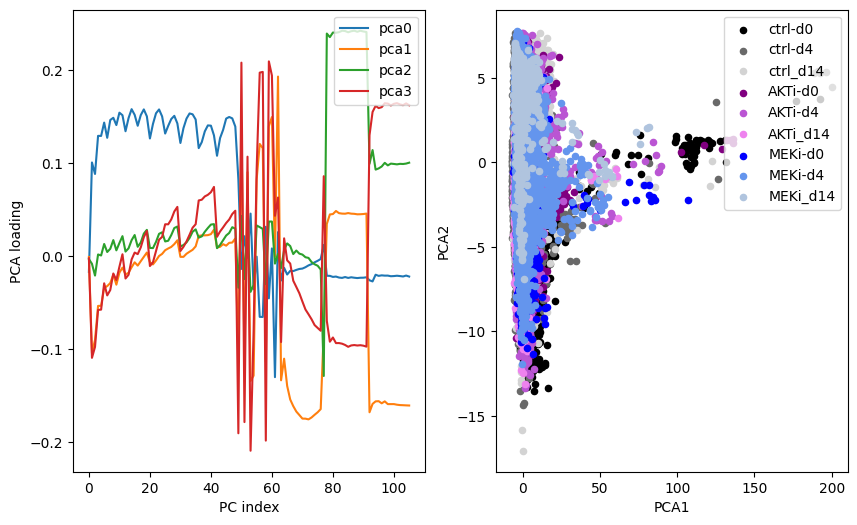

In [18]:
#PCA of image features
#z-norm features
for ifeat in range(Xf.shape[1]): #z-norm all of motility features
    Xf[:,ifeat]=imprep.znorm(Xf[:,ifeat])

Xpca,pca=features.get_pca_fromdata(Xf,var_cutoff=.6); pca.ndim=Xpca.shape[1]

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
for ipca in range(pca.n_components_):
    plt.plot(pca.components_[ipca,:],label=f'pca{ipca}')

plt.ylabel('PCA loading')
plt.xlabel('PC index')
plt.legend(loc='upper right')

plt.subplot(1,2,2)
for i_tm in range(len(tmSet)):
    inds=np.where(indtreatment==i_tm)[0]
    plt.scatter(Xpca[inds,0],Xpca[inds,1],s=20,label=tmSet[i_tm],color=colorSet[i_tm])

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(loc='upper right')
plt.savefig(f'{date}/pca_plot.png')

In [19]:
#motility features
nfeat_com=3
com_feature_list=np.array(['speed','beta','alpha']).astype('S32')
Xf_com=np.zeros((0,nfeat_com))
for i in indgood_models:
    Xf_com=np.append(modelSet[i].m1_comdx_feat,Xf_com,axis=0)

for icom in range(Xf_com.shape[1]): #z-norm all of motility features
    Xf_com[:,icom]=imprep.znorm(Xf_com[:,icom])

In [20]:
#signaling features
corrc_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{sctm.rep_channel}_crosscorr'
    cc=getattr(sctm,attr_str)
    corrc_erk=np.append(corrc_erk,1.-cc)

corrc_erk_std=np.std(corrc_erk);corrc_erk_mean=np.mean(corrc_erk);corrc_erk=imprep.znorm(corrc_erk)

for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{sctm.rep_channel}_crosscorr'
    cc=getattr(sctm,attr_str)
    corrc_z_model=(np.array([1.-cc]).T-corrc_erk_mean)/corrc_erk_std
    modelSet[i].x_signal=corrc_z_model[:,0].copy()

In [24]:
#signaling features
cratio_erk=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    attr_str=f'img{sctm.rep_channel}_m{sctm.mskchannel}mNone_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)

cratio_erk_std=np.std(cratio_erk);cratio_erk_mean=np.mean(cratio_erk);#cratio_erk=imprep.znorm(cratio_erk)

AttributeError: 'Trajectory' object has no attribute 'img3_m1mNone_ratio'

In [21]:
#signaling features
corrc_akt=np.array([]).astype(float)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_akt=np.append(corrc_akt,1.-cc)

corrc_akt_std=np.std(corrc_akt);corrc_akt_mean=np.mean(corrc_akt);corrc_akt=imprep.znorm(corrc_akt)
for i in indgood_models:
    sctm=modelSet[i]
    akt_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
    attr_str=f'm{mskchannel}_img{sctm.nuc_channel}img{akt_channel}_crosscorr'
    cc=getattr(sctm,attr_str)   
    corrc_z_model=(np.array([1.-cc]).T-corrc_akt_mean)/corrc_akt_std
    modelSet[i].x_signal_akt=corrc_z_model[:,0].copy()

In [ ]:
#signaling features
cratio_akt=np.array([]).astype(float)
for i in indgood_models:
    cratio_akt=np.append(cratio_akt,modelSet[i].img2_m1mNone_ratio)

cratio_akt_std=np.std(cratio_akt);cratio_akt_mean=np.mean(cratio_akt);#cratio_akt=imprep.znorm(cratio_akt)

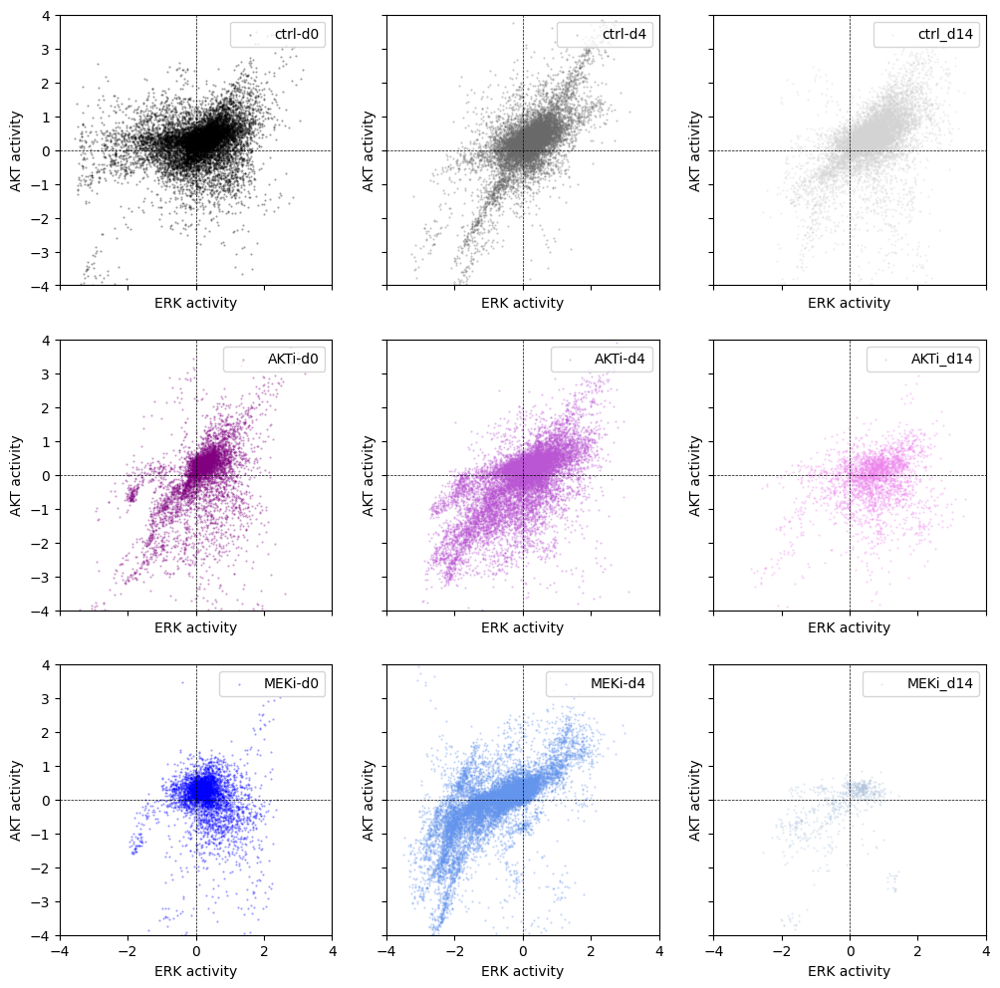

In [107]:
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,sharex=True,sharey=True,figsize=(12,12))
ax=ax.flatten()
xlow=-4;xhigh=4;ylow=-4;yhigh=4
for i_tm in range(len(tmSet)):
    inds=np.where(indtreatment==i_tm)[0]
    ax[i_tm].scatter(corrc_erk[inds],corrc_akt[inds],s=1,marker='.',label=tmSet[i_tm],color=colorSet[i_tm],alpha=.4)
    ax[i_tm].plot([xlow,xhigh],[0,0],'k--',linewidth=.5)
    ax[i_tm].plot([0,0],[ylow,yhigh],'k--',linewidth=.5)
    ax[i_tm].set_xlim(xlow,xhigh)
    ax[i_tm].set_ylim(ylow,yhigh)
    ax[i_tm].legend(loc='upper right')
    ax[i_tm].set_xlabel('ERK activity')
    ax[i_tm].set_ylabel('AKT activity')

plt.savefig(f'{date}/signaling_plot.png')

In [23]:
#put the features for embedding into Xpca feature vector
feature_list=[]
Xpca=np.zeros((Xf.shape[0],0)) #use this if you want to leave out pca morphology features

#for i in range(pca.ndim):
#    feature_list.append(f'pca{i}')
#    Xpca[:,i]=imprep.znorm(Xpca[:,i]) #z-norm?
    
#Xpca=np.concatenate((Xpca,Xf_com),axis=1)
#for i in [0]: #range(len(com_feature_list)):
#    Xpca=np.concatenate((Xpca,Xf_com[:,i][:,np.newaxis]),axis=1)
#    feature_list.append(com_feature_list[i].decode())

Xpca=np.concatenate((Xpca,corrc_erk[:,np.newaxis]),axis=1)
feature_list.append('erk-nuc-corr')

Xpca=np.concatenate((Xpca,corrc_akt[:,np.newaxis]),axis=1)
feature_list.append('akt-nuc-corr')

print(feature_list)

for i in indgood_models:
   indsf=np.where(indcells_models==i)[0]
   modelSet[i].Xpca=Xpca[indsf,:]

['erk-nuc-corr', 'akt-nuc-corr']


In [123]:
np.sum(np.isfinite(Xf_com[:,2]))

47037

#### Trajectory embedding

In [24]:
#Analysis identifiers
data_id=f'T4mammary_{date}'

In [25]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracked cell 312, 2 tracks, 300 left
tracked cell 2, 1 tracks, 0 left
tracked cell 5, 1 tracks, 0 left
tracked cell 7, 1 tracks, 0 left
tracked cell 43, 11 tracks, 0 left
tracked cell 3, 1 tracks, 0 left
tracked cell 492, 8 tracks, 300 left
tracked cell 1, 1 tracks, 0 left
tracked cell 12, 2 tracks, 0 left
tracked cell 386, 1 tracks, 100 left
tracked cell 12, 1 tracks, 0 left
tracked cell 346, 4 tracks, 300 left
tracked cell 23, 2 tracks, 0 left
tracked cell 11, 1 tracks, 0 left
tracked cell 16, 2 tracks, 0 left
tracked cell 446, 1 tracks, 200 left
tracked cell 7, 1 tracks, 0 left
tracked cell 4, 1 tracks, 0 left
tracked cell 0, 1 tracks, 0 left
tracked cell 34, 17 tracks, 0 left
tracked cell 2, 1 tracks, 0 left
tracked cell 84, 29 tracks, 0 left
tracked cell 2076, 2 tracks, 1400 left
tracked cell 1340, 1 tracks, 700 left
tracked cell 1225, 16 tracks, 600 left
tracked cell 376, 3 tracks, 200 left
tracked cell 253, 8 tracks, 100 left
tracked cell 0, 1 tracks, 0 left
tracked cell 1489, 1

In [ ]:
##we are going to edit this to save data for analysis elsewhere
for i_tm in range(nf):
    cellindex=np.arange
    df=pandas.DataFrame(data=cellindex)
df['cellid']=cellids
df['frame']=frames
df['field']=fields
df['x']=xset
df['y']=yset
df['fb']=cbset
df.to_csv('CREBi_quantification_JC_31oct22.csv')
    

/tmp/ipykernel_28968/1183447620.py:43: RuntimeWarning: Mean of empty slice
  meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
/tmp/ipykernel_28968/1183447620.py:44: RuntimeWarning: Mean of empty slice
  meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)


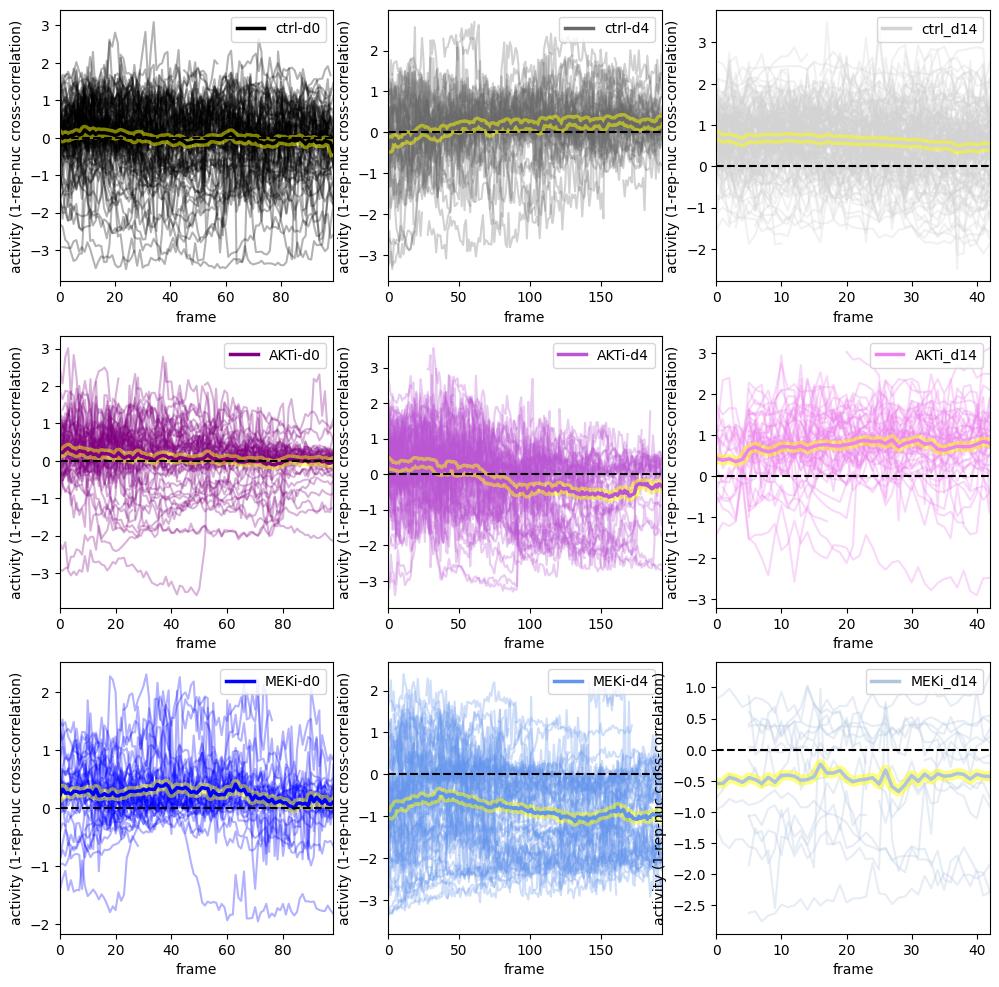

<Figure size 1000x1000 with 0 Axes>

In [108]:
#make a plot of single-cell trajectories, averages, and conditions by frame
nplots=int(np.ceil(np.sqrt(nf)))
fig,ax=plt.subplots(nplots,nplots,figsize=(12,12))
ax=ax.flatten()
min_traj_len=10
fig=plt.figure(figsize=(10,10))
trajSet_erk=[None]*len(tmSet)
trajSet_akt=[None]*len(tmSet)
#trajSet_fra1=[None]*len(tmSet)
meanSet_erk=[None]*len(tmSet)
meanSet_akt=[None]*len(tmSet)
#meanSet_fra1=[None]*len(tmSet)
nt=200
for i_tm in range(len(tmSet)):
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    trajs_erk=np.zeros((0,nt))
    trajs_akt=np.zeros((0,nt))
    #trajs_fra1=np.zeros((0,nt))
    frames=np.zeros((0,nt))
    for imodel in ind_models:
        for itraj in range(len(modelSet[imodel].trajectories)):
            trajlen=modelSet[imodel].trajectories[itraj].size
            if trajlen>min_traj_len:
                inds=modelSet[imodel].trajectories[itraj]
                frames=modelSet[imodel].cells_frameSet[inds]
                #cr_erk=modelSet[imodel].img3_m0m1_ratio[inds]
                #cr_akt=modelSet[imodel].img2_m0m1_ratio[inds]
                cr_erk=modelSet[imodel].x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                cr_akt=modelSet[imodel].x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                #cr_fra1=modelSet[imodel].Xf[inds,indfra1]
                tr_erk=np.ones(nt)*np.nan
                tr_akt=np.ones(nt)*np.nan
                #tr_fra1=np.ones(nt)*np.nan
                tr_erk[frames]=cr_erk
                tr_akt[frames]=cr_akt
                #tr_fra1[frames]=cr_fra1
                trajs_erk=np.append(trajs_erk,tr_erk[np.newaxis,:],axis=0)
                trajs_akt=np.append(trajs_akt,tr_akt[np.newaxis,:],axis=0)
                #trajs_fra1=np.append(trajs_fra1,tr_fra1[np.newaxis,:],axis=0)
                ax[i_tm].plot(frames,cr_erk,'-',color=colorSet[i_tm],alpha=.3)
                #ax[i_tm].plot(frames,cr_akt,'-',color=colorSet[i_tm],alpha=.1)
    meanSet_erk[i_tm]=np.nanmean(trajs_erk,axis=0)
    meanSet_akt[i_tm]=np.nanmean(trajs_akt,axis=0)
    #meanSet_fra1[i_tm]=np.nanmean(trajs_fra1,axis=0)
    ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color='yellow',alpha=.5,linewidth=7.5)
    ax[i_tm].plot(np.arange(nt),meanSet_erk[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    #ax[i_tm].plot(np.arange(nt),meanSet_akt[i_tm],'-',color=colorSet[i_tm],alpha=1.,linewidth=2.5,label=tmSet[i_tm])
    ax[i_tm].plot([0,nt],[0,0],'k--')
    ax[i_tm].set_xlim(0,np.max(np.where(np.isfinite(meanSet_erk[i_tm]))[0]))
    trajSet_erk[i_tm]=trajs_erk.copy()
    trajSet_akt[i_tm]=trajs_akt.copy()
    #trajSet_fra1[i_tm]=trajs_fra1.copy()
    ax[i_tm].set_xlabel('frame')
    ax[i_tm].set_ylabel('activity (1-rep-nuc cross-correlation)')
    ax[i_tm].legend(loc='upper right')
    
plt.savefig(f'{date}/mean_erk_signalingvtime_{data_id}.png')
#plt.savefig(f'{date}/mean_akt_signalingvtime_{data_id}.png')
        

In [26]:
def show_cellsignal(self,ax,icell,cmap_nuc=plt.cm.Purples,cmap_rep=plt.cm.inferno,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False,show_seg=True):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0,1],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            #img_bf=imprep.znorm(np.max(img_bf,axis=0))
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,90);nuchigh=np.percentile(img_nuc,99)
        img_bf=np.abs(img_bf)
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        ax.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        if show_neighbor_signals:
            ax.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
        else:
            ax.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=cmap_rep,alpha=.7)
        csn=ax.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=cmap_nuc,alpha=0.6,linewidths=1)
        if show_seg:
            csn=ax.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        ax.axis('off')
        return 0
    except Exception as e:
        print(e)
        return 1

In [350]:
tmSet

['ctrl-d0',
 'ctrl-d4',
 'ctrl_d14',
 'AKTi-d0',
 'AKTi-d4',
 'AKTi_d14',
 'MEKi-d0',
 'MEKi-d4',
 'MEKi_d14']

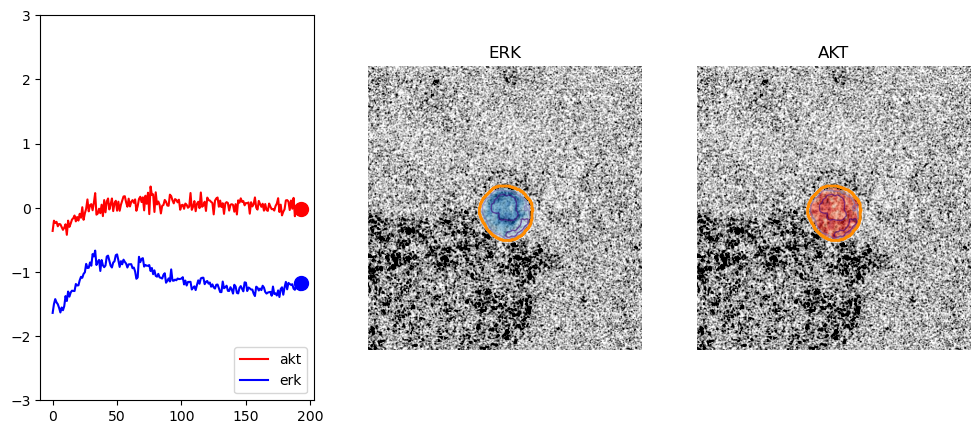

In [395]:
#explore some single-cell signaling trajectories
min_traj_len=50
ntraj_show=1
save_pic=True
pic_directory=f'{date}/signaltraj_{date}'
os.system(f'mkdir -p {pic_directory}')
for i_tm in range(len(tmSet)):
    ind_models=np.where(inds_tmSet_models==i_tm)[0]
    ind_models=np.intersect1d(ind_models,indgood_models)
    for imodel in ind_models:
        sctm=modelSet[imodel]
        itraj_show=0
        ntraj=len(modelSet[imodel].trajectories)
        trajlengths=np.zeros(ntraj)
        erk_means=np.zeros(ntraj)
        erk_stds=np.zeros(ntraj)
        for itraj in range(ntraj):
            trajlengths[itraj]=sctm.trajectories[itraj].size
            erk_stds[itraj]=np.std(sctm.x_signal[sctm.trajectories[itraj]])
            erk_means[itraj]=np.max(sctm.x_signal[sctm.trajectories[itraj]])
        indtrajs=np.flip(np.argsort(erk_stds))
        for itr in range(ntraj):
            itraj=indtrajs[itr]
            if trajlengths[itraj]>min_traj_len:
                if itraj_show<ntraj_show:
                    itraj_show=itraj_show+1
                    inds=sctm.trajectories[itraj]
                    frames=sctm.cells_frameSet[inds]
                    #cr_erk=sctm.img3_m0m1_ratio[inds]
                    #cr_akt=sctm.img2_m0m1_ratio[inds]
                    cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
                    cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
                    for itt in [inds.size-1]: #range(inds.size):
                        ic=inds[itt]
                        fig,ax=plt.subplots(1,3,figsize=(12,5))
                        ax[1].set_title('ERK')
                        show_cellsignal(sctm,ax[1],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[2].set_title('AKT')
                        show_cellsignal(sctm,ax[2],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
                        ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
                        ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
                        ax[0].set_ylim(-3,3)
                        ax[0].legend(loc='lower right')
                        ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
                        ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
                        if save_pic:
                            plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
                        plt.pause(1)
                        clear_output(wait=True)
                        

In [510]:
tmSet

['ctrl-d0',
 'ctrl-d4',
 'ctrl_d14',
 'AKTi-d0',
 'AKTi-d4',
 'AKTi_d14',
 'MEKi-d0',
 'MEKi-d4',
 'MEKi_d14']

In [99]:
inds_tm=[3] #[0,0,0,0,3,3,4,4,0,0,0,0,1,1,6]
inds_models=[50] #[3,4,10,14,21,50,65,122,5,38,41,46,102,111,32]
inds_traj=[41] #[6,1,6,2,5,41,0,37,36,2,2,7,0,1,0]
movie_directory=f'{date}/signaltraj_{date}/movies'
os.system(f'mkdir -p {movie_directory}')
save_pic=True
for imovie in range(len(inds_tm)):
    i_tm=inds_tm[imovie]
    imodel=inds_models[imovie]
    itraj=inds_traj[imovie]
    sctm=modelSet[imodel]
    inds=sctm.trajectories[itraj]
    frames=sctm.cells_frameSet[inds]
    inds=sctm.trajectories[itraj]
    frames=sctm.cells_frameSet[inds]
    #cr_erk=sctm.img3_m0m1_ratio[inds]
    #cr_akt=sctm.img2_m0m1_ratio[inds]
    cr_erk=sctm.x_signal[inds] #1.-modelSet[imodel].m0_img0img3_crosscorr[inds]
    cr_akt=sctm.x_signal_akt[inds] #1.-modelSet[imodel].m0_img0img2_crosscorr[inds]
    pic_directory=f'{date}/signaltraj_{date}'
    movie_directory=f'{date}/signaltraj_{date}/movies'
    os.system(f'mkdir -p {movie_directory}')
    for itt in range(inds.size):
        ic=inds[itt]
        fig,ax=plt.subplots(1,3,figsize=(12,5))
        ax[1].set_title('ERK')
        show_cellsignal(sctm,ax[1],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Blues,cyto_msk_channel=cyto_msk_channel,rep_img_channel=erk_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
        ax[2].set_title('AKT')
        show_cellsignal(sctm,ax[2],ic,projection=False,show_seg=True,cmap_rep=plt.cm.Reds,cyto_msk_channel=cyto_msk_channel,rep_img_channel=akt_img_channel,nuc_img_channel=nuc_img_channel,bf_img_channel=bf_img_channel,viewsize=120,npix=100,sigma=3.,zoom=2,show_neighbor_signals=True)
        ax[0].plot(frames,cr_akt,'-',color='red',alpha=1.,label='akt')
        ax[0].plot(frames,cr_erk,'-',color='blue',alpha=1.,label='erk')
        if np.nanmax(cr_erk)>3:
            ymax=np.nanmax(cr_erk)
        else:
            ymax=3
        if np.nanmin(cr_erk)<-3:
            ymin=np.nanmin(cr_erk)
        else:
            ymin=-3
        ax[0].set_ylim(ymin,ymax)
        ax[0].legend(loc='lower left')
        ax[0].scatter([frames[itt]],[cr_erk[itt]],s=100,marker='o',c='blue')
        ax[0].scatter([frames[itt]],[cr_akt[itt]],s=100,marker='o',c='red')
        if save_pic:
            plt.savefig(f'{pic_directory}/{tmSet[i_tm]}_slice_m{imodel}traj{itraj}c{inds[-1]}_{itt:04d}.png')
        plt.pause(.01)
        clear_output(wait=True)
    picstring=f'{tmSet[i_tm]}_actualslice_m{imodel}traj{itraj}c{inds[-1]}'
    cmd_str=f'ffmpeg -y -r 20 -framerate 1 -start_number 0000 -i {pic_directory}/{picstring}_%04d.png -c:v libx264 -preset slow  -profile:v high -level:v 4.0 -pix_fmt yuv420p -crf 22 -codec:a aac -vf "pad=ceil(iw/2)*2:ceil(ih/2)*2" {movie_directory}/{picstring}.mp4'
    os.system(cmd_str)


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [401]:
pic_directory=f'{date}/signaltraj_{date}'
movie_directory=f'{date}/signaltraj_{date}/movies'
os.system(f'mkdir -p {movie_directory}')
picstring=f'{tmSet[i_tm]}_slice_m{imodel}traj{itraj}c{inds[-1]}'
cmd_str=f'ffmpeg -y -r 20 -framerate 1 -start_number 0000 -i {pic_directory}/{picstring}_%04d.png -c:v libx264 -preset slow  -profile:v high -level:v 4.0 -pix_fmt yuv420p -crf 22 -codec:a aac -vf "pad=ceil(iw/2)*2:ceil(ih/2)*2" {movie_directory}/{picstring}.mp4'
os.system(cmd_str)

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

0

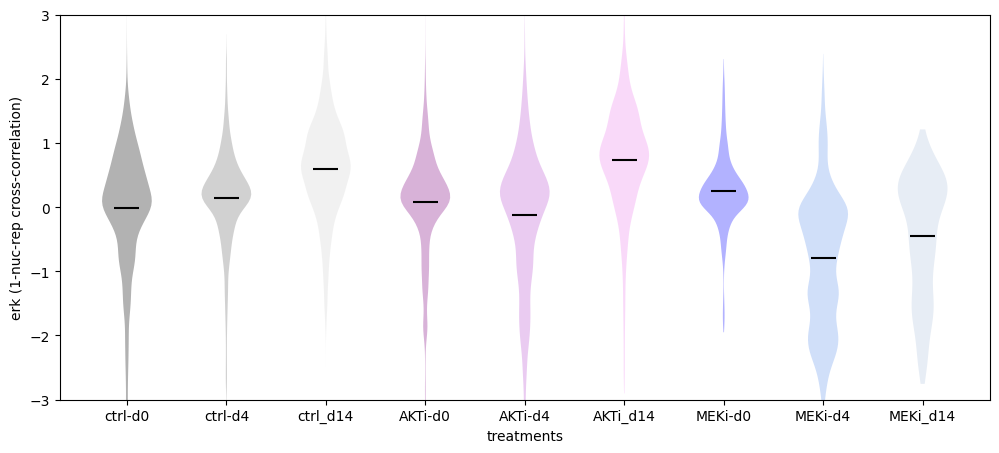

In [109]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_erk[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
ax.set_ylim(-3,3)
plt.ylabel('erk (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_erk_tearplot_{data_id}.png')

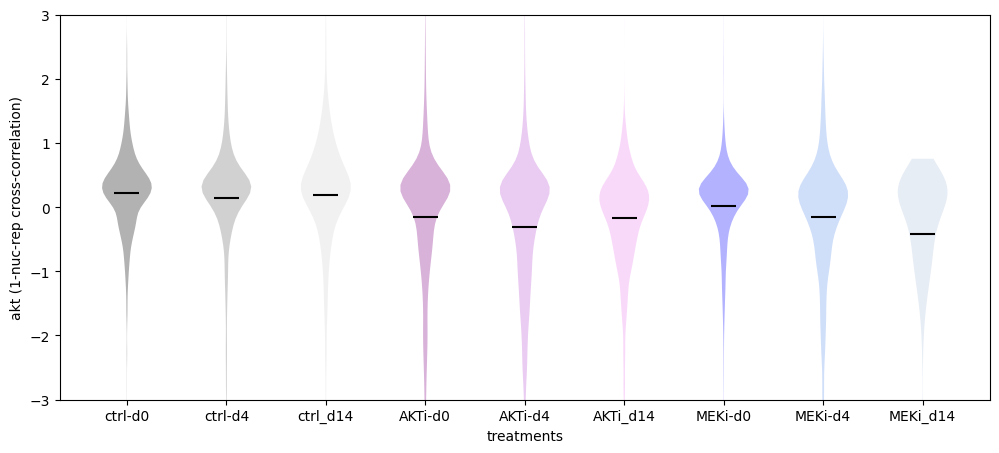

In [110]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
for i_tm in range(n_tm):
    setv=trajSet_akt[i_tm][:,min_frame:]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
ax.set_ylim(-3,3)
plt.ylabel('akt (1-nuc-rep cross-correlation)')
plt.xlabel('treatments')
plt.savefig(f'{date}/signaling_akt_tearplot_{data_id}.png')

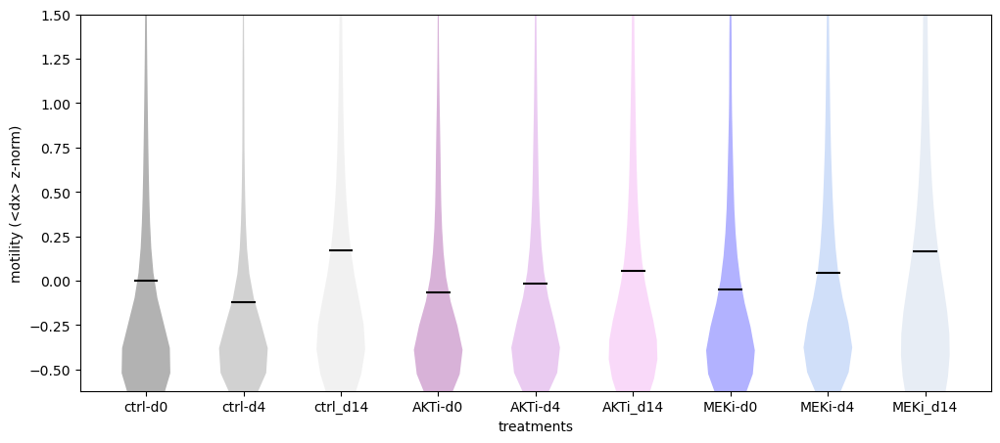

In [36]:
min_frame=0
plt.figure(figsize=(12,5))
ax=plt.gca()
n_tm=len(tmSet)
signalSet=[None]*n_tm
ifeat=0 #np.where(modelSet[0].Xf_feature_list==b'meanIntensity_msk0img1')[0][0]
for i_tm in range(n_tm):
    inds=indtreatment==i_tm
    setv=Xf_com[inds,ifeat]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        signalSet[i_tm]=setv
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor(colorSet[i_tm])

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.ylabel('motility (<dx> z-norm)')
plt.xlabel('treatments')
plt.ylim(-.62,1.5)
plt.savefig(f'{date}/motility_tearplot_{data_id}.png')

Signaling state analysis

In [37]:
#signal environment feature
scut=0.
sigState=np.array([]).astype(int)
for i in indgood_models:
    sigState=np.append(sigState,modelSet[i].x_signal>scut)
    modelSet[i].sigState=modelSet[i].x_signal>scut

In [369]:
sigState

array([0, 1, 1, ..., 1, 1, 1])

In [ ]:
ray.shutdown()

In [371]:
import ray; ray.init()

2024-05-24 17:12:44,422	INFO util.py:154 -- Outdated packages:
  ipywidgets==7.8.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-24 17:12:47,534	INFO worker.py:1740 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


Python version:,3.9.19
Ray version:,2.20.0
Dashboard:,http://127.0.0.1:8265


(raylet) Spilled 2223 MiB, 11 objects, write throughput 346 MiB/s. Set RAY_verbose_spill_logs=0 to disable this message.
(raylet) Spilled 4245 MiB, 21 objects, write throughput 471 MiB/s.
(raylet) Spilled 23047 MiB, 114 objects, write throughput 86 MiB/s.
(raylet) Spilled 23250 MiB, 115 objects, write throughput 87 MiB/s.


(get_smean_csize_distributed pid=847676) Solver suite is petsc
(get_smean_csize_distributed pid=847676) {'python': '3.9.19 | packaged by conda-forge | (main, Mar 20 2024, 12:50:21) | [GCC 12.3.0]', 'fipy': '3.4.4', 'numpy': '1.26.4', 'pysparse': 'not installed', 'scipy': '1.13.0', 'matplotlib': '3.8.4', 'mpi4py': '3.1.6', 'petsc4py': '3.21.1', 'pyamgx': 'not installed', 'PyTrilinos': 'not installed', 'mayavi': '4.8.2.dev0', 'gmsh': 'not installed', 'solver': 'petsc'}
(get_smean_csize_distributed pid=847654) Solver suite is petsc [repeated 35x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)
(get_smean_csize_distributed pid=847657) ?, 44
(get_smean_csize_distributed pid=847657) /home/groups/CEDAR/copperma/dyn-cell-sys/mammary_organoid/Derivation_2024_04_08/20240408_Mammary_Organoid_T4_ERK003_xy15_roi0.h5
(get_

In [386]:
@ray.remote
def get_smean_csize_distributed(imodel,db):
    print(f'?, {imodel}')
    sctm=db[imodel]
    print(sctm.h5filename)
    rsmooth=sctm.cellpose_diam/4.
    zcut=2.0
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    for iframe in range(sctm.nt):
        print(f'extracting cluster data for model {imodel}, frame {iframe}')
        msk=sctm.get_mask_data(iframe);
        msk_cyto=msk[...,cyto_msk_channel];
        #msk_nuc=msk[...,nuc_msk_channel];
        img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
        img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
        fmsk=imprep.znorm(img_rep_smth)>zcut
        indframe=np.where(sctm.cells_frameSet==iframe)[0]
        sigS=sctm.x_signal[indframe]
        fmap=imprep.get_feature_map(sigS,msk_cyto)
        msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
        for icluster in np.unique(msk_clusters)[1:]:
            #print(f'{iframe}, {icluster}')
            indc=np.unique(msk_cyto[msk_clusters==icluster])
            indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
            if indc.size>0:
                Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
                csize=np.append(csize,indc.size)
    sctm.Smean_csize=Smean_csize
    sctm.csize=csize
    sctm.save_to_h5('/cell_data_m1/',['Smean_csize','csize'],overwrite=True)
    return Smean_csize,csize

In [ ]:
print(tmSet)
inds_tmSet_models

In [399]:
#result=get_smean_csize_distributed(indgood_models[0],modelSet)
len(indgood_models)

155

In [383]:
modelSet[indgood_models[0]].load_from_h5('/cell_data_m1/')

loading /home/groups/CEDAR/copperma/dyn-cell-sys/projects/mammary_organoid/20240214_T4mammaryorganoid_FA/20240214_T4mammaryorganoid_FA_xy0_roi0.h5:/cell_data_m1/


True

In [423]:
plt.scatter(modelSet[indgood_models[2]].csize,modelSet[indgood_models[2]].Smean_csize)

AttributeError: 'Trajectory' object has no attribute 'csize'

In [388]:
#get cluster size dependence with signaling
#db_object_ref = ray.put(modelSet)
#indmodels_ctrl=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels_ctrl,indgood_models)
results2 = ray.get([get_smean_csize_distributed.remote(imodel, modelSet) for imodel in list(indgood_models)])

In [420]:
len(results2[1])

2

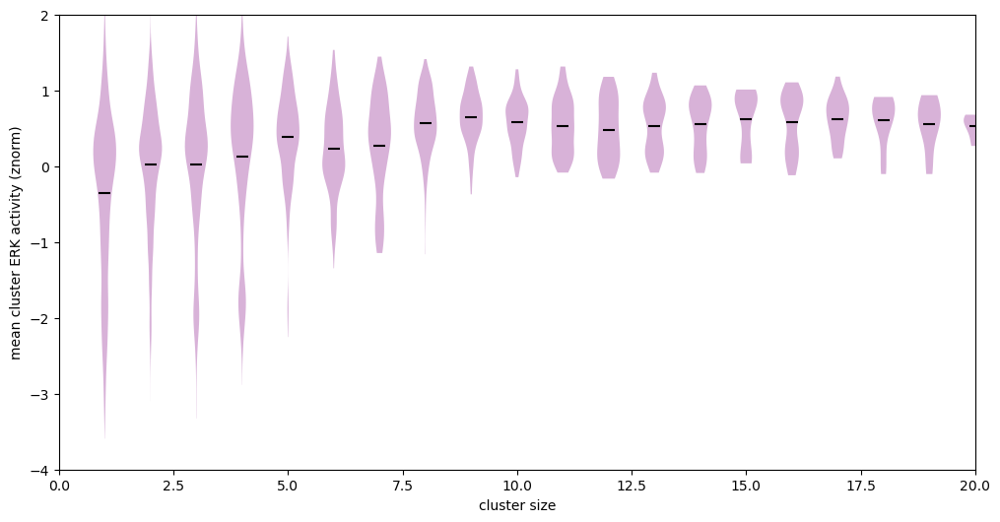

In [412]:
csize=np.array([]).astype(int)
Smean_csize=np.array([]).astype(float)
inds_csize_models=np.array([]).astype(int)
#indmodels=np.where(inds_tmSet_models==0)[0]
#indmodels=np.intersect1d(indmodels,indgood_models)
for imodel in indgood_models: #indmodels:
    iresult=np.where(indgood_models==imodel)[0][0]
    csize=np.append(csize,results2[iresult][1])
    Smean_csize=np.append(Smean_csize,results2[iresult][0])
    inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)

plt.figure(figsize=(12,6))
ax=plt.gca()
for i_size in range(np.max(csize)):
    inds=csize==i_size
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')    
plt.ylabel('mean cluster ERK activity (znorm)')
plt.xlabel('cluster size')
plt.ylim(-4,2)
plt.xlim(0,20)
plt.savefig(f'{date}/smeans_csize_{data_id}.png')
plt.pause(.1)

In [101]:
Smean_csize_set=[None]*nf
csize_set=[None]*nf
for i_tm in range(nf):
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        iresult=np.where(indgood_models==imodel)[0][0]
        csize=np.append(csize,modelSet[imodel].csize)
        Smean_csize=np.append(Smean_csize,modelSet[imodel].Smean_csize)
        inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)
    Smean_csize_set[i_tm]=Smean_csize.copy()
    csize_set[i_tm]=csize.copy()


In [ ]:
Smean_csize_set=[None]*nf
csize_set=[None]*nf
for i_tm in range(nf):
    csize=np.array([]).astype(int)
    Smean_csize=np.array([]).astype(float)
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        iresult=np.where(indgood_models==imodel)[0][0]
        csize=np.append(csize,results2[iresult][1])
        Smean_csize=np.append(Smean_csize,results2[iresult][0])
        inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)
    Smean_csize_set[i_tm]=Smean_csize.copy()
    csize_set[i_tm]=csize.copy()

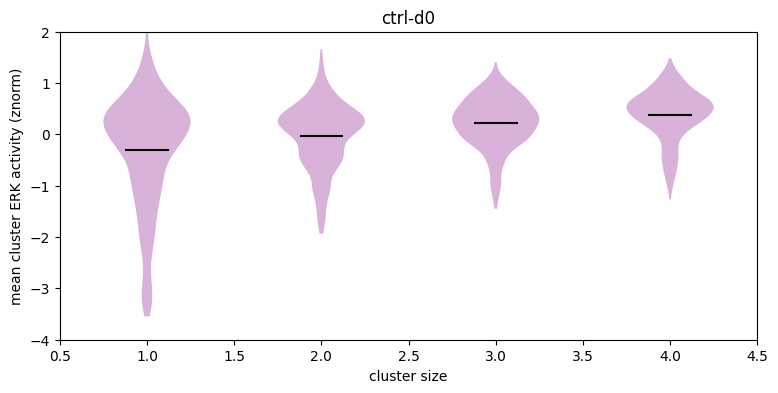

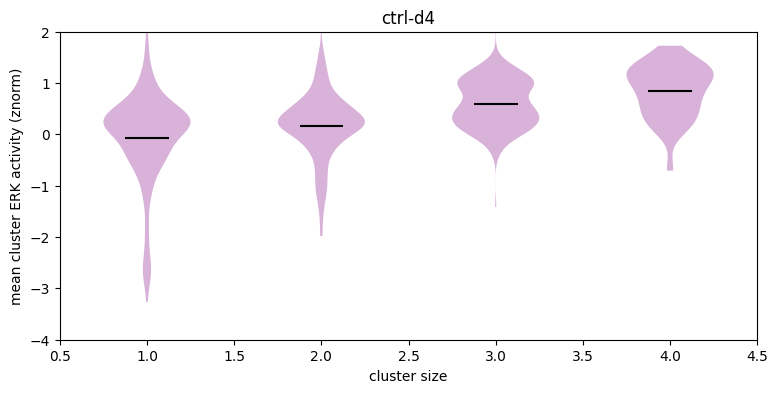

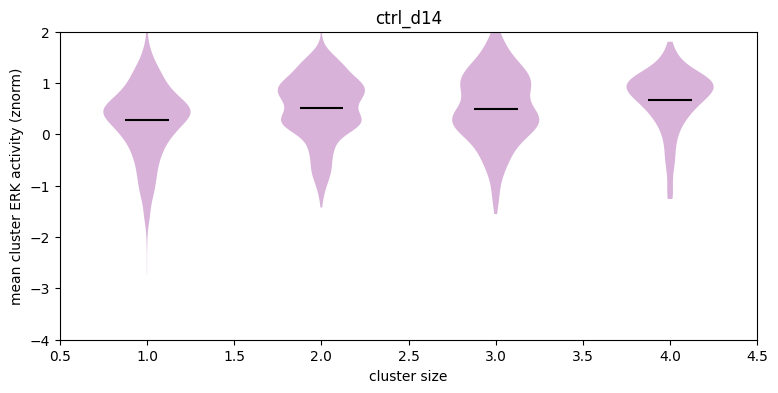

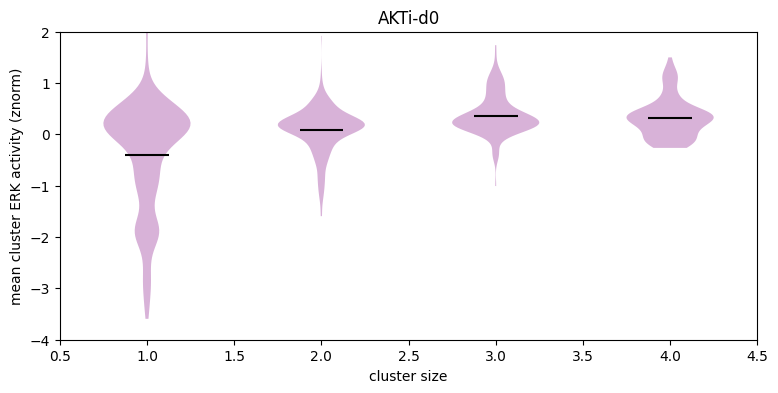

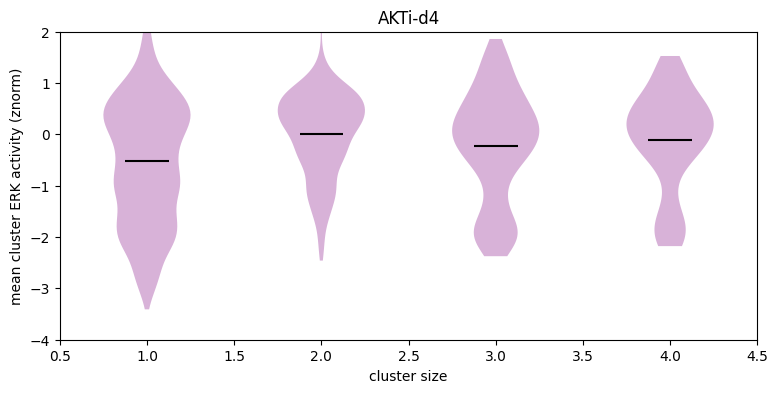

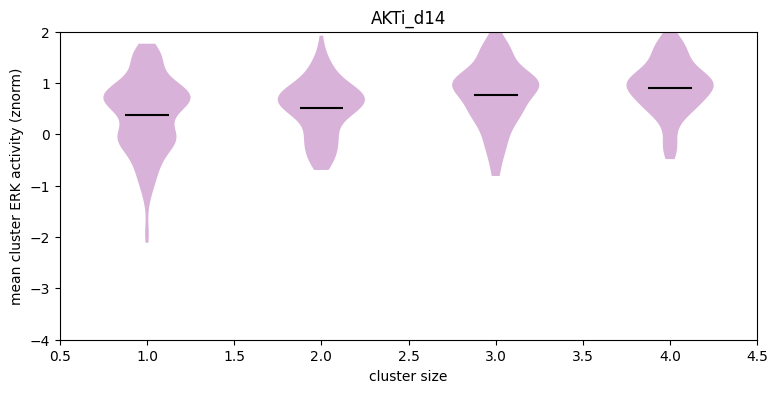

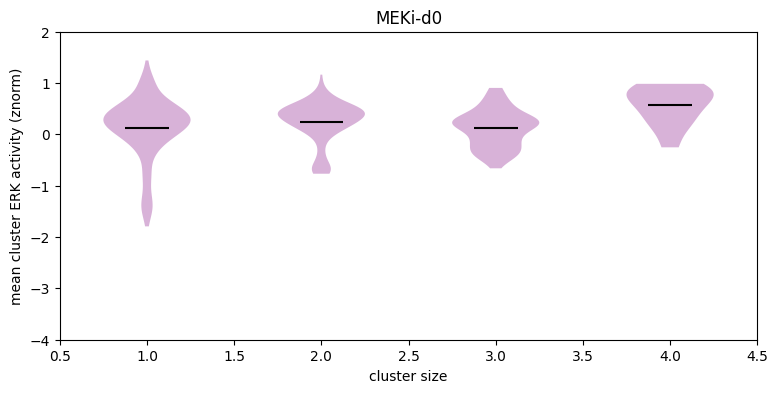

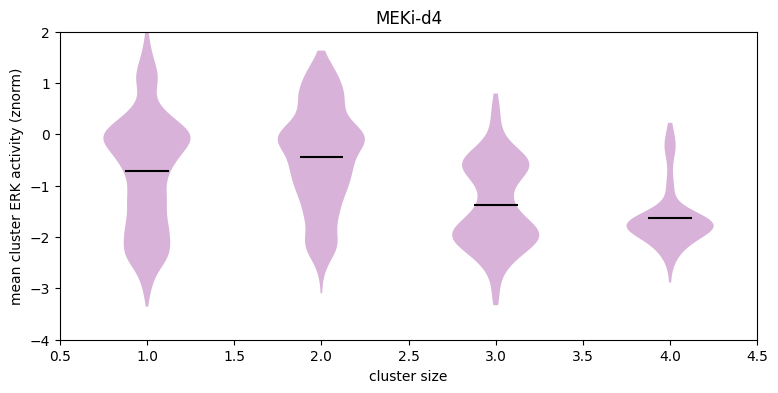

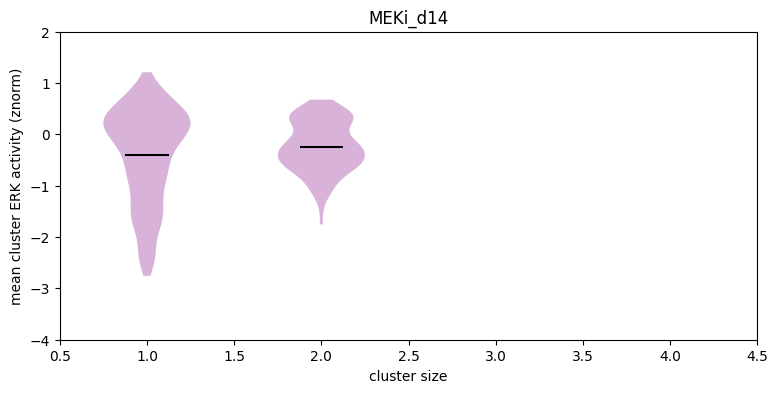

In [106]:
for i_tm in range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]
    plt.figure(figsize=(9,4))
    ax=plt.gca()
    for i_size in range(np.max(csize)):
        inds=csize==i_size
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('purple')    
    plt.ylabel('mean cluster ERK activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    plt.ylim(-4,2)
    plt.xlim(0.5,4.5)
    plt.savefig(f'{date}/smeans_csize_{data_id}_{tmSet[i_tm]}.png')
    plt.pause(.1)

In [432]:
iresult

154

NameError: name 'csize' is not defined

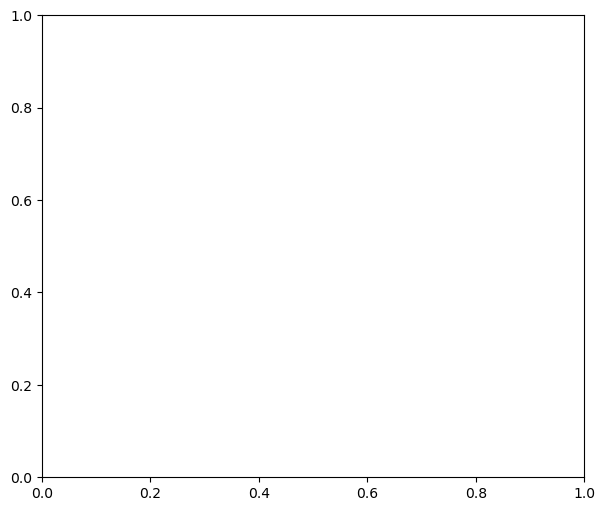

In [38]:
plt.figure(figsize=(7,6))
ax=plt.gca()
for i_tm in range(len(tmSet)):
    indm=np.where(inds_tmSet_models==i_tm)[0]
    inds_csize=np.where(csize==1)[0]
    inds_tm=np.where(np.isin(inds_csize_models,indm))[0]
    inds=np.intersect1d(inds_tm,inds_csize)
    setv=Smean_csize[inds]
    setv=setv[np.isfinite(setv)]
    if setv.size>0:
        vplot=ax.violinplot(setv,positions=[i_tm+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('purple')

ax.set_xticks(range(1,n_tm+1))
ax.set_xticklabels(tmSet)
plt.xlabel('treatments')
plt.ylabel('mean ERK signal (z-norm)')
#plt.ylim(0,1.1)
#plt.savefig(f'{date}/smeans_csize_{data_id}.png')

In [ ]:
inds_csize

In [ ]:
iframe=0
print(f'extracting cluster data for model {i}, frame {iframe}')
msk=sctm.get_mask_data(iframe);
msk_cyto=msk[...,cyto_msk_channel];
msk_nuc=msk[...,nuc_msk_channel];
img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
fmsk=imprep.znorm(img_rep_smth)>zcut
indframe=np.where(sctm.cells_frameSet==iframe)[0]
sigS=sctm.sigState[indframe]
fmap=imprep.get_feature_map(sigS,msk_cyto)
msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
for icluster in np.unique(msk_clusters)[1:]:
    indc=np.unique(msk_cyto[msk_clusters==icluster])
    indc=indc[indc>0]-1 #indices one less than labeled mask, ignore 0
    if indc.size>0:
        Smean_csize=np.append(Smean_csize,np.mean(sigS[indc]))
        csize=np.append(csize,indc.size)
        if visual_csize and indc.size>0:
            plt.clf()
            print(np.unique(msk_clusters))         
            plt.contour(np.max(fmap,axis=0),levels=[0,1],colors='red')
            img_test=np.zeros_like(img_rep);img_test[msk_clusters==icluster]=np.mean(sigS[indc])
            plt.imshow(np.max(img_test,axis=0),clim=(0,1),cmap=plt.cm.Reds)
            plt.contour(np.max(msk_clusters,axis=0),levels=np.unique(msk_clusters),cmap=plt.cm.Greens)
            plt.pause(.1)

In [319]:
def get_tcf(self, trajectories=None, x=None, minlength=2):
    if x is None:
        x=self.Xpca
    if trajectories is None:
        trajectories = self.trajectories
    ntraj = len(trajectories)
    traj_lengths = np.zeros(ntraj)
    for itraj in range(ntraj):
        traj_lengths[itraj] = trajectories[itraj].size
    nframes = np.max(traj_lengths)
    nt = np.floor(nframes / 2).astype(int)
    dxcorr = np.zeros(nt)
    tnorm = np.zeros(nt)
    for itraj in range(ntraj):
        cell_traj = trajectories[itraj]
        traj_len = cell_traj.size
        nmax = np.floor(traj_len / 2).astype(int)
        if traj_len > minlength:
            xtraj = x[cell_traj,:]
            for it1 in range(nmax):
                for it2 in range(it1, it1 + nmax):
                    it = it2 - it1
                    #dxcorr[it] = dxcorr[it] + np.sum(np.power(xtraj[it1, :]-xtraj[it2, :],2))
                    corr=np.dot(xtraj[it1,:],xtraj[it2,:])
                    if np.isfinite(corr):
                        dxcorr[it]=dxcorr[it]+corr
                        tnorm[it] = tnorm[it] + 1
    for it in range(nt):
        dxcorr[it] = dxcorr[it] / tnorm[it]
    return dxcorr

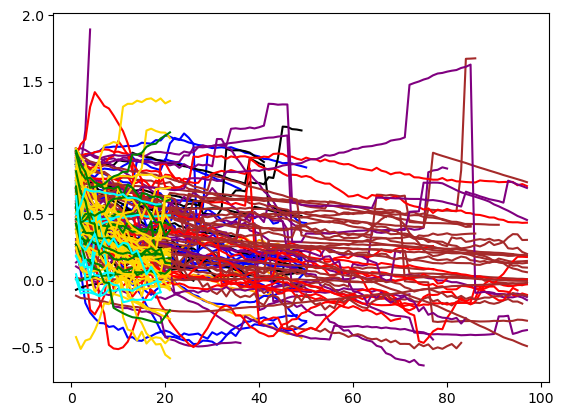

In [189]:
tcfSet=[None]*nmodels
for imodel in indgood_models:
    sctm=modelSet[imodel]
    tcf=sctm.get_tcf(x=sctm.Xpca,minlength=1)
    av_sq=np.sum(np.power(np.nanmean(sctm.Xpca,axis=0),2))
    avsq=np.nanmean(np.power(np.linalg.norm(sctm.Xpca,axis=1),2))
    tcf=(tcf-av_sq)/tcf[0] #auto-correlation
    tcfSet[imodel]=tcf
    plt.plot(np.arange(1,tcf.size+1),tcf,color=colorSet[inds_tmSet_models[imodel]],label=tmSet[inds_tmSet_models[imodel]])


/tmp/ipykernel_2109301/1962440446.py:10: RuntimeWarning: Mean of empty slice
  tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)


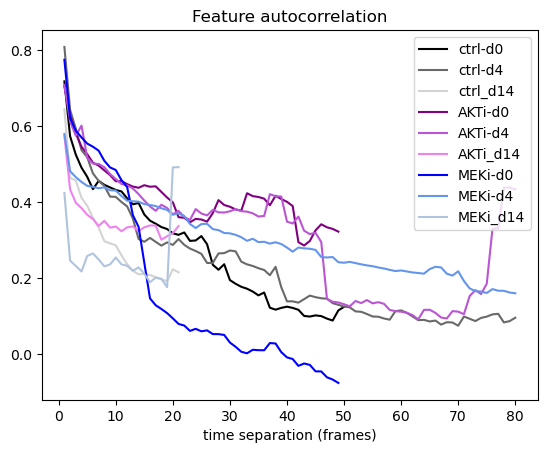

In [410]:
tcf_tm=[None]*nf
tmax=80
for i_tm in range(nf):
    ind_models=indgood_models[inds_tmSet_models[indgood_models]==i_tm]
    tcfs=np.ones((tmax,ind_models.size))*np.nan
    for ii in range(ind_models.size):
        tmax_model=tcfSet[ind_models[ii]].size
        tmax_model=np.min(np.array([tmax,tmax_model]))
        tcfs[0:tmax_model,ii]=tcfSet[ind_models[ii]][0:tmax_model]
    tcf_tm[i_tm]=np.nanmean(tcfs,axis=1)
    plt.plot(np.arange(1,tmax+1),tcf_tm[i_tm],color=colorSet[i_tm],label=tmSet[i_tm])

#plt.ylim(-.1,.3)
plt.title('Feature autocorrelation');plt.xlabel('time separation (frames)');plt.legend(loc='upper right')
plt.savefig(f'{date}/timecorrelations_{data_id}.png')

In [65]:
sctm.Xpca[:,0]

array([ 0.17084293,  0.11891695,  0.21667627,  0.3226894 , -0.17503034,
       -0.08679219, -0.11704893, -0.22805839, -0.11755464, -0.11376409,
       -0.40957929, -0.16972377, -0.25592696, -0.13565864,  0.08303833,
       -0.10988982,  0.04904304,  0.05354362, -0.18788386,  0.18068815,
        0.16317437,  0.17675529,  0.08878995, -0.07447307, -0.20734184,
       -0.02834856,  0.13446553, -0.03005006, -0.05955116,  0.02934457,
        0.0354108 ,  0.0735306 ,  0.13860081,  0.19470199,  0.38237569,
        0.05422065,  0.02775272, -0.24050789,  0.41505017, -0.03965284,
        0.11025513])

In [ ]:
indgood_models

In [27]:
#trajectory embedding
trajl=49
ind_cb=np.where(Xf_feature_list==b'featBoundaryCB-0_msk1img0_fmsk')[0][0]
ind_cbc=np.where(Xf_feature_list==b'featBoundaryCB-0_msk1cmsk1')[0][0]
pca.ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,pca.ndim*trajl))
indtreatment_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
cbc_ratio_traj=np.array([])
cb_ratio_traj=np.array([])
corrc_erk_traj=np.array([]).astype(float)
z_traj=np.array([]).astype(float)
corrc_erk_full_traj=np.zeros((0,trajl))
corrc_akt_traj=np.array([]).astype(float)
corrc_akt_full_traj=np.zeros((0,trajl))
cbc_ratio_full_traj=np.zeros((0,trajl))
cb_ratio_full_traj=np.zeros((0,trajl))
dx_full_traj=np.zeros((0,trajl))
dx_traj=np.array([])
beta_traj=np.array([])
alpha_traj=np.array([])
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    #datacom=modelSet[i].Xf_com[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    #datacom=datacom.reshape(modelSet[i].traj.shape[0],modelSet[i].Xf_com.shape[1]*trajl)
    #data=np.append(data,datacom,axis=1)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indtreatment_traj=np.append(indtreatment_traj,i*np.ones(data.shape[0]).astype(int))
    indstacks=modelSet[i].cells_imgfileSet[modelSet[i].traj[:,0]]
    indstack_traj=np.append(indstack_traj,indstacks)
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,0]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    #cc_ratio=modelSet[i].cc_ratio[cellinds1]
    #cc_ratio_traj=np.append(cc_ratio_traj,cc_ratio)
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)
    corrc_erk_traj=np.append(corrc_erk_traj,modelSet[i].x_signal[cellinds1])
    corrc_erk_full_traj=np.append(corrc_erk_full_traj,modelSet[i].x_signal[modelSet[i].traj],axis=0)
    corrc_akt_traj=np.append(corrc_akt_traj,modelSet[i].x_signal_akt[cellinds1])
    corrc_akt_full_traj=np.append(corrc_akt_full_traj,modelSet[i].x_signal_akt[modelSet[i].traj],axis=0)
    cb_ratio_traj=np.append(cb_ratio_traj,modelSet[i].Xf[cellinds1,ind_cb])
    cb_ratio_full_traj=np.append(cb_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cb],axis=0)
    cbc_ratio_traj=np.append(cbc_ratio_traj,modelSet[i].Xf[cellinds1,ind_cbc])
    cbc_ratio_full_traj=np.append(cbc_ratio_full_traj,modelSet[i].Xf[modelSet[i].traj,ind_cbc],axis=0)
    z_traj=np.append(z_traj,np.mean(modelSet[i].cellblocks[:,0],axis=1)[cellinds1])
    dx_traj=np.append(dx_traj,modelSet[i].m1_comdx_feat[cellinds1,0])
    beta_traj=np.append(beta_traj,modelSet[i].m1_comdx_feat[cellinds1,1])
    alpha_traj=np.append(alpha_traj,modelSet[i].m1_comdx_feat[cellinds1,2])
    dx_full_traj=np.append(dx_full_traj,modelSet[i].m1_comdx_feat[modelSet[i].traj,0],axis=0)

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indtreatment_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indtreatment_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

building trajectory data for model 0...
building trajectory data for model 1...
building trajectory data for model 3...
building trajectory data for model 4...
building trajectory data for model 5...
building trajectory data for model 7...
building trajectory data for model 9...
building trajectory data for model 10...
building trajectory data for model 11...
building trajectory data for model 14...
building trajectory data for model 21...
building trajectory data for model 23...
building trajectory data for model 25...
building trajectory data for model 26...
building trajectory data for model 27...
building trajectory data for model 31...
building trajectory data for model 32...
building trajectory data for model 34...
building trajectory data for model 35...
building trajectory data for model 38...
building trajectory data for model 39...
building trajectory data for model 40...
building trajectory data for model 41...
building trajectory data for model 43...
building trajectory dat

#### Data-driven modeling

In [42]:
#Analysis identifiers
#date='24may24'
figid=f'organoids_tl{trajl}_{date}'
#os.system(f'mkdir -p {date}')

In [29]:
x.shape

(19979, 98)

In [30]:
#get microstate clusters
n_clusters=120
clusters_sklearn=sklearn.cluster.KMeans(n_clusters=n_clusters,init='k-means++',n_init=10,max_iter=1000,random_state=0)
clusters_sklearn.fit(x)
clusters=coor.clustering.AssignCenters(clusters_sklearn.cluster_centers_, metric='euclidean') #for back-compatibility with celltraj.model tools

In [31]:
#check out a umap of the embedding space
#import sklearn
#reducer=umap.UMAP(n_components=2) #, metric='euclidean')
reducer=sklearn.manifold.TSNE(n_components=2)
trans = reducer.fit(x.astype(np.float32))
x_umap=trans.embedding_

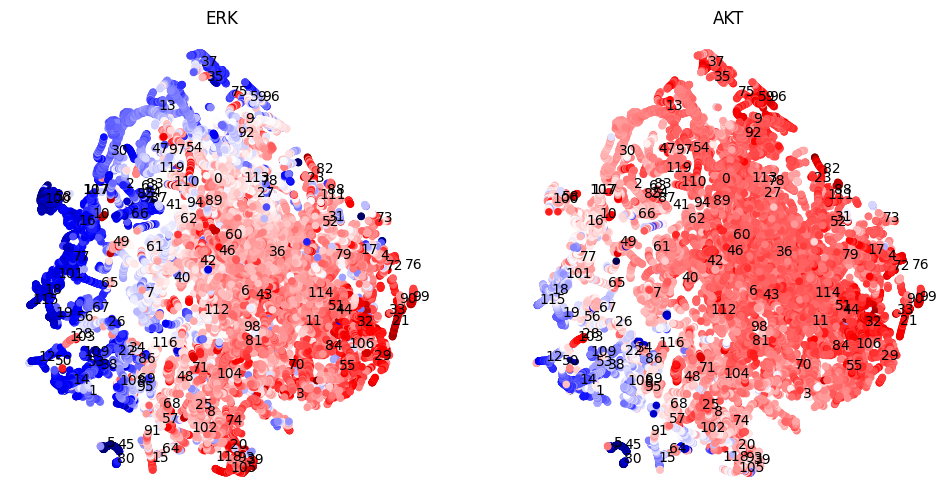

In [32]:
#plot umap of the embedding space
fig,ax=plt.subplots(1,2,figsize=(12,6))

ax[0].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_erk_traj,cmap=plt.cm.seismic)
ax[0].set_title('ERK')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    ax[0].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[0].axis('off')

ax[1].scatter(x_umap[:,0],x_umap[:,1],s=20,c=corrc_akt_traj,cmap=plt.cm.seismic)
ax[1].set_title('AKT')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    ax[1].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax[1].axis('off')

plt.savefig(f'{date}/dMAP_{figid}.png')

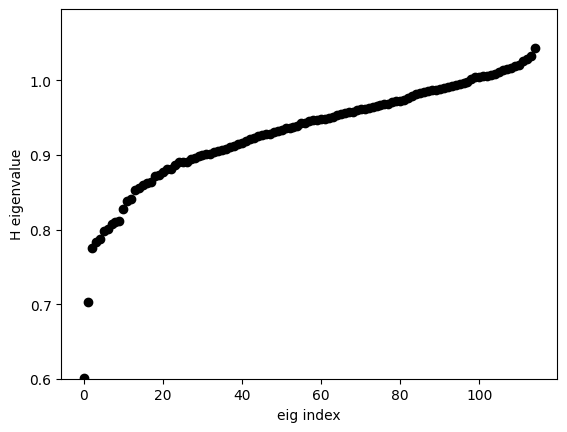

In [33]:
#Markov state model
centers_minima=clusters.clustercenters.copy()
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
graph = csr_matrix(P>0.)
n_components, labels = connected_components(csgraph=graph, directed=False, return_labels=True)
unique, counts = np.unique(labels, return_counts=True)
icc=unique[np.argmax(counts)]
indcc=np.where(labels==icc)[0]
centers_minima=centers_minima[indcc,:];stateCenters=centers_minima
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
n_clusters=indcc.size

H=.5*(P+np.transpose(P))+.5j*(P-np.transpose(P))
w,v=np.linalg.eig(H)
w=np.real(w)
indsort=np.argsort(w)
w=w[indsort]
v=v[:,indsort]

plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
plt.ylim(.6,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.pause(.1)

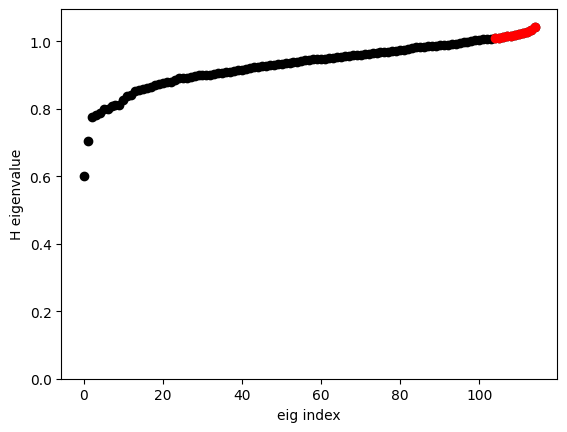

In [34]:
ncomp=11 #number of eigencomponents to keep
vr=np.multiply(w[-ncomp:],np.real(v[:,-ncomp:]))
vi=np.multiply(w[-ncomp:],np.imag(v[:,-ncomp:]))
vkin=np.append(vr,vi,axis=1)
va=np.abs(v[:,-ncomp:])
vkin=np.append(vr,vi,axis=1)
vth=np.arctan2(vr,vi)
plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
#plt.plot(dense_range,wdense,'k-',label='spline')
plt.plot(np.arange(n_clusters)[-ncomp:],w[-ncomp:],'ro')
plt.ylim(0,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.savefig(f'{date}/eigenvalues_{figid}.png')
plt.pause(.1)

In [43]:
get_cluster_embedding=False
if get_cluster_embedding:
    reducer=umap.UMAP(n_components=2) #n_neighbors=int(n_clusters),min_dist=0.1, n_components=2, metric='euclidean')
    #reducer=sklearn.manifold.TSNE(n_components=2)
    trans = reducer.fit(vkin)
    x_clusters=trans.embedding_
    np.save(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy',x_clusters)
else:
    x_clusters=np.load(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy')

ind_clusters=clusters_minima.assign(x)
x_clusters_all=x_clusters[ind_clusters,:]

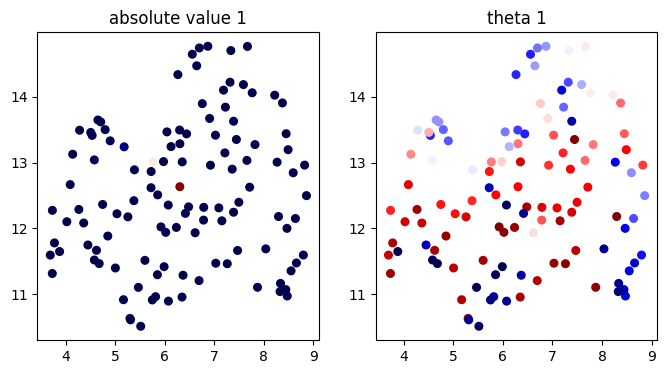

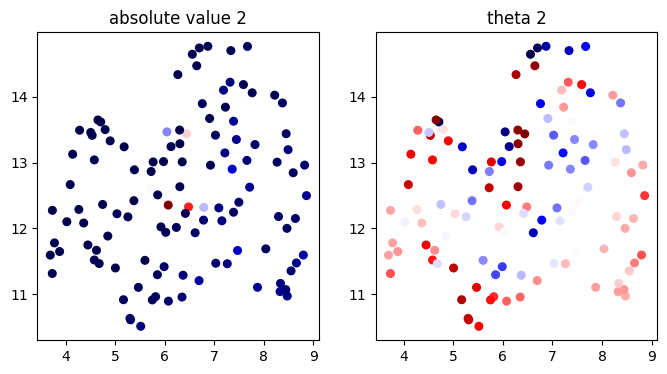

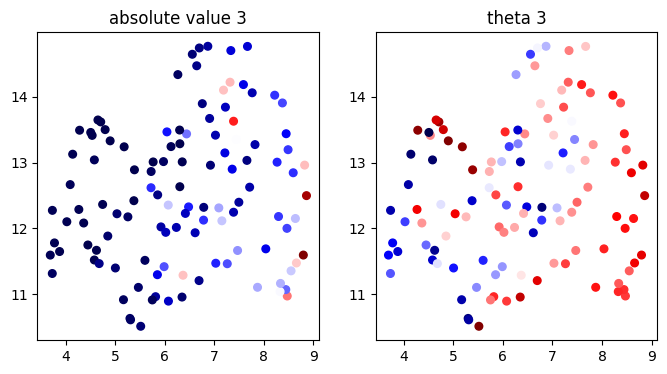

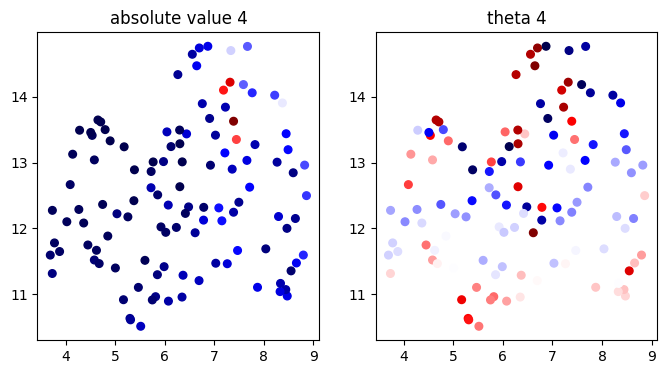

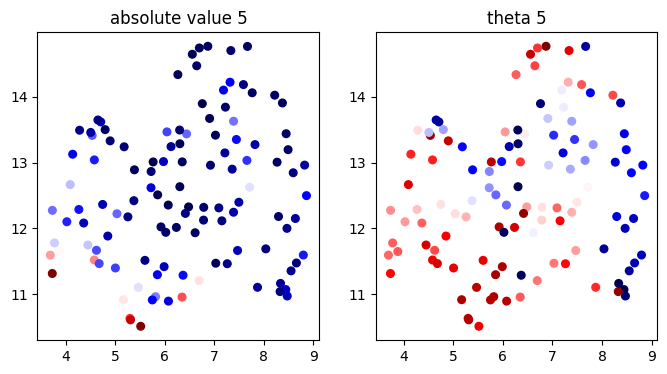

...

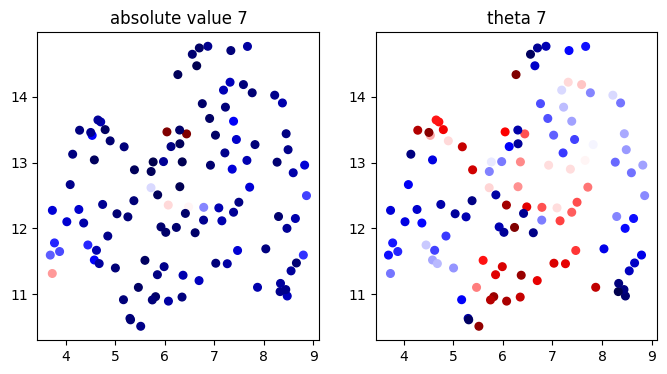

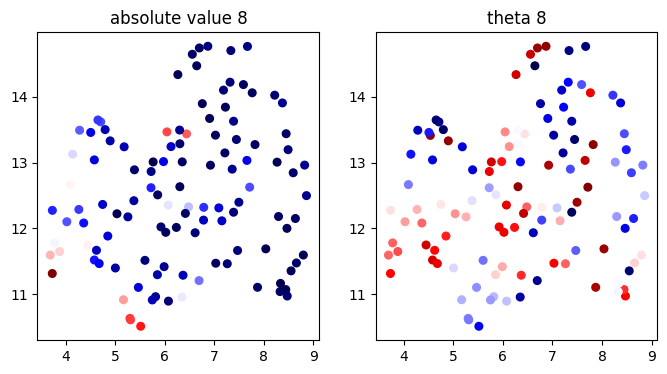

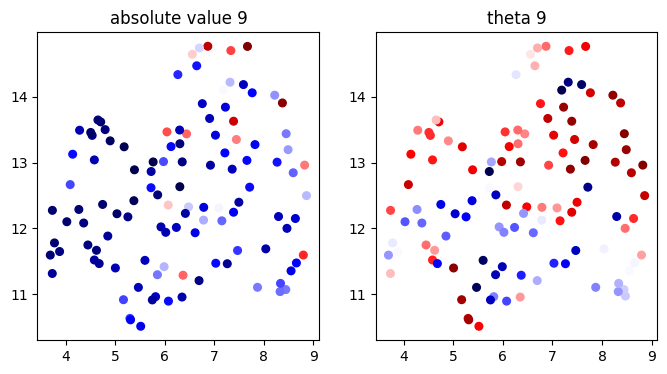

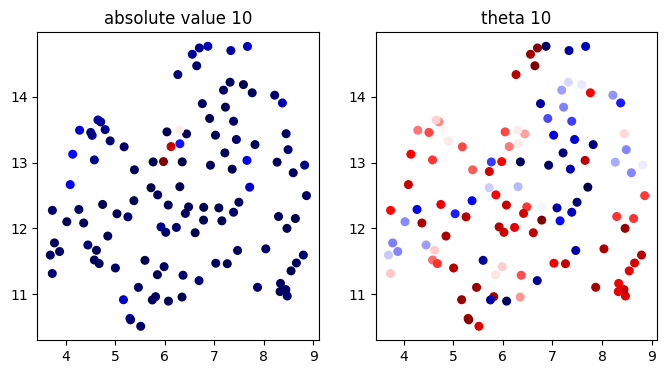

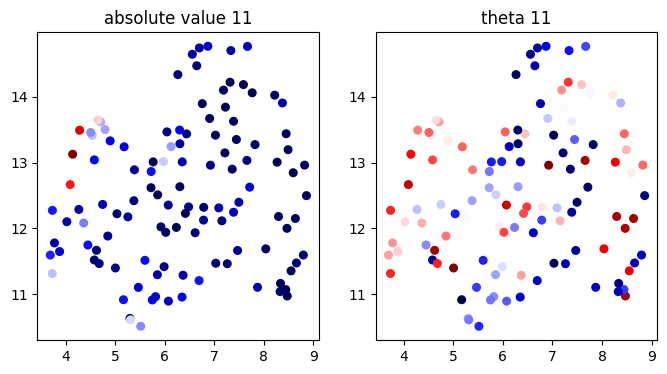

In [44]:
plt.close('all')
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=va[:,icomp],cmap=plt.cm.seismic)
    plt.title('absolute value '+str(ncomp-icomp))
    plt.subplot(1,2,2);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.title('theta '+str(ncomp-icomp))
    plt.savefig(date+'/componentrth_'+str(ncomp-icomp)+'_H_nc'+str(n_clusters)+'_ncomp'+str(ncomp)+'_'+figid+'.png')

In [45]:
dx_clusters=np.zeros((nf,n_clusters,2))
MtSet=[None]*nf
for i in range(nf):
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix(x0,x1,clusters_minima)
    MtSet[i]=Mt.copy()
    dxmatrix=np.zeros((n_clusters,n_clusters,2))
    for ii in range(n_clusters):
        for jj in range(n_clusters):
            dxmatrix[ii,jj]=(x_clusters[jj,:]-x_clusters[ii,:])*Mt[ii,jj]
    dx_clusters[i,:,:]=np.sum(dxmatrix,axis=1)

dx_clusters_smooth=np.zeros_like(dx_clusters)
knn=20
for i in range(nf):
    for iclust in range(n_clusters):
        xc=np.array([clusters_minima.clustercenters[iclust,:]])
        dmatr=utilities.get_dmat(clusters_minima.clustercenters,xc) #get closest cells to cluster center
        indr=np.argsort(dmatr[:,0])
        indr=indr[0:knn]
        dx_clusters_smooth[i,iclust,:]=np.mean(dx_clusters[i,indr,:],axis=0)

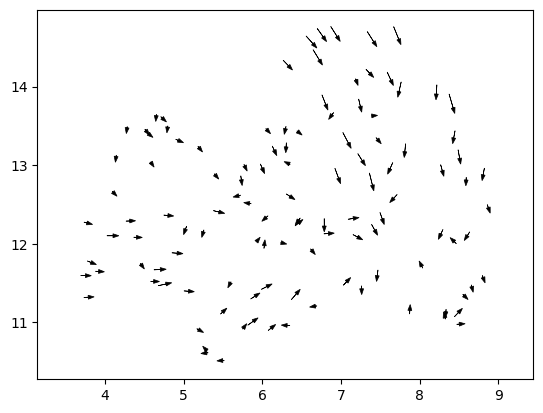

In [46]:
dxsav=np.mean(dx_clusters_smooth,axis=0)
ascale=6.0
ax=plt.gca()
for ic in range(n_clusters):
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.5,color='black',alpha=1.0)

plt.axis('equal')
plt.savefig(date+'/dx_clusters_'+figid+'.png')
plt.savefig(date+'/dx_clusters_'+figid+'.pdf')
plt.pause(.1)

/home/copperma/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/lib/histograms.py:1067: RuntimeWarning: invalid value encountered in divide
  hist /= s


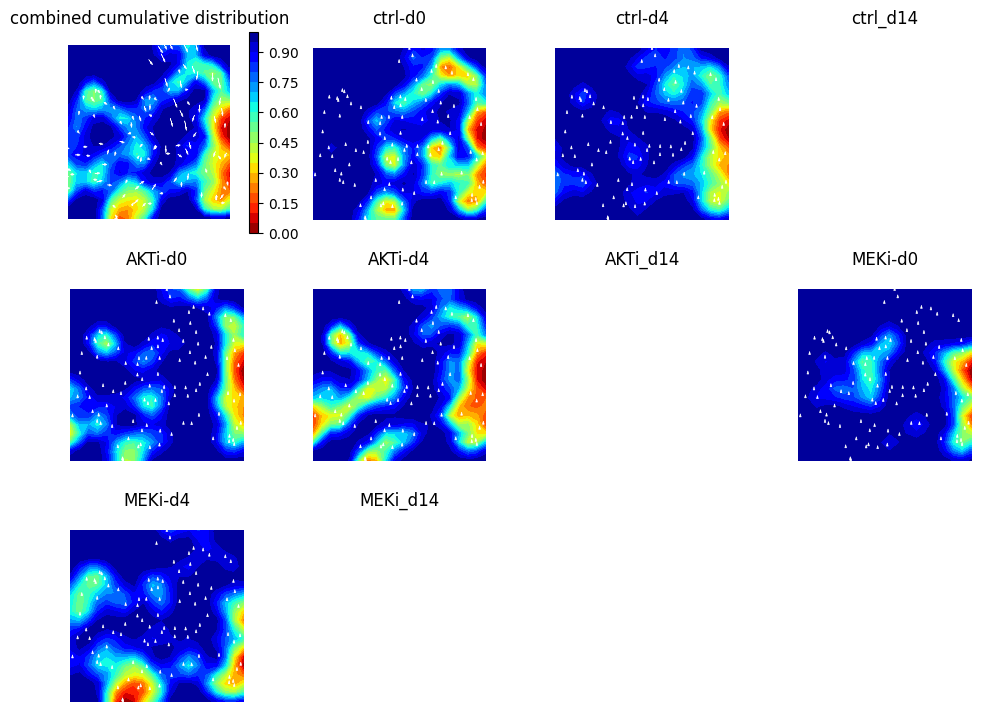

In [47]:
plt.close('all')
nbins=20
fl=0
fu=192 #frames for time window
sml=1
nplots=int(np.ceil(np.sqrt(nf+1)))
plt.figure(figsize=(12,12))
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
probSet=[None]*nf
plt.subplot(nplots,nplots,1)
prob1,xedges1,yedges1=np.histogram2d(x_clusters_all[indstw,0],x_clusters_all[indstw,1],bins=nbins,density=True)
prob1=scipy.ndimage.gaussian_filter(prob1,sigma=sml)
prob1c=utilities.get_cdist2d(prob1)
xx,yy=np.meshgrid(.5*xedges1[1:]+.5*xedges1[0:-1],.5*yedges1[1:]+.5*yedges1[0:-1])
levels=np.linspace(0,1,21)
cs=plt.contourf(xx,yy,prob1c.T,levels=levels,cmap=plt.cm.jet_r)
cbar=utilities.colorbar(cs)
#cbar.set_label('cumulative probability')
plt.title('combined cumulative distribution')
plt.axis('off')
for ic in range(n_clusters):
    ax=plt.gca()
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    
for imf in range(nf):
    tm=tmSet[imf]
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    prob,xedges2,yedges2=np.histogram2d(x_clusters_all[indstwm,0],x_clusters_all[indstwm,1],bins=[xedges1,yedges1],density=True)
    #prob=prob/np.sum(prob)
    prob=scipy.ndimage.gaussian_filter(prob,sigma=sml)
    probc=utilities.get_cdist2d(prob)
    probSet[imf]=prob.copy()
    plt.subplot(nplots,nplots,imf+2)
    #levels=np.linspace(0,np.max(prob),100)
    cs=plt.contourf(xx,yy,probc.T,levels=levels,cmap=plt.cm.jet_r,extend='both')
    dxf=dx_clusters_smooth[i,:,:]
    ax=plt.gca()
    for ic in range(n_clusters):
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxf[ic,0],ascale*dxf[ic,1],head_width=.05,linewidth=.4,color='white',alpha=1.0)
    plt.title(tmSet[imf])
    cs.cmap.set_over('darkred')
    plt.axis('off')

plt.savefig(date+'/probflows_'+figid+'.png')

In [429]:
erk_akt_crosscorr

array([0.52123717, 0.56220928, 0.60215091, ..., 0.90522192, 0.8962386 ,
       0.87809736])

In [40]:
ntraj=x.shape[0]
erk_akt_crosscorr=np.zeros(ntraj)
for i in range(ntraj):
    erk_akt_crosscorr[i]=np.corrcoef(corrc_erk_full_traj[i,:],corrc_akt_full_traj[i,:])[0,1]

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


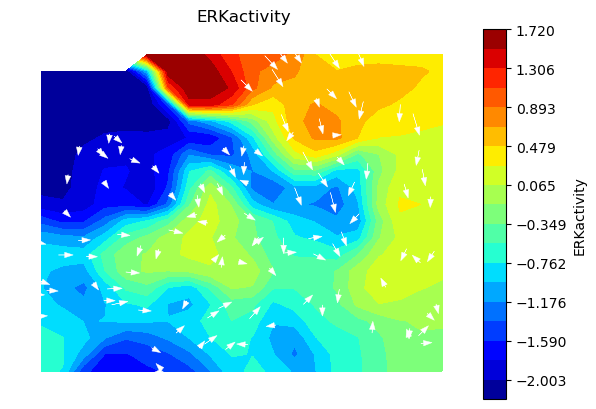

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


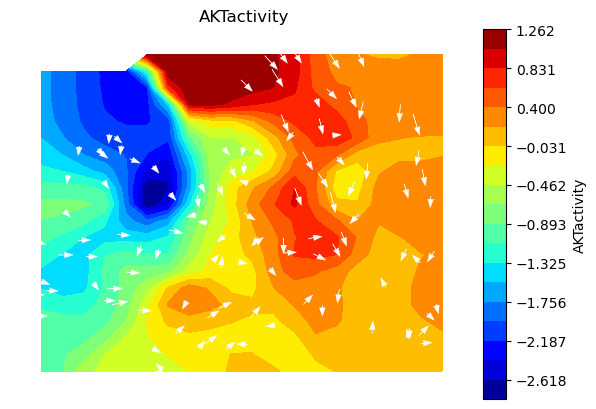

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


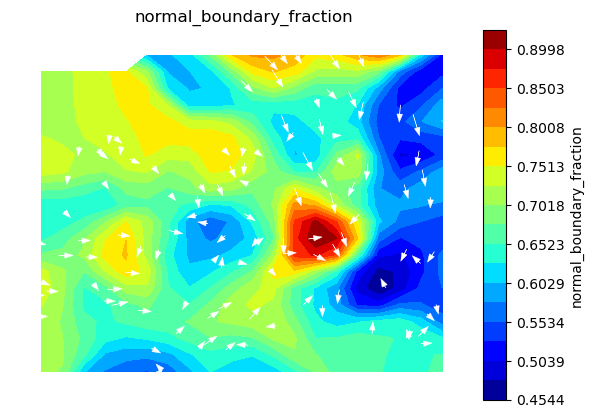

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


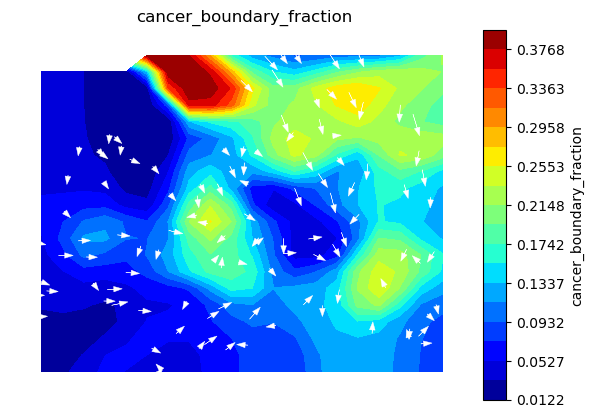

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


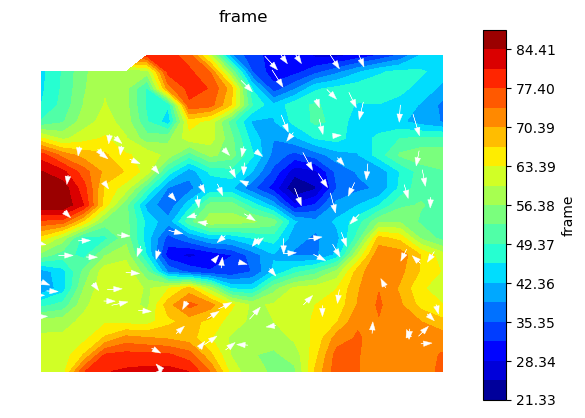

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


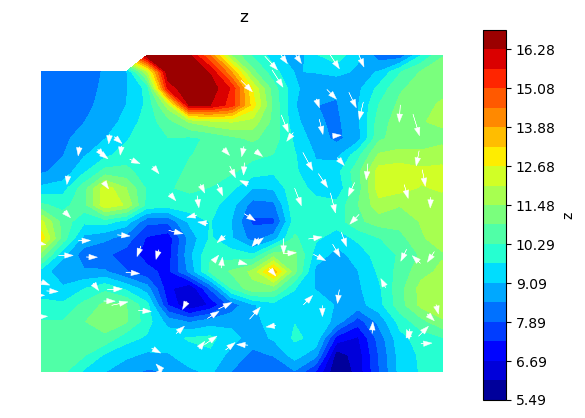

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


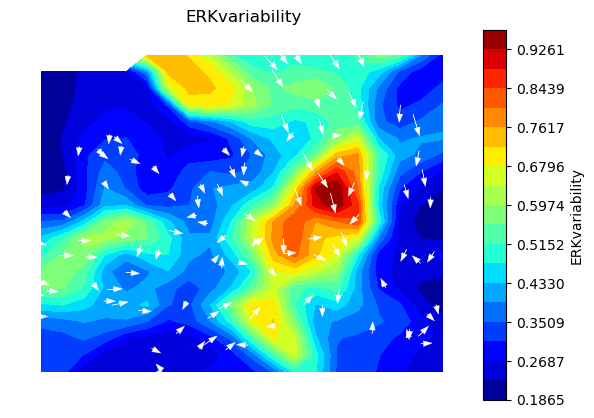

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


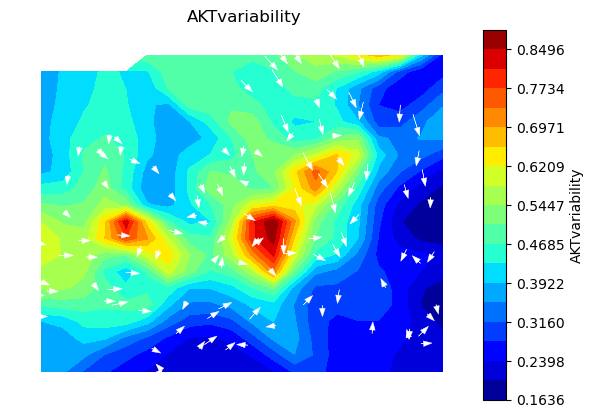

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


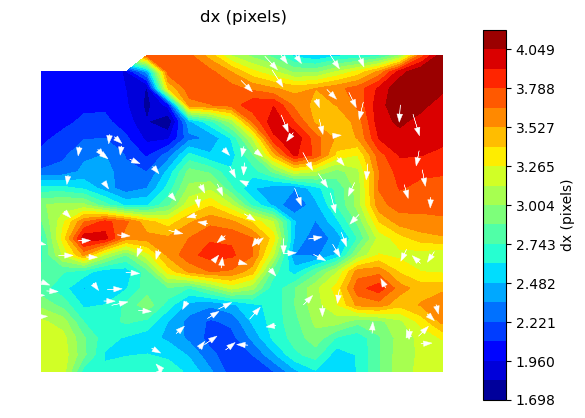

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


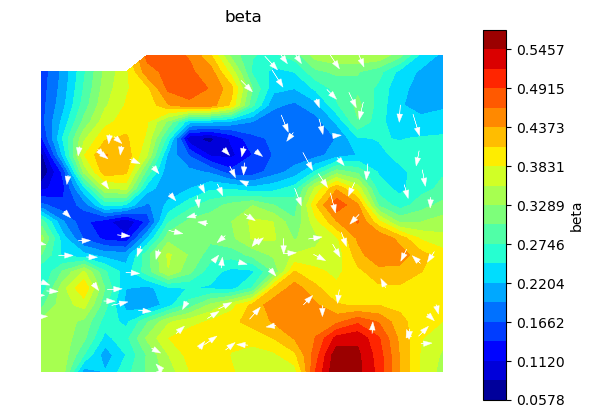

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


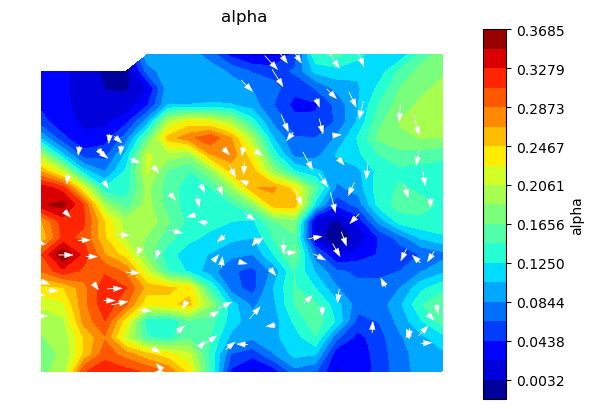

/tmp/ipykernel_2109301/352683553.py:21: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


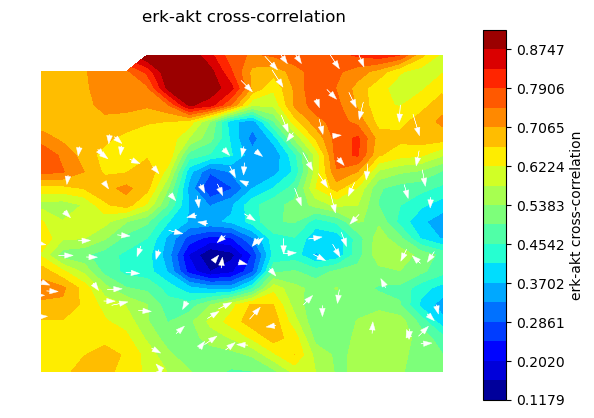

In [455]:
corrc_erk_var_traj=np.std(corrc_erk_full_traj,axis=1)
corrc_akt_var_traj=np.std(corrc_akt_full_traj,axis=1)
#vsetList=[corrc_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_var_traj,dx_traj]
#captionset=['ERKactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','dx (pixels)']
vsetList=[corrc_erk_traj,corrc_akt_traj,cb_ratio_traj-cbc_ratio_traj,cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_akt_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','normal_boundary_fraction','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx (pixels)','beta','alpha','erk-akt cross-correlation']
#vset=cb_ratio_traj
#vset=cc_ratio_traj
#vset=Xpcat[:,-3]
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
    plt.figure()
    #plt.subplot(4,4,1)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx,yy=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
    for ic in range(n_clusters):
        ax=plt.gca()
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.07,linewidth=.3,color='white',alpha=1.0)
    cs.cmap.set_over('darkred')
    cs.cmap.set_under('darkblue')
    cbar=utilities.colorbar(cs)
    cbar.set_label(captionset[iv])
    #cbar.set_label('cell-cell boundary fraction')
    #cbar.set_label('speed')
    #cbar.set_label('beta')
    plt.title(captionset[iv])
    plt.axis('off')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_wflows_comb_'+figid+'.pdf')
    plt.pause(.4)

[0.0173913 0.9826087]
2 states initial, 1 states final
[0.0173913  0.0173913  0.96521739]
3 states initial, 1 states final
[0.00869565 0.0173913  0.0173913  0.95652174]
4 states initial, 1 states final
[0.0173913  0.0173913  0.0173913  0.11304348 0.83478261]
5 states initial, 2 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
2 states
[51.77975673 36.59412985         nan 58.90219733 54.65284785         nan
         nan 35.79959793         nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


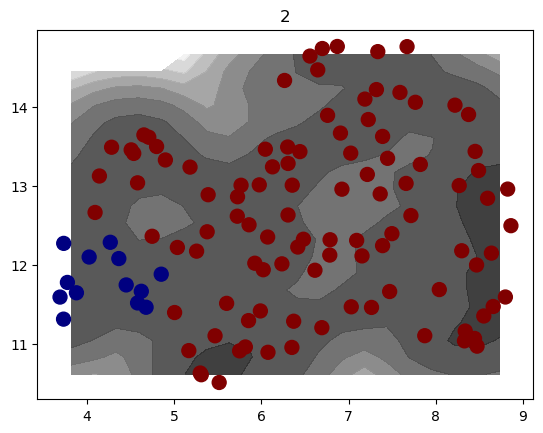

[0.00869565 0.0173913  0.0173913  0.02608696 0.05217391 0.87826087]
6 states initial, 2 states final
[0.00869565 0.0173913  0.0173913  0.0173913  0.02608696 0.05217391
 0.86086957]
7 states initial, 2 states final
[0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.05217391
 0.09565217 0.75652174]
8 states initial, 3 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
3 states
[  0.          40.47849699          nan 148.13787466  87.44488421
          nan          nan 100.50300291          nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


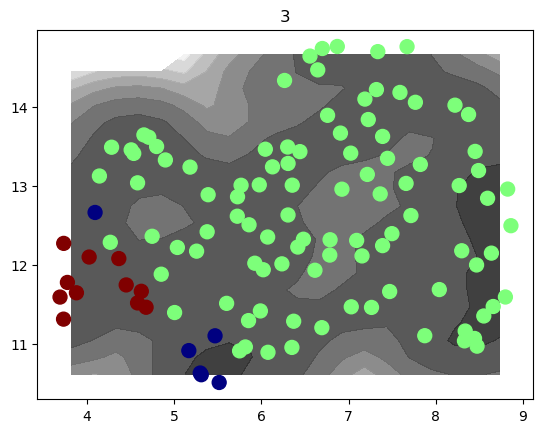

[0.00869565 0.0173913  0.0173913  0.0173913  0.02608696 0.06086957
 0.10434783 0.16521739 0.5826087 ]
9 states initial, 4 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
4 states
[ 41.64474011  65.74972736          nan 205.45625947 145.51043801
          nan          nan 206.62191005          nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


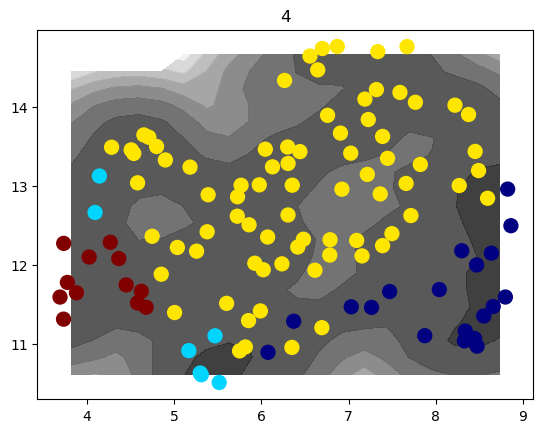

[0.00869565 0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.05217391 0.11304348 0.13043478 0.59130435]
10 states initial, 4 states final
[0.00869565 0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.05217391 0.09565217 0.13043478 0.26086957 0.34782609]
11 states initial, 5 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
5 states
[109.02768229 120.50173564          nan 218.62984554 210.34268808
          nan          nan 252.12109563          nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


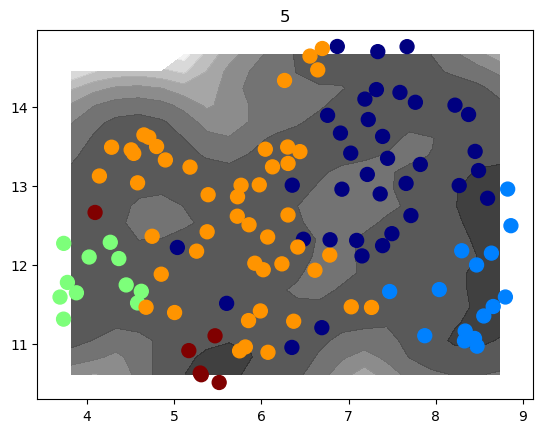

[0.00869565 0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.05217391 0.05217391 0.07826087 0.11304348 0.12173913 0.46956522]
12 states initial, 6 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
6 states
[ 71.58136499 169.79440751          nan 293.67215536 260.51558148
          nan          nan 291.66817742          nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


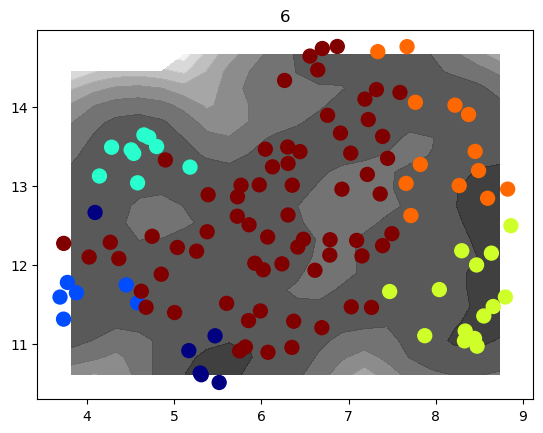

[0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.03478261 0.04347826 0.06956522 0.07826087 0.12173913 0.14782609
 0.3826087 ]
13 states initial, 7 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
7 states
[166.98501378 154.61741837          nan 217.29716643 272.60405249
          nan          nan 377.19460239          nan]


/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


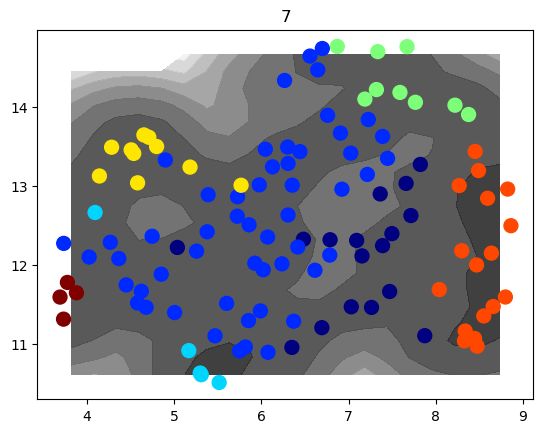

[0.00869565 0.00869565 0.0173913  0.0173913  0.0173913  0.0173913
 0.02608696 0.02608696 0.03478261 0.03478261 0.03478261 0.08695652
 0.11304348 0.55652174]
14 states initial, 6 states final
[0.00869565 0.00869565 0.0173913  0.0173913  0.0173913  0.0173913
 0.0173913  0.0173913  0.02608696 0.04347826 0.07826087 0.07826087
 0.07826087 0.12173913 0.45217391]
15 states initial, 6 states final
[0.00869565 0.00869565 0.0173913  0.0173913  0.0173913  0.0173913
 0.0173913  0.0173913  0.03478261 0.03478261 0.05217391 0.06956522
 0.08695652 0.09565217 0.11304348 0.39130435]
16 states initial, 8 states final
building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14
8 states
[152.67047603 115.92933321          nan 

/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


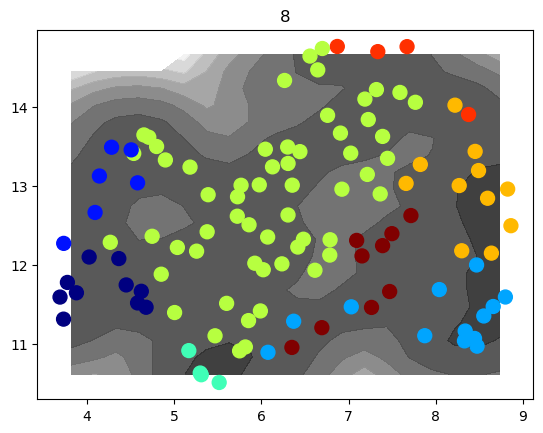

[0.00869565 0.00869565 0.00869565 0.00869565 0.0173913  0.0173913
 0.0173913  0.0173913  0.0173913  0.02608696 0.04347826 0.04347826
 0.05217391 0.05217391 0.10434783 0.14782609 0.40869565]
17 states initial, 7 states final
[0.00869565 0.00869565 0.00869565 0.0173913  0.0173913  0.0173913
 0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.04347826
 0.05217391 0.05217391 0.08695652 0.09565217 0.10434783 0.39130435]
18 states initial, 7 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.0173913
 0.0173913  0.0173913  0.0173913  0.0173913  0.0173913  0.0173913
 0.03478261 0.05217391 0.06086957 0.09565217 0.09565217 0.10434783
 0.39130435]
19 states initial, 7 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.0173913
 0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.02608696 0.03478261 0.03478261 0.03478261 0.07826087 0.10434783
 0.19130435 0.31304348]
20 states initial, 7 states final
[0.00869565 0.00869565 0.00869565 0.0

/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


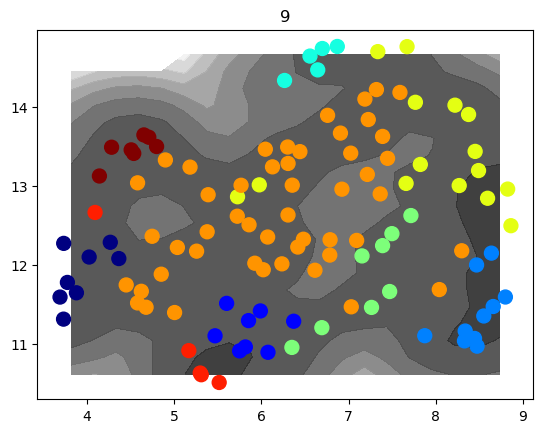

[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.0173913  0.0173913  0.0173913
 0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.02608696 0.03478261 0.04347826 0.06956522 0.07826087 0.08695652
 0.11304348 0.29565217]
26 states initial, 7 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.0173913  0.0173913  0.0173913  0.0173913  0.0173913  0.02608696
 0.02608696 0.02608696 0.02608696 0.05217391 0.06086957 0.06086957
 0.09565217 0.13043478 0.30434783]
27 states initial, 6 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.0173913  0.0173913  0.0173913  0.0173913  0.0173913  0.0173913
 0.02608696 0.02608696 0.02608696 0.03478261 0.06086957 0.06086957
 0.07826087 0.13043478 0.16521739 0.1826087 ]
28 states initial, 7 stat

/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


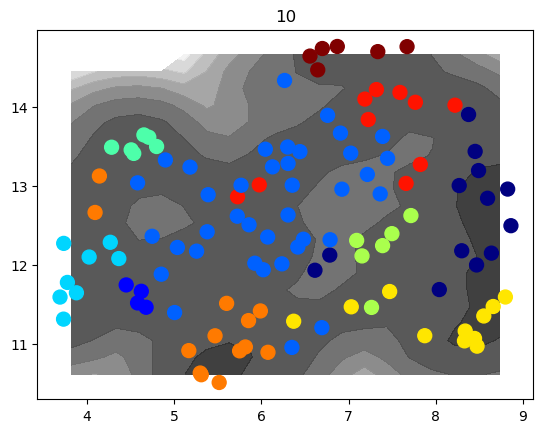

[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.0173913  0.0173913  0.0173913  0.0173913  0.02608696 0.02608696
 0.02608696 0.04347826 0.04347826 0.05217391 0.06086957 0.06956522
 0.06956522 0.09565217 0.20869565]
39 states initial, 8 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.0173913
 0.0173913  0.0173913  0.02608696 0.02608696 0.02608696 0.02608696
 0.02608696 0.03478261 0.04347826 0.04347826 0.06086957 0.06086957
 0.06956522 0.07826087 0.08695652 0.13913043]
40 states initial, 9 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.0

/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


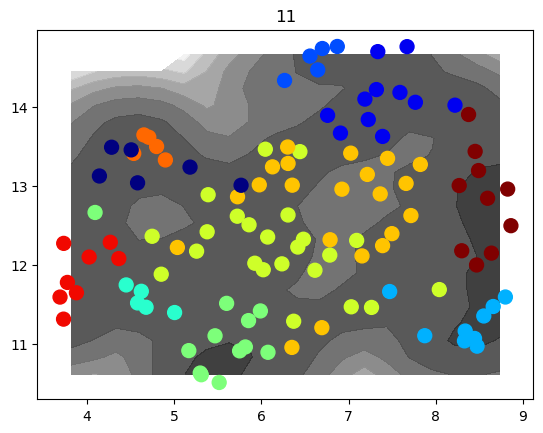

[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.0173913  0.0173913  0.0173913  0.0173913
 0.02608696 0.02608696 0.02608696 0.03478261 0.04347826 0.04347826
 0.04347826 0.05217391 0.05217391 0.07826087 0.08695652 0.19130435]
42 states initial, 9 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.0173913  0.0173913  0.02608696 0.02608696 0.02608696
 0.02608696 0.02608696 0.03478261 0.03478261 0.04347826 0.04347826
 0.04347826 0.04347826 0.04347826 0.05217391 0.06086957 0.07826087
 0.13913043]
43 states initi

/tmp/ipykernel_2109301/2906006139.py:33: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


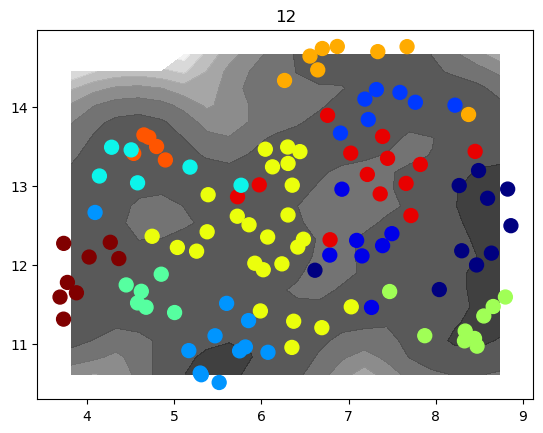

[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.0173913
 0.0173913  0.0173913  0.02608696 0.02608696 0.02608696 0.02608696
 0.02608696 0.02608696 0.03478261 0.03478261 0.04347826 0.06086957
 0.06086957 0.06956522 0.07826087 0.15652174]
46 states initial, 8 states final
[0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565 0.00869565
 0.00869565 0.00869565 0.00869565 0.0173913  0.0173913  0.0173913
 0.0173913  0.0173913  0.0173913  0.02608696 0.02608696 0.02608696
 0.02608696 0.02608696 0.03478261 0.04347826 0.0521

KeyboardInterrupt: 

In [456]:
plt.close('all')
plt.clf()
nstateSet=[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,18,20,22,24,28,30] #,30,40]
nS=len(nstateSet)
scoreSet_states=[None]*nS
nstates_initial=nstateSet[0]
pcut_final=.03
indc_x0set=clusters_minima.assign(x0set);indc_x1set=clusters_minima.assign(x1set)
for istate in range(len(nstateSet)):
    MtSet_test=[None]*nf
    nstates=nstateSet[istate]
    scoreSet=np.zeros(nf)
    #clusters_v = KMeans(n_clusters=nstates,init='k-means++',n_init=1000,max_iter=1000)
    #clusters_v.fit(vkin)
    #states=clusters_v.labels_
    states,nstates_initial=model.get_kineticstates(vkin,nstates,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=True,cluster_ninit=100)
    for imf in range(nf):
        print('building likelihood model for '+tmSet[imf])
        indmodels=np.where(inds_tmSet_models==imf)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        indstm=np.array([]).astype(int)
        for i in indmodels: #[:-1]:
            indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
        MtSet_test[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=states)
        scoreSet[imf]=model.get_kscore(MtSet_test[imf])
        #scoreSet[imf]=model.get_path_entropy_2point(states[indc_x0set],states[indc_x1set],MtSet_test[imf])
    print(str(nstates)+' states')
    print(scoreSet)
    nstates_initial=nstates_initial+1
    #np.savetxt(f'{date}_scoreSet_{figid}_nS{nstates}.dat',scoreSet)
    scoreSet_states[istate]=scoreSet
    plt.clf()
    plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)
    plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=states,cmap=plt.cm.jet)
    plt.title(str(nstates))
    plt.pause(2)
    #plt.savefig(f'{date}/clustertest_{figid}_{nstates}.png')

/tmp/ipykernel_2109301/298439866.py:15: RuntimeWarning: Mean of empty slice
  plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)


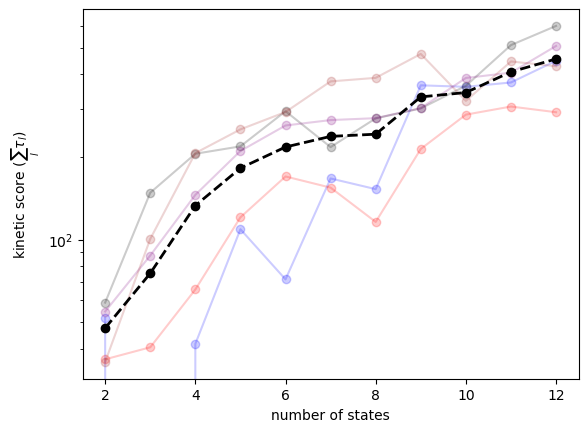

<Figure size 640x480 with 0 Axes>

In [457]:
scoreSet_statearray=np.zeros((nS,nf))
for istate in range(len(nstateSet)):
    try:
        scoreSet_statearray[istate,:]=scoreSet_states[istate]
    except:
        pass

plt.close('all')
#colorSet=['red','gold','green','blue','black','red','gold','green','blue','black','brown','orange','purple']
colorSet=['blue','red','gold','black','purple','green','orange','brown','cyan','lightgreen','magenta','darkblue','darkred','darkgray','darkgreen']
plt.clf()
for imf in range(nf):
    plt.plot(nstateSet,scoreSet_statearray[:,imf],'o-',color=colorSet[imf],label=tmSet[imf],alpha=.2)

plt.plot(nstateSet,np.nanmean(scoreSet_statearray,axis=1),'o--',color='black',linewidth=2)
plt.yscale('log')
#plt.ylabel(r'path entropy $-\langle log(p_{ij})\rangle$')
plt.ylabel(r'kinetic score ($\sum_l \tau_l$)')
plt.xlabel('number of states');plt.pause(.1)
plt.savefig(f'{date}/scoreset_{figid}.png')

In [ ]:
scoreSet

In [74]:
get_kstates=False
nstates_final=13
#nstates_final=13 #for production
pcut_final=.03 #for prediction
#pcut_final=.02 #for production
nstates_initial=nstates_final
stateCenters=x_clusters
if get_kstates:
    stateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=100)
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'wb')
    states_object=[clusters_minima,stateSet]
    pickle.dump(states_object,objFileHandler,protocol=4)
    objFileHandler.close()
    #stateSet=get_kineticstates(wctm,nstates_final,P=MtSet[4],clusters_minima=clusters_minima,pcut_final=.01,ncomp=ncomp) #treatment specific
else:
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'rb')
    states_object=pickle.load(objFileHandler)
    clusters_minima=states_object[0]
    stateSet=states_object[1]
    objFileHandler.close()

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)



In [77]:
#state_order=np.argsort(state_centers_minima[:,0])
#state_order=np.array([9,16,15,13,10,4,6,7,3,14,12,11,1,0,2,5,8]).astype(int)
#state_order=np.array([0,1,2,7,18,17,15,4,11,8,3,14,16,12,13,5,6,9,10])
#state_order=np.array([0,2,1,7,18,17,15,8,11,4,3,16,14,5,12,13,6,9,10])
#state_order=np.array([8,6,4,0,1,3,2,5,7,9,10,11,12]) #traj25 12jun24
#state_order=np.array([9,2,11,7,5,8,4,1,3,10,6,0]) #traj49 and started from above
state_order=np.array([9,4,11,5,3,7,1,6,0,10,2,8]) #traj49 and started from above
#state_order=np.arange(nstates).astype(int)
stateSet_ordered=np.ones_like(stateSet)*-1
for istate in range(nstates):
    stateSet_ordered[stateSet==state_order[istate]]=istate

stateSet=stateSet_ordered

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,2))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)

inds_states=[None]*n_states
for i in range(n_states):
    indstate=np.where(stateSet[ind_clusters]==i)[0]
    inds_states[i]=indstate

In [475]:
trajl

49

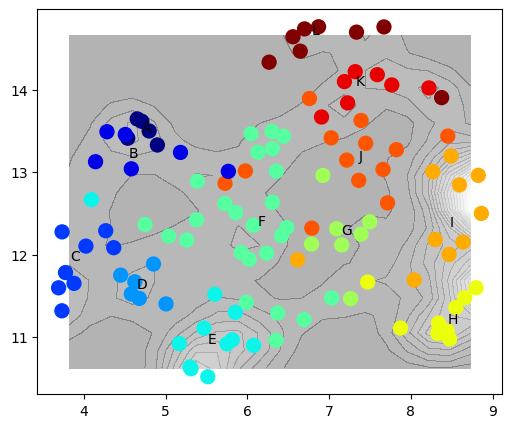

In [78]:
import string
nbins=prob1.shape[0]
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
plt.close('all');plt.figure(figsize=(6,5))
plt.clf()
pts=np.array([xx.flatten(),yy.flatten()]).T
#indpts=clusters_minima.assign(pts)
#states=stateSet[indpts]
#states=states[prob1.flatten()>np.min(prob1[prob1>0])]
#pts=pts[prob1.flatten()>np.min(prob1[prob1>0]),:]
plt.contourf(xx,yy,prob1.T,cmap=plt.cm.gray,levels=20,alpha=.3)
#plt.scatter(tateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=500)ts[:,0],pts[:,1],s=10,c=states,cmap=plt.cm.jet,marker='.',alpha=0.5)
plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=stateSet,cmap=plt.cm.jet)
#for ic in range(n_clusters):
#    ax=plt.gca()
#    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],dxsav[ic,0],dxsav[ic,1],head_width=.1,linewidth=.2,color='white',alpha=1.0)

for istate in range(nstates):
    plt.text(state_centers_minima[istate,0],state_centers_minima[istate,1],str(state_labels[istate]))


plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.png')
plt.savefig(date+'/kineticstates_'+figid+'_nS_'+str(nstates)+'.pdf')
plt.pause(.1)

In [85]:
def show_cell_activation(self,icell,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=False,show_neighbor_signals=False):
    #plt.figure(figsize=(6,6))
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0,1],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            #img_rep=imprep.znorm(np.max(imgc[...,rep_img_channel],axis=0))
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            #img_nuc=imprep.znorm(np.max(imgc[...,nuc_img_channel],axis=0))
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            #img_bf=imprep.znorm(np.max(img_bf,axis=0))
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            #msk_cyto=np.max(mskc[...,cyto_msk_channel],axis=0)
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,5);nuchigh=np.percentile(img_nuc,95)
        #img_nuc[msk_nuc==0]=-1000.
        #img_rep[msk_cyto==0]=-1000.1
        img_bf=np.abs(img_bf)
        #img_bf[np.logical_not(msk_f)]=0
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        #img_bf=scipy.ndimage.gaussian_filter(img_bf,sigma)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        plt.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        #csr=plt.contour(img_rep,levels=np.linspace(rep_min,rep_max,201),cmap=plt.cm.binary,extend='both')
        #csr.cmap.set_over('black')
        #csr.cmap.set_under('white')
        if show_neighbor_signals:
            plt.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        else:
            plt.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        #####plt.imshow(img_rep,cmap=plt.cm.YlOrBr,clim=(replow,3*rephigh),alpha=.3)
        #plt.contour(img_rep,levels=np.linspace(0,10,11),cmap=plt.cm.inferno,alpha=.3)
        csn=plt.contour(img_nuc,levels=np.linspace(nuclow,nuchigh,4),cmap=plt.cm.Reds,alpha=0.6,linewidths=1)
        csn=plt.contour(msk2_cyto>0,levels=np.unique(msk_cyto>0),colors='orange',linewidths=1.2,alpha=.4)
        csn=plt.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        #cs.cmap.set_under('white')
        #plt.imshow(np.ma.masked_where(msk_f==0,np.ones_like(msk_f)),cmap=plt.cm.binary_r,clim=(0,1),alpha=0.15)
        #plt.xlim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1*viewsize*zoom)
        #plt.ylim(viewsize*zoom/2-1*viewsize*zoom,viewsize*zoom/2+1.3*viewsize*zoom)
        #plt.text(zoom*npix/2,zoom*npix/4,r'central slice \textbf{YFP} \textcolor{red}{\textbf{Cy5}}')
        #plt.text(zoom*npix/2,zoom*npix/4,'central slice, YFP black, Cy5 red')
        plt.axis('off')
        return 0
    except Exception as e:
        print(e)
        return 1

In [ ]:
sctm.nuc

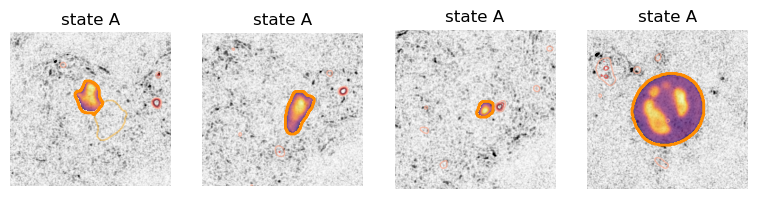

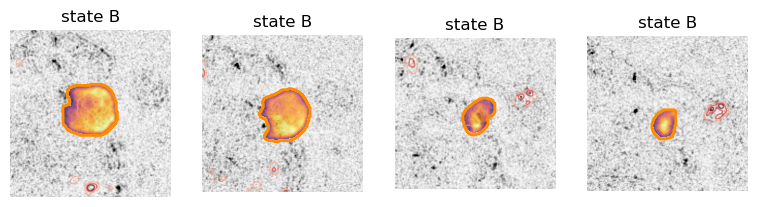

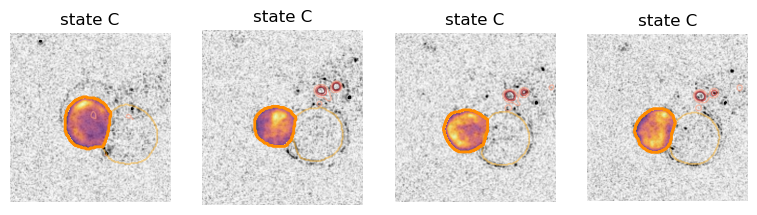

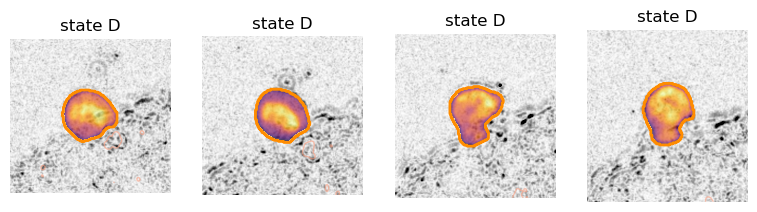

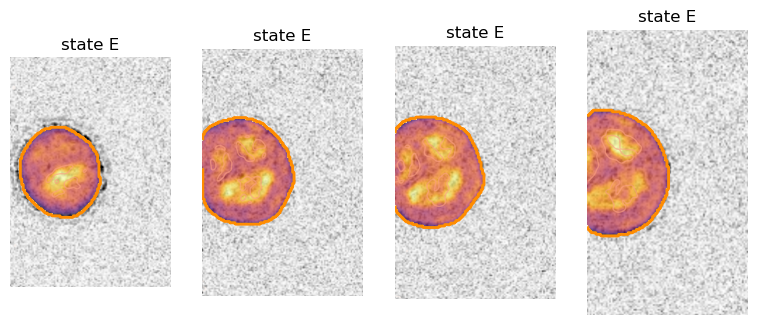

...

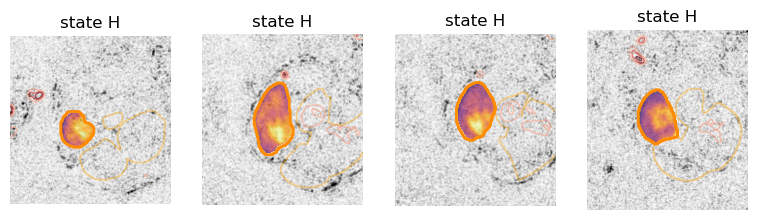

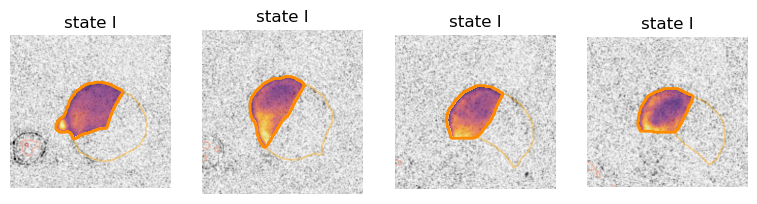

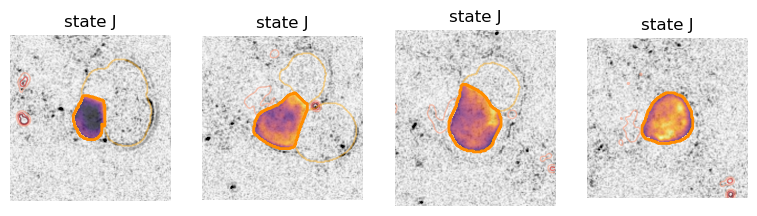

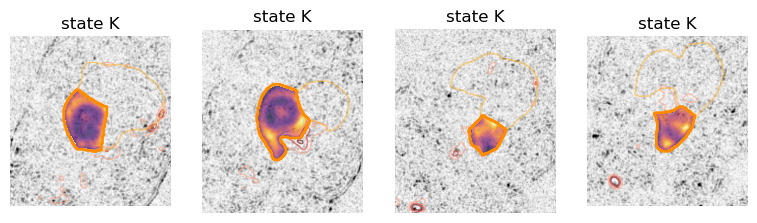

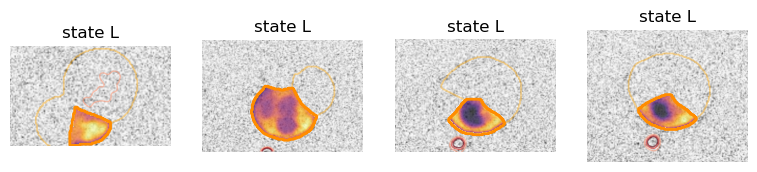

In [493]:
nrounds=4
nr=1
maxl=trajl
stordir='cellstatepics'
os.system(f'mkdir -p {date}/{stordir}')
nuclow=-1.;nuchigh=9.;replow=0.;rephigh=5.;bflow=0.;bfhigh=5.
npics=4
for iround in range(nrounds):
    plt.close('all')
    for istate in range(nstates):
        indcells_traj=inds_states[istate]
        indmodels=indtreatment_traj[indcells_traj]
        indcells_model=cellinds1_traj[indcells_traj]
        indr=np.random.choice(indcells_model.size,nr,replace=False)
        for ic in indr: #range(indcells_traj.size):
            plt.figure(figsize=(12,4))
            model_sctm=modelSet[indmodels[ic]]
            celltraj=model_sctm.get_cell_trajectory(indcells_model[ic])
            if celltraj.size>maxl:
                celltraj=celltraj[-maxl:]
            iplot=0
            for icell in np.linspace(0,celltraj.size-1,npics).astype(int):
                indcell=celltraj[icell]
                plt.subplot(1,npics+1,iplot+1)
                show_cell_activation(model_sctm,indcell,nuclow=nuclow,nuchigh=nuchigh,replow=replow,rephigh=rephigh,bflow=bflow,bfhigh=bfhigh)
                iplot=iplot+1
                plt.title(f'state {state_labels[istate]}')
            plt.savefig(f'{date}/{stordir}/state{state_labels[istate]}_cell{ic}_model{indmodels[ic]}_{figid}.png')
            plt.pause(.1)

In [82]:
MtSet=[None]*nf
MtSetCG=[None]*nf
for imf in range(nf):
    print('building likelihood model for '+tmSet[imf])
    indmodels=np.where(inds_tmSet_models==imf)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    indstm=np.array([]).astype(int)
    for i in indmodels: #[:-1]:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
    MtSet[imf]=model.get_transition_matrix(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima);
    MtSetCG[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=stateSet);

building likelihood model for ctrl-d0
building likelihood model for ctrl-d4
building likelihood model for ctrl_d14
building likelihood model for AKTi-d0
building likelihood model for AKTi-d4
building likelihood model for AKTi_d14
building likelihood model for MEKi-d0
building likelihood model for MEKi-d4
building likelihood model for MEKi_d14


In [79]:
nf=len(tmSet)
nwindow=18
time_inds=np.arange(nwindow,172,nwindow).astype(int)
state_probs_times=np.zeros((nf,n_states,time_inds.size))
ntimes=time_inds.size
for i_tm in range(nf):
    itimes=0
    for itt in time_inds:
        fl=itt-nwindow
        fu=itt+nwindow
        indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
        indstm=inds_conditions[i_tm]
        indstwm=np.intersect1d(indstm,indstw)
        x0=x[indstwm,:]
        indc0=stateSet[clusters_minima.assign(x0)]
        statesc,counts=np.unique(indc0,return_counts=True)
        state_probs_times[i_tm,statesc,itimes]=counts/np.sum(counts)
        itimes=itimes+1



iframe=24
itime=np.argmin(np.abs(time_inds-iframe))
state_probs=state_probs_times[:,:,itime]

In [146]:
counts

array([372, 322,  39, 154, 847, 183, 250, 406,  81, 193,  50,   6,  19])

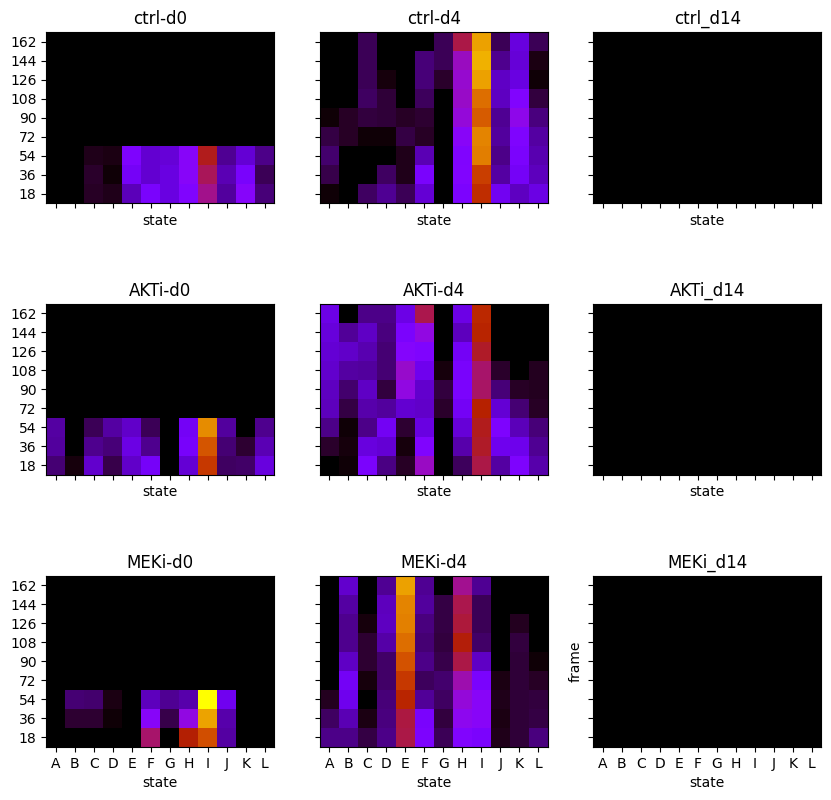

In [80]:
nplots=int(np.ceil(np.sqrt(nf)))
fig,axs=plt.subplots(nplots,nplots,sharex=True,sharey=True,figsize=(10,10))
axs=axs.flatten()
for i_tm in range(nf):
    ax=axs[i_tm]
    ax.imshow(state_probs_times[i_tm,:,:].T,origin='lower',cmap=plt.cm.gnuplot,clim=(np.min(state_probs_times),np.max(state_probs_times)))
    #ax=plt.gca()
    ax.set_yticks(np.arange(time_inds.size))
    ax.set_xticks(np.arange(nstates))
    ax.set_xticklabels(np.array(state_labels))
    ax.set_yticklabels(time_inds)
    ax.set_xlabel('state');plt.ylabel('frame')
    #cbar=plt.colorbar()
    #cbar.set_label('state probabilities')
    ax.set_title(tmSet[i_tm])

plt.savefig(date+f'/stateprobs_times_{figid}_nS{n_states}.png')

In [ ]:
nstates

[Text(0, 0, 'ctrl-d0'),
 Text(0, 1, 'ctrl-d4'),
 Text(0, 2, 'ctrl_d14'),
 Text(0, 3, 'AKTi-d0'),
 Text(0, 4, 'AKTi-d4'),
 Text(0, 5, 'AKTi_d14'),
 Text(0, 6, 'MEKi-d0'),
 Text(0, 7, 'MEKi-d4'),
 Text(0, 8, 'MEKi_d14')]

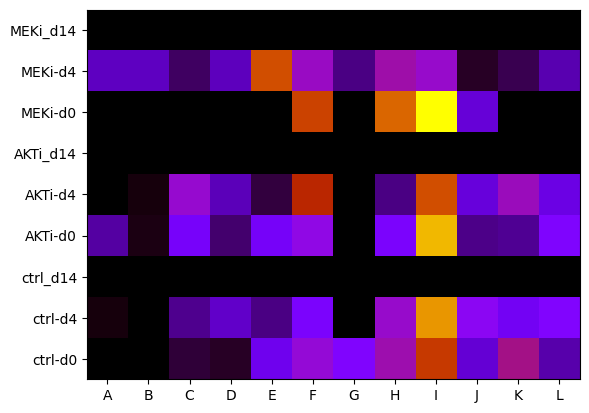

In [81]:
plt.clf()
plt.imshow(state_probs,origin='lower',cmap=plt.cm.gnuplot)
ax=plt.gca()
ax.set_yticks(np.arange(nf))
ax.set_xticks(np.arange(nstates))
ax.set_xticklabels(np.array(state_labels))
ax.set_yticklabels(tmSet)

In [94]:
corrc_akt_var_traj

array([0.15306943, 0.16124308, 0.1727005 , ..., 0.18693786, 0.17162009,
       0.17387734])

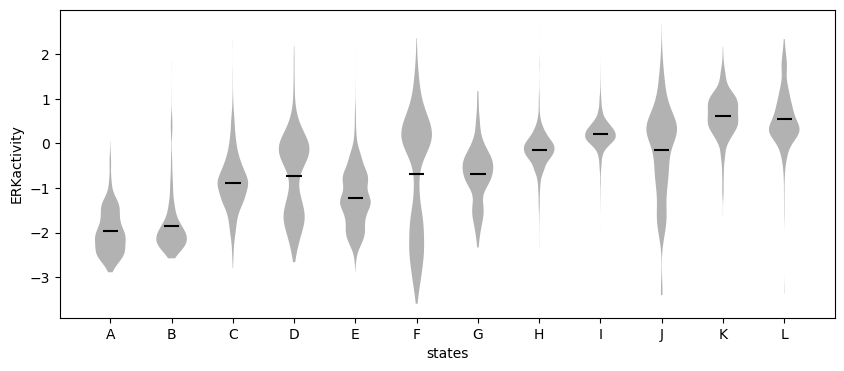

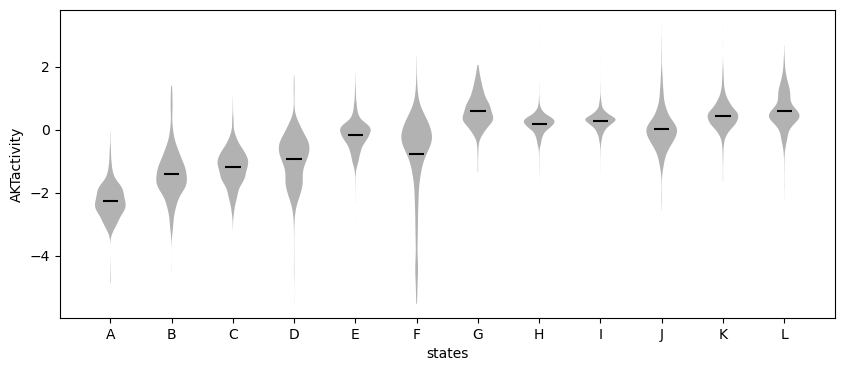

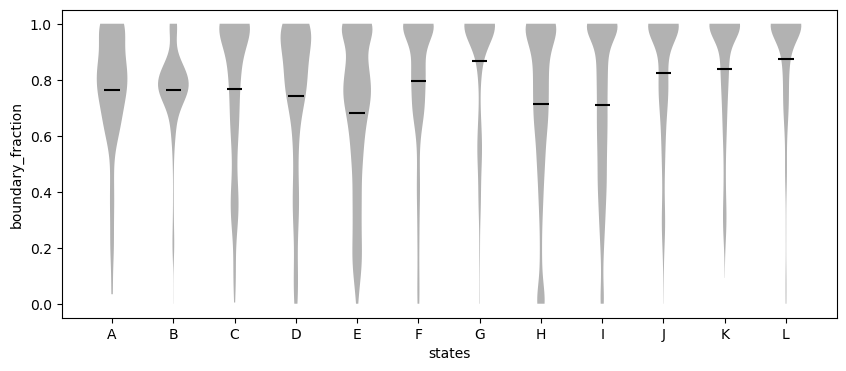

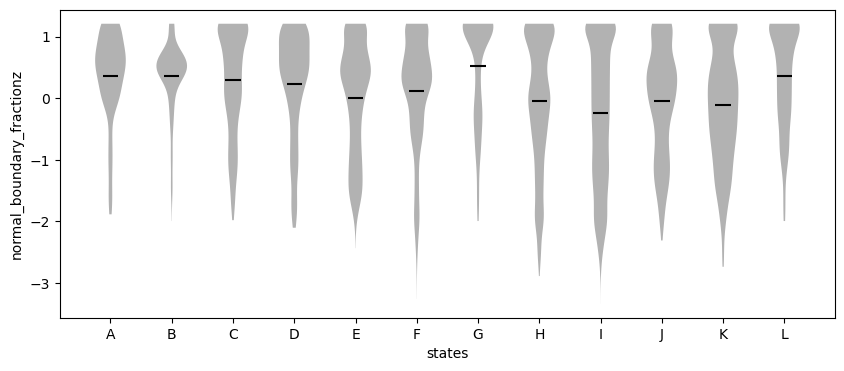

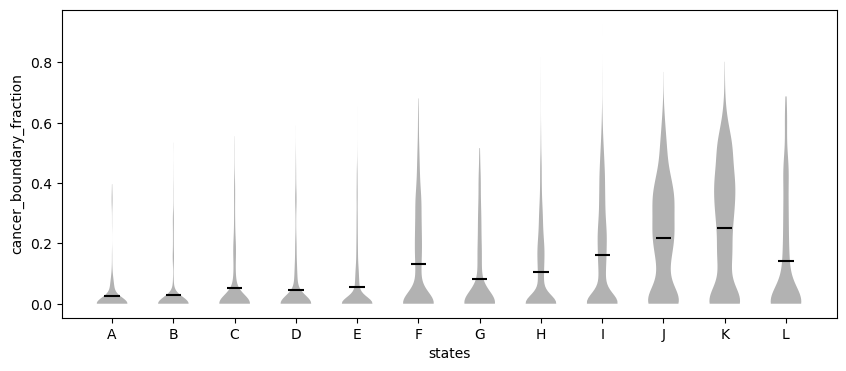

...

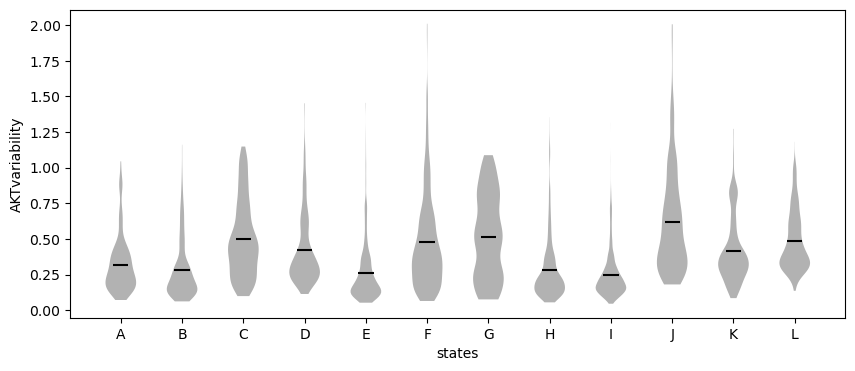

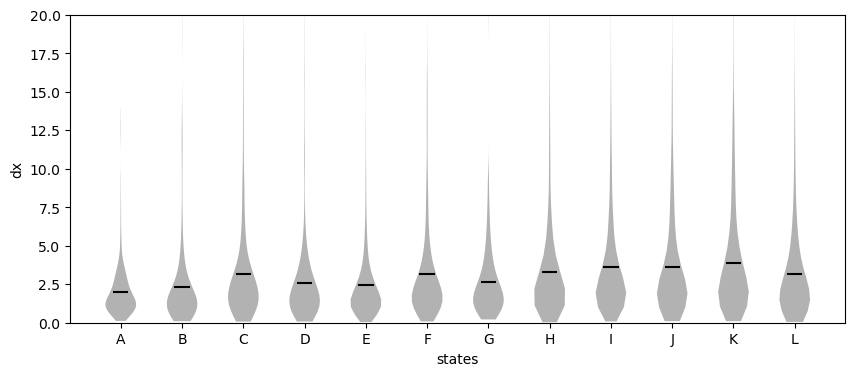

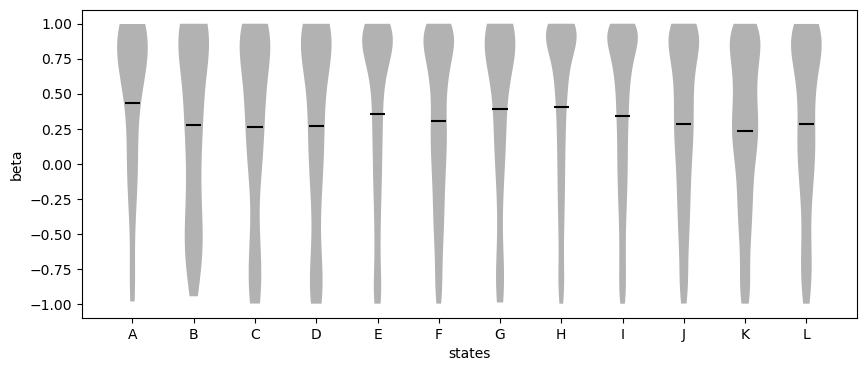

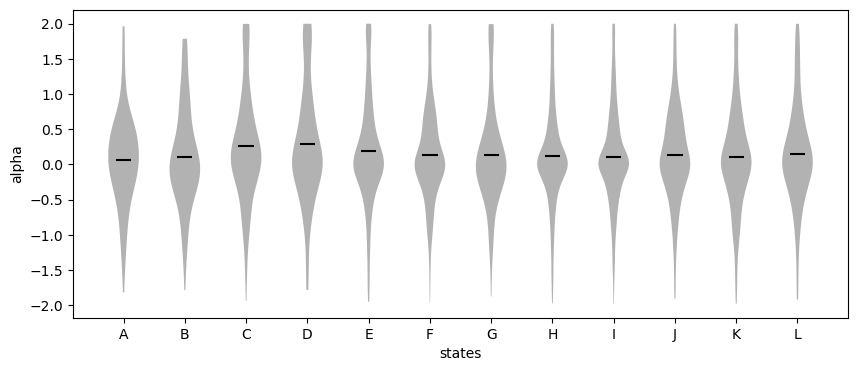

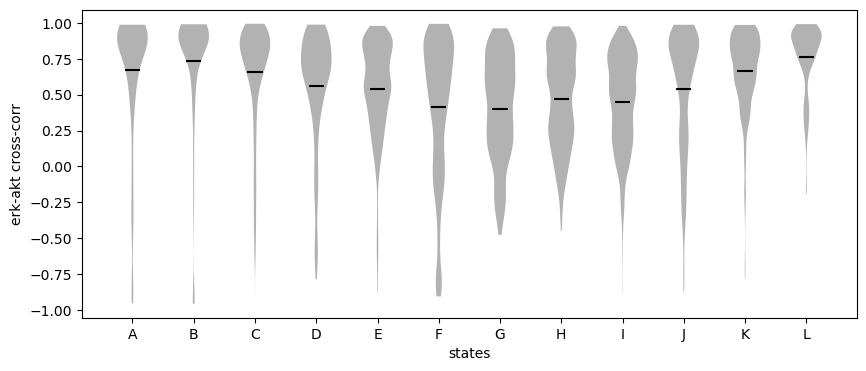

In [483]:
plt.clf()
plt.close('all')
vsetList=[corrc_erk_traj,corrc_akt_traj,cb_ratio_traj,imprep.znorm(cb_ratio_traj-cbc_ratio_traj),cbc_ratio_traj,indframes_traj,z_traj,corrc_erk_var_traj,corrc_erk_var_traj,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','AKTactivity','boundary_fraction','normal_boundary_fractionz','cancer_boundary_fraction','frame','z','ERKvariability','AKTvariability','dx','beta','alpha','erk-akt cross-corr']
for iv in range(len(vsetList)):
    vset=vsetList[iv]
    plt.figure(figsize=(10,4))
    ax=plt.gca()
    for i in range(n_states):
        setv=vset[inds_states[i]]
        setv=setv[np.isfinite(setv)]
        vplot=ax.violinplot(setv,positions=[i+1],showmeans=True,showextrema=False) #,quantiles=[.05,.95])
        vplot['cmeans'].set_color('black')
        for pc in vplot['bodies']:
            pc.set_facecolor('black')
            #pc.set_edgecolor('black')
            #pc.set_alpha(1)
    ax.set_xticks(range(1,n_states+1))
    ax.set_xticklabels(state_labels)
    #plt.ylabel('log2(nuc/cyto cc-ratio)')
    #plt.ylabel(r'cell-cell local alignment $\langle \hat{v}_1 \cdot \hat{v}_2 \rangle$')
    #plt.ylabel('speed (z-score)')
    #plt.ylabel('nuc/cyt cc-ratio')
    plt.ylabel(captionset[iv])
    plt.xlabel('states')
    if captionset[iv]=='dx':
        plt.ylim(0,20)
    #plt.savefig(date+'/'+captionSet[iv]+'_tearplot_'+figid+'.png')
    plt.savefig(date+'/'+captionset[iv]+'_tearplot_'+figid+'.pdf')
    plt.pause(.5)


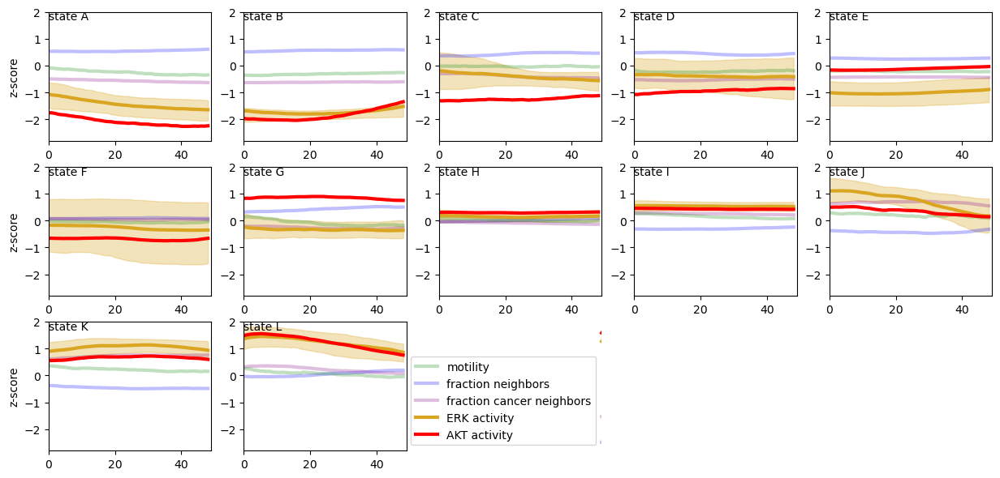

In [484]:
plt.figure(figsize=(15,12))
frames=np.arange(trajl)
cb_ratio_full_traj=imprep.znorm(cb_ratio_full_traj-cbc_ratio_full_traj)
cbc_ratio_full_traj=imprep.znorm(cbc_ratio_full_traj)
erk_traj=imprep.znorm(corrc_erk_full_traj)
akt_traj=imprep.znorm(corrc_akt_full_traj)
dx_full_traj=imprep.znorm(dx_full_traj)
hplots=5;vplots=5;
for istate in range(nstates):
    plt.subplot(vplots,hplots,istate+1)
    ax=plt.gca()
    plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
    ulim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(cb_ratio_full_traj[inds_states[istate],:],25,axis=0)
    #ax.fill_between(frames,llim,ulim,color='blue',alpha=.3)
    plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
    ulim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(cbc_ratio_full_traj[inds_states[istate],:],25,axis=0)
    plt.plot(frames,np.nanmean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
    plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
    plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
    ulim=np.percentile(erk_traj[inds_states[istate],:],75,axis=0)
    llim=np.percentile(erk_traj[inds_states[istate],:],25,axis=0)
    ax.fill_between(frames,llim,ulim,color='goldenrod',alpha=.3)
    plt.ylim(-2.8,2);
    plt.xlim(0,trajl)
    plt.text(0,1.7,f'state {state_labels[istate]}')
    if (istate+1)%hplots==1:
        plt.ylabel('z-score')
    if istate+1>(hplots*(hplots-1)):
        plt.xlabel('frame')
    if istate+1==nstates:
        plt.subplot(vplots,hplots,istate+2)
        plt.plot(frames,np.mean(dx_full_traj[inds_states[istate],:],axis=0),color='green',alpha=.25,linewidth=3,label='motility')
        plt.plot(frames,np.mean(cb_ratio_full_traj[inds_states[istate],:],axis=0),color='blue',alpha=.25,linewidth=3,label='fraction neighbors')
        plt.plot(frames,np.mean(cbc_ratio_full_traj[inds_states[istate],:],axis=0),color='purple',alpha=.25,linewidth=3,label='fraction cancer neighbors')
        plt.plot(frames,np.mean(erk_traj[inds_states[istate],:],axis=0),color='goldenrod',linewidth=3,label='ERK activity')
        plt.plot(frames,np.mean(akt_traj[inds_states[istate],:],axis=0),color='red',linewidth=3,label='AKT activity')
        plt.xlim(-100,0)
        plt.legend(loc='lower right')
        plt.axis('off')

plt.savefig(date+'/signaling_neighbors_'+figid+'.png')
plt.savefig(date+'/signaling_neighbors_'+figid+'.pdf')
plt.pause(.1)

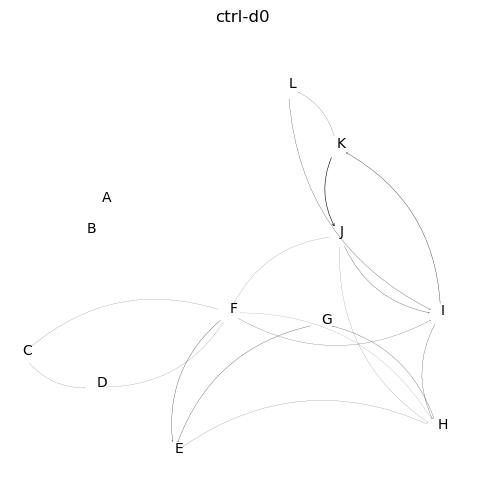

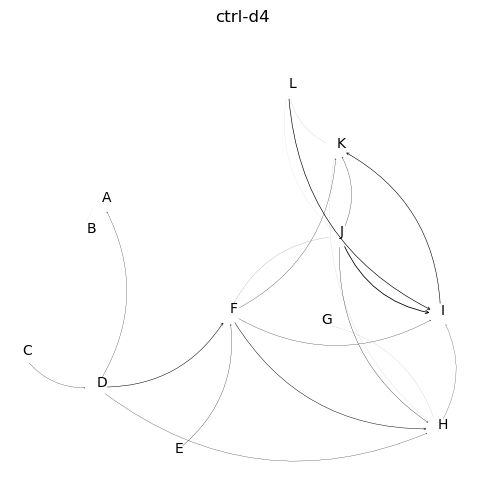

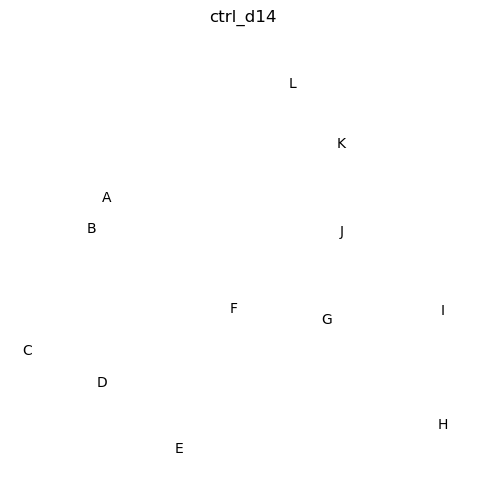

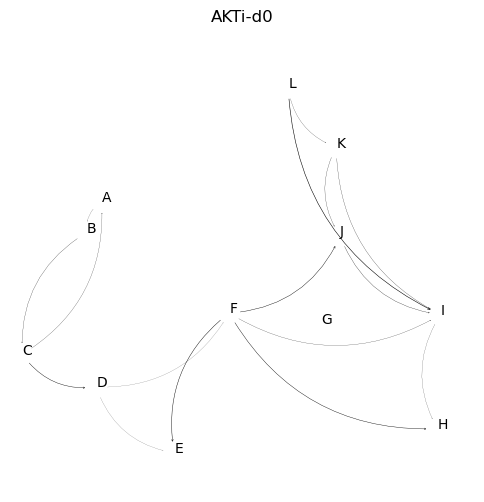

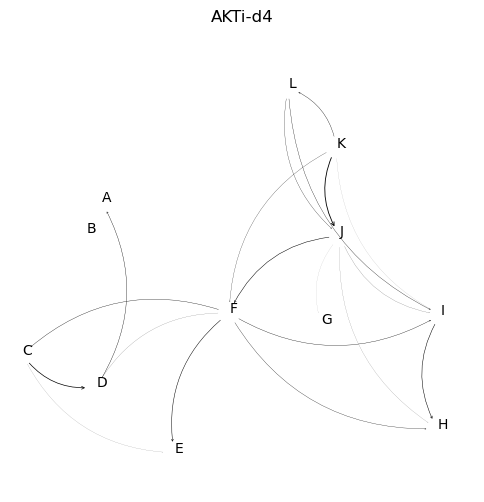

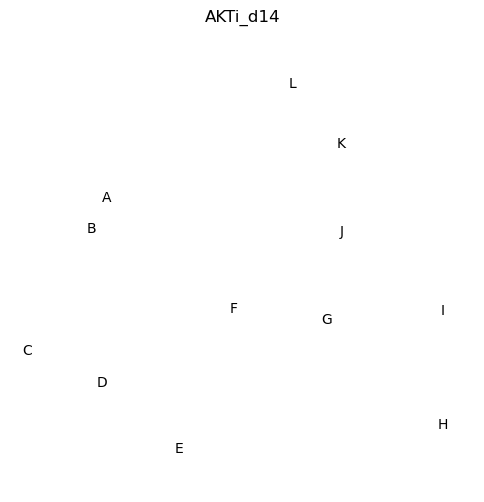

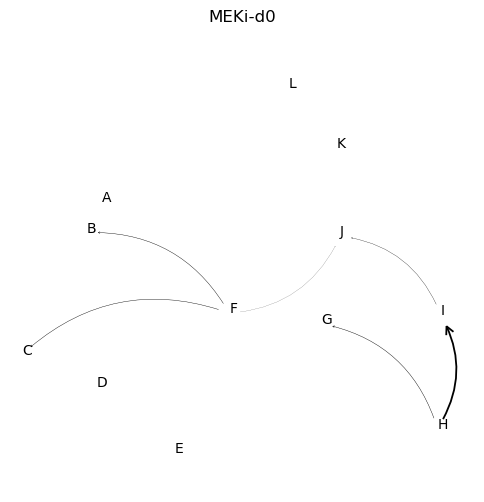

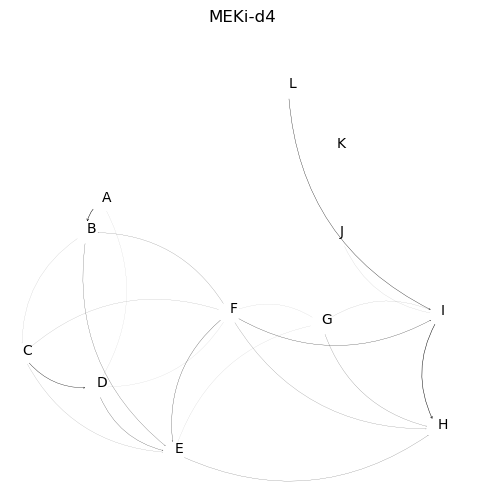

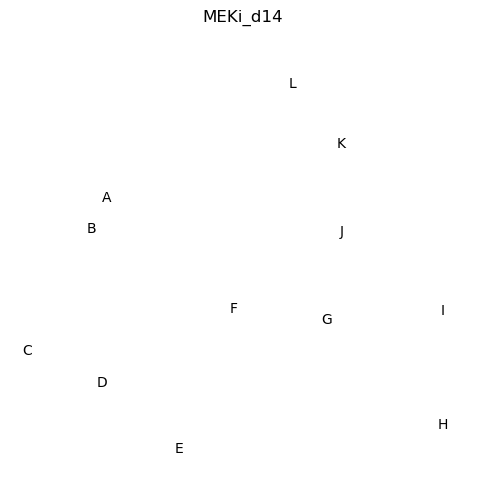

In [485]:
pcut=.001
fcut=.0001
rad=.3
mscale=2200
arrowstyle='->'
lws=200.
sh=8
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
#MtSet=[None]*nf
for i in range(nf):
    plt.figure(figsize=(6,6))
    #plt.subplot(4,4,i+2)
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    #MtSet[i]=Mt.copy()
    #Mt=MtSet[i]
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            fluxjk=state_probs[i,j]*Mt[j,k]
            fluxkj=state_probs[i,k]*Mt[k,j]
            flux=fluxjk-fluxkj
            #flux=fluxjk
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.png')
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.pdf')
    plt.pause(.1)

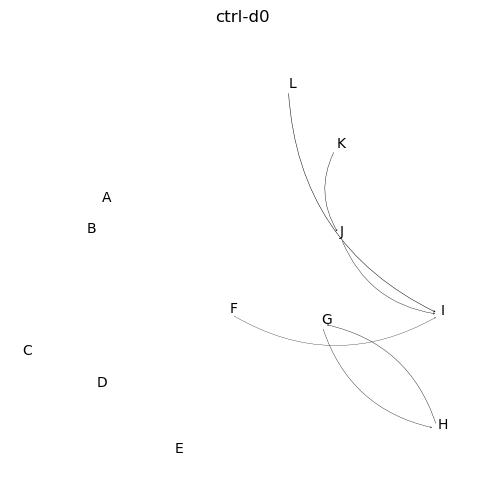

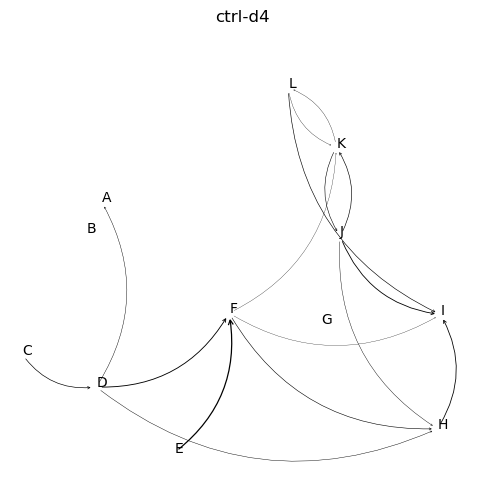

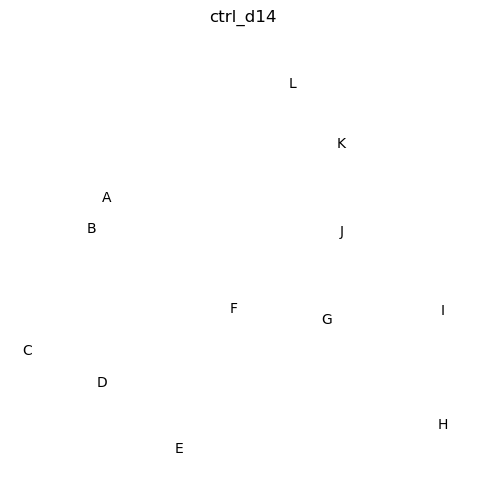

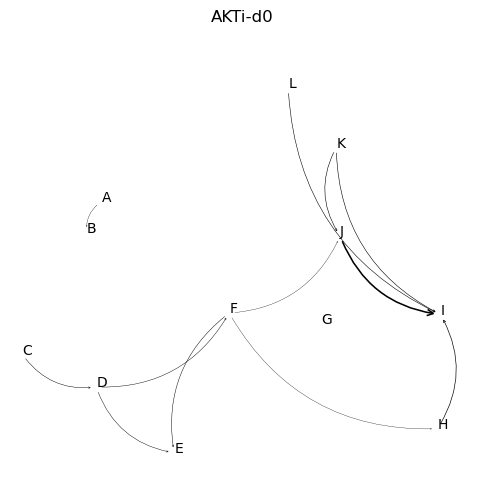

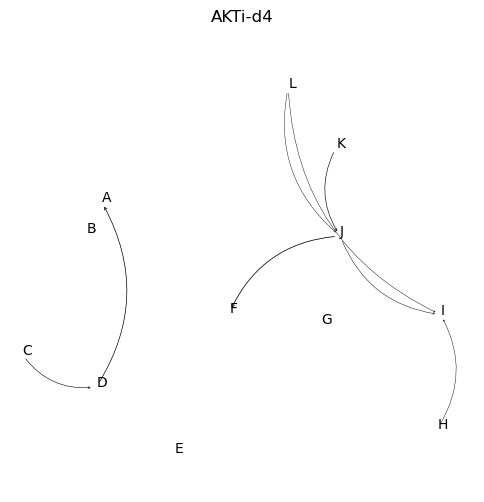

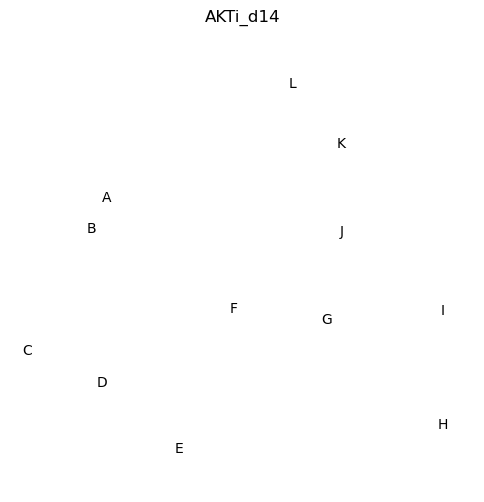

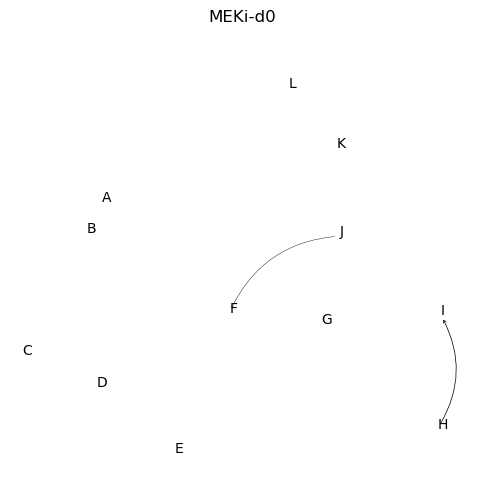

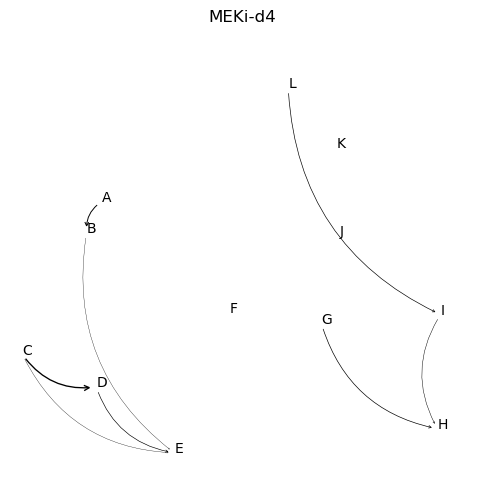

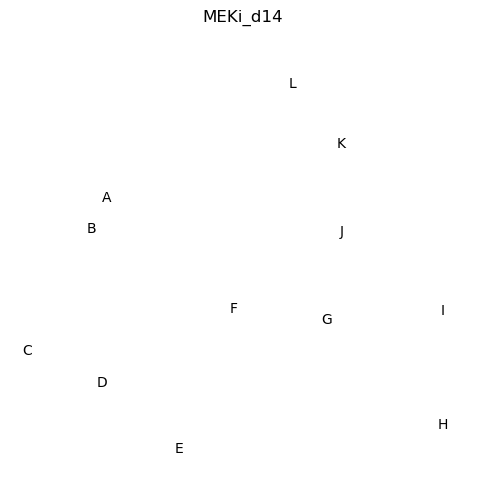

In [486]:
pcut=.02
fcut=.01
rad=.3
mscale=200
arrowstyle='->'
lws=20.
sh=4
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
#MtSet=[None]*nf
for i in range(nf):
    plt.figure(figsize=(6,6))
    #plt.subplot(4,4,i+2)
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    #MtSet[i]=Mt.copy()
    #Mt=MtSet[i]
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            #fluxjk=state_probs[i,j]*Mt[j,k]
            fluxjk=Mt[j,k]
            #fluxkj=state_probs[i,k]*Mt[k,j]
            #flux=fluxjk-fluxkj
            flux=fluxjk
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])
    plt.savefig(date+'/networktrans_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.png')
    plt.savefig(date+'/networktrans_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.pdf')
    plt.pause(.1)

/tmp/ipykernel_28968/2299771872.py:46: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Matrix is singular.
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately


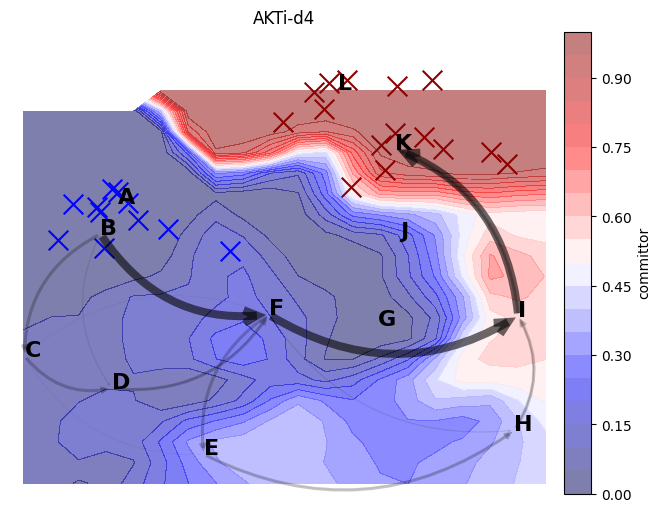

/tmp/ipykernel_28968/2299771872.py:46: RuntimeWarning: invalid value encountered in divide
  vdist1=np.divide(vdist1,norm1)


Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately
Input matrix is not weakly connected. Therefore it has no unique stationary distribution. Separate disconnected components and handle them separately


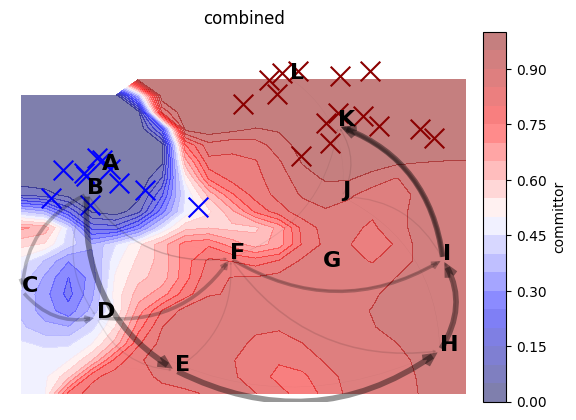

In [83]:
MtCG=model.get_transition_matrix_CG(x0set,x1set,clusters=clusters_minima,states=stateSet);
pcut=.05
fcut=0.
rad=.3
mscale=40.
arrowstyle='->'
lws=10.
sh=2
state_centers=state_centers_minima
commsize=100
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
plt.figure(figsize=(7.5,6))
stateA=[0,1]#,2,3]; 
stateB=[10,11]
indSource=np.array([]).astype(int)
for isource in stateA:
    inds=np.where(stateSet==isource)[0]
    indSource=np.append(indSource,inds)

indTargets=np.array([]).astype(int)
for itargets in stateB:
    inds=np.where(stateSet==itargets)[0]
    indTargets=np.append(indTargets,inds)

for i in range(nf+1):
    #plt.subplot(4,4,i+2)
    plt.clf()
    if i<nf:
        Tmatrix=MtSet[i]
    else:
        Tmatrix=P
    indNotTargets=np.setdiff1d(range(Tmatrix.shape[0]),indTargets)
    indNotSource=np.setdiff1d(range(Tmatrix.shape[0]),indSource)
    prob=prob1
    levels=np.linspace(np.min(prob[prob>0]),np.max(prob),20)
    #plt.contourf(xx,yy,prob.T,levels=levels,cmap=plt.cm.gray_r,alpha=0.8)
    q=model.get_committor(Tmatrix,indTargets,indSource,conv=1.e-5)
    #plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=q,cmap=plt.cm.gist_heat,marker='o',vmin=0.,vmax=1.)
    vdist1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=nbins,weights=q.flatten())
    vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
    norm1,xedges1,yedges1=np.histogram2d(x_clusters[:,0],x_clusters[:,1],bins=[xedges1,yedges1])
    norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
    vdist1=np.divide(vdist1,norm1)
    indnan=np.where(np.isnan(vdist1))
    indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
    xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
    yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
    xx1,yy1=np.meshgrid(xedges1c,yedges1c)
    levels=np.linspace(0,1,21) #np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
    cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.seismic,levels=levels,alpha=0.5)
    cbar=utilities.colorbar(cs)
    cbar.set_label('committor')
    plt.scatter(x_clusters[indTargets,0],x_clusters[indTargets,1],s=200,c='darkred',marker='x')
    plt.scatter(x_clusters[indSource,0],x_clusters[indSource,1],s=200,c='blue',marker='x')
    #pts=np.array([xx1.flatten(),yy1.flatten()]).T
    #indpts=clusters_2d.assign(pts)
    #states=stateSet[indpts]
    #plt.contour(xx,yy,states.reshape(nbins,nbins),levels=np.arange(nstates),colors='black')
    try:
        if i<nf:
            TmatrixCG=MtSetCG[i]
        else:
            TmatrixCG=MtCG
        tpt=msmtools.flux.tpt(TmatrixCG,stateA,stateB)
        pathways=tpt.pathways()
        paths=pathways[0]
        capacities=pathways[1]
        ax=plt.gca()
        for ipath in range(-1,-len(paths)-1,-1):
            statepath=paths[ipath]
            colorpath=capacities[ipath]/np.sum(capacities)
            for ipath in range(statepath.size-1):
                j=statepath[ipath]
                k=statepath[ipath+1]
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*colorpath,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*colorpath,joinstyle='miter',capstyle='butt',alpha=colorpath) #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
        for j in range(n_states):
            scolor=tpt.committor[j]+.01
            #plt.scatter(state_centers[j,0],state_centers[j,1],s=commsize,c=plt.cm.gist_heat(scolor),alpha=0.3)
            plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',weight='bold',fontsize=16,ma='center')
        plt.xlim(xmin,xmax)
        plt.ylim(ymin,ymax+.5)
        plt.axis('off')
        if i<nf:
            plt.title(tmSet[i])
            tstr=tmSet[i]
        else:
            plt.title('combined')
            tstr='combined'
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tstr}_nS{nstates}.png')
        plt.savefig(f'{date}/pathways_sadtohappy_{figid}_{tstr}_nS{nstates}.pdf')
        plt.pause(5)
    except Exception as e:
        print(e)

q_states=np.zeros(nstates)
for istate in range(nstates):
    indstate=np.where(stateSet==istate)[0]
    q_states[istate]=np.mean(q[indstate,0])

state_order=np.argsort(q_states)

mkdir: cannot create directory ‘14jun24/cell_statetrans_organoids_tl49_14jun24’: File exists


model: 0 cond: ctrl-d0
model: 1 cond: ctrl-d0
model: 3 cond: ctrl-d0
model: 4 cond: ctrl-d0
model: 5 cond: ctrl-d0
model: 7 cond: ctrl-d0
model: 9 cond: ctrl-d0
model: 10 cond: ctrl-d0
model: 11 cond: ctrl-d0
model: 14 cond: ctrl-d0
model: 38 cond: ctrl-d0
model: 39 cond: ctrl-d0
model: 40 cond: ctrl-d0
model: 41 cond: ctrl-d0
model: 43 cond: ctrl-d0
model: 44 cond: ctrl-d0
model: 45 cond: ctrl-d0
model: 46 cond: ctrl-d0
model: 47 cond: ctrl-d0
model: 95 cond: ctrl-d4
model: 96 cond: ctrl-d4
model: 96 traj: 15
14jun24/stateFtoK_ctrl-d4_m96_c3372_organoids_tl49_14jun24.png


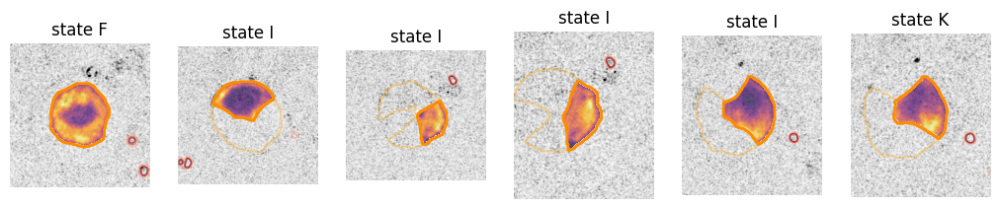

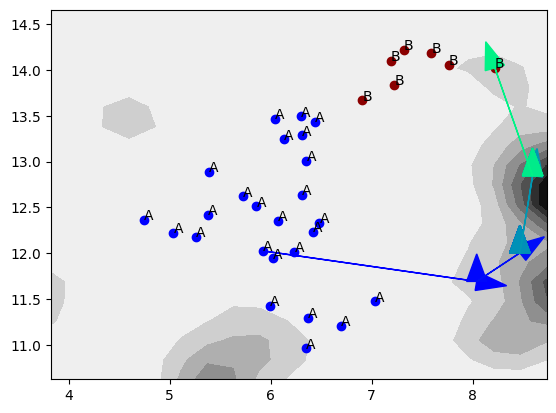

model: 97 cond: ctrl-d4
model: 98 cond: ctrl-d4
model: 100 cond: ctrl-d4
model: 102 cond: ctrl-d4
model: 103 cond: ctrl-d4
model: 107 cond: ctrl-d4
model: 109 cond: ctrl-d4
model: 110 cond: ctrl-d4
model: 111 cond: ctrl-d4
model: 112 cond: ctrl-d4
model: 113 cond: ctrl-d4
model: 114 cond: ctrl-d4
model: 115 cond: ctrl-d4
model: 116 cond: ctrl-d4
model: 21 cond: AKTi-d0
model: 23 cond: AKTi-d0
model: 25 cond: AKTi-d0
model: 26 cond: AKTi-d0
model: 27 cond: AKTi-d0
model: 31 cond: AKTi-d0
model: 48 cond: AKTi-d0
model: 49 cond: AKTi-d0
model: 50 cond: AKTi-d0
model: 51 cond: AKTi-d0
model: 52 cond: AKTi-d0
model: 53 cond: AKTi-d0
model: 54 cond: AKTi-d0
model: 57 cond: AKTi-d4
model: 58 cond: AKTi-d4
model: 59 cond: AKTi-d4
model: 60 cond: AKTi-d4
model: 61 cond: AKTi-d4
model: 64 cond: AKTi-d4
model: 65 cond: AKTi-d4
model: 68 cond: AKTi-d4
model: 70 cond: AKTi-d4
model: 73 cond: AKTi-d4
model: 74 cond: AKTi-d4
model: 75 cond: AKTi-d4
model: 76 cond: AKTi-d4
model: 77 cond: AKTi-d4
mode

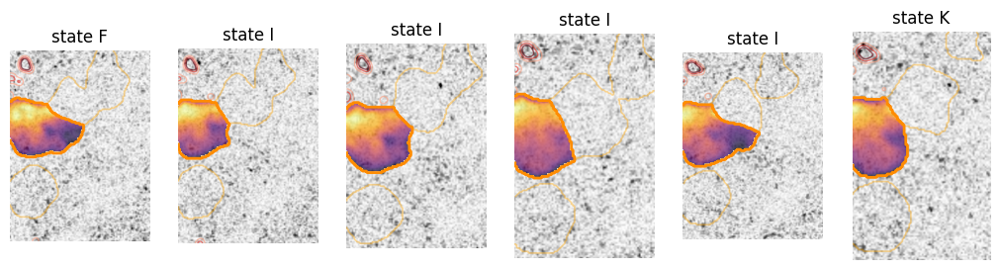

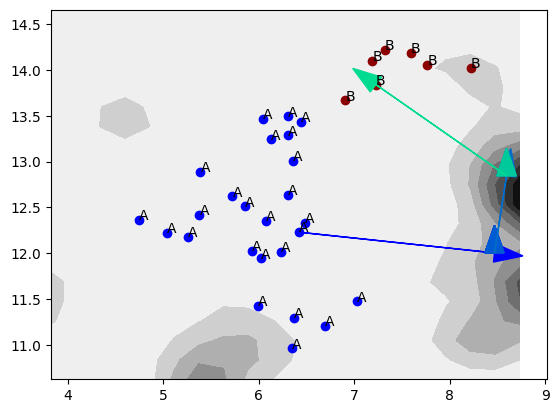

model: 123 cond: AKTi-d4
model: 124 cond: AKTi-d4
model: 32 cond: MEKi-d0
model: 34 cond: MEKi-d0
model: 35 cond: MEKi-d0
model: 55 cond: MEKi-d0
model: 79 cond: MEKi-d4
model: 80 cond: MEKi-d4
model: 81 cond: MEKi-d4
model: 82 cond: MEKi-d4
model: 83 cond: MEKi-d4
model: 84 cond: MEKi-d4
model: 85 cond: MEKi-d4
model: 86 cond: MEKi-d4
model: 87 cond: MEKi-d4
model: 88 cond: MEKi-d4
model: 89 cond: MEKi-d4
model: 90 cond: MEKi-d4
model: 93 cond: MEKi-d4
model: 94 cond: MEKi-d4
model: 125 cond: MEKi-d4
model: 126 cond: MEKi-d4
model: 127 cond: MEKi-d4
model: 128 cond: MEKi-d4
model: 129 cond: MEKi-d4
model: 130 cond: MEKi-d4
model: 131 cond: MEKi-d4
model: 132 cond: MEKi-d4
model: 134 cond: MEKi-d4
model: 135 cond: MEKi-d4
model: 136 cond: MEKi-d4
model: 137 cond: MEKi-d4
model: 139 cond: MEKi-d4
model: 141 cond: MEKi-d4


In [94]:
nbins=20
fl=0
fu=191 #frames for time window
stordir=f'{date}/cell_statetrans_{figid}'
os.system(f'mkdir {stordir}')
nuclow=-1.;nuchigh=9.;replow=0.;rephigh=5.;bflow=0.;bfhigh=5.
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
levels=np.linspace(0,np.max(prob1),100)
minl=trajl
cell_states=clusters_minima
npic=5
ncellpics=6
min_ctraj=1
cell_states=clusters_minima
dtraj_states=cell_states.assign(x)
stateA=5
stateB=10
xset=x_clusters[:,0]
yset=x_clusters[:,1]
for imf in range(nf):
    indmodels=np.where(inds_tmSet_models==imf)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    ipic=0
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    n_instate=np.sum(dtraj_states[indstwm]==stateA)
    for imc in indmodels:
        indstm=np.where(indtreatment_traj==imc)[0]
        if indstm.size>0:
            modelSet[i].Xtraj=x[indstm,0:neigen]
            indstm_model=indstm-np.min(indstm)
        if ipic<npic and n_instate>0:
            print('model: '+str(imc)+' cond: '+tmSet[imf])
            modelSet[imc].visual=True
            traj_lengths=np.array([])
            for itraj in range(len(modelSet[imc].trajectories)):
               traj_lengths=np.append(traj_lengths,modelSet[imc].trajectories[itraj].size)
            indtrajs=np.where(traj_lengths>=minl)[0]
            for itraj in indtrajs:
                cell_traj=modelSet[imc].trajectories[itraj]
                if True: #try:
                    xt,inds_traj=modelSet[imc].get_Xtraj_celltrajectory(cell_traj,Xtraj=x[indstm,:],traj=modelSet[imc].traj[indstm_model,:])
                    if xt.size>0 and ipic<npic:
                        slices=modelSet[imc].get_trajAB_segments(xt,stateA=stateA,stateB=stateB,clusters=clusters_minima,states=stateSet)
                        for indslice in slices:
                            print('model: '+str(imc)+' traj: '+str(itraj))
                            ctraj=modelSet[imc].traj[indstm_model[inds_traj[indslice]],-1]
                            if ctraj.size>min_ctraj and ipic<npic:
                                xts=xt[indslice]
                                xts_clusters=x_clusters[clusters_minima.assign(xts),:]
                                states_xt=stateSet[clusters_minima.assign(xts)]
                                iminima=clusters_minima.assign(xts)[0]
                                print(date+'/state'+state_labels[stateA]+'to'+state_labels[stateB]+'_'+tmSet[imf]+'_m'+str(imc)+'_c'+str(ctraj[-1])+'_'+figid+'.png')
                                iplot=0
                                plt.figure(figsize=(15,3))
                                for icell in np.linspace(0,ctraj.size-1,ncellpics).astype(int):
                                    indcell=ctraj[icell]
                                    plt.subplot(1,ncellpics+1,iplot+1)
                                    show_cell_activation(modelSet[imc],indcell,nuclow=nuclow,nuchigh=nuchigh,replow=replow,rephigh=rephigh,bflow=bflow,bfhigh=bfhigh)
                                    iplot=iplot+1
                                    plt.title(f'state {state_labels[states_xt[icell]]}')
                                plt.savefig(f'{stordir}/trans_state{state_labels[stateA]}to{state_labels[stateB]}_cell{ctraj[-1]}_m{imc}_{figid}.png')
                                plt.pause(1);
                                plt.figure()
                                ax=plt.gca()
                                plt.contourf(xx,yy,prob1.T,cmap=plt.cm.gray_r)
                                inds_state=np.where(stateSet==stateA)[0]
                                for ipt in inds_state:
                                    plt.scatter(stateCenters[ipt,0],stateCenters[ipt,1],color='blue') #plt.cm.jet(1.*stateSet[ipt]/5.))
                                    plt.text(xset[ipt],yset[ipt],'A')
                                inds_state=np.where(stateSet==stateB)[0]
                                for ipt in inds_state:
                                    plt.scatter(stateCenters[ipt,0],stateCenters[ipt,1],color='darkred') #plt.cm.jet(1.*stateSet[ipt]/5.))
                                    plt.text(xset[ipt],yset[ipt],'B')
                                for itt in range(0,xts.shape[0]-1):
                                    ax.arrow(xts_clusters[itt,0],xts_clusters[itt,1],xts_clusters[itt+1,0]-xts_clusters[itt,0],xts_clusters[itt+1,1]-xts_clusters[itt,1],head_width=.2,linewidth=1.0,color=plt.cm.winter(itt/xts.shape[0]),alpha=1.0)
                                plt.savefig(stordir+'/statetraj'+state_labels[stateA]+'to'+state_labels[stateB]+'_'+'_'+tmSet[imf]+'_m'+str(imc)+'_c'+str(ctraj[-1])+'_'+figid+'.pdf');plt.pause(1);
                                ipic=ipic+1
                #except Exception as e:
                #    print(e)
                #    pass

In [2]:
modelSet

NameError: name 'modelSet' is not defined

#### KMD

In [ ]:
test_start_frame=142
#testing_models=np.random.choice(indgood_models.size,ntest,replace=False)
testing_models=np.arange(indgood_models.size).astype(int)
#testing_models=np.arange(8).astype(int)
training_models=np.setdiff1d(np.arange(indgood_models.size).astype(int),testing_models)
testing_models=indgood_models[testing_models]
training_models=indgood_models[training_models]
inds_trajset_training=np.array([]).astype(int)
for imodel in training_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    inds_trajset_training=np.append(inds_trajset_training,indmodel)

inds_trajset_testing=np.array([]).astype(int)
inds_trajset_testing_cellinds=np.array([]).astype(int)
for imodel in testing_models:
    indmodel=np.where(inds_trajsteps_models==imodel)[0]
    cellinds_model=modelSet[imodel].traj[inds_trajsteps[indmodel,1],-1]
    frames_model=modelSet[imodel].cells_frameSet[cellinds_model]
    inds_trajset_training=np.append(inds_trajset_training,indmodel[frames_model<=test_start_frame])
    inds_trajset_testing=np.append(inds_trajset_testing,indmodel[frames_model==test_start_frame])
    inds_trajset_testing_cellinds=np.append(inds_trajset_testing_cellinds,cellinds_model[frames_model==test_start_frame])

ntest_traj=inds_trajset_testing_cellinds.size
test_trajectories=[None]*ntest_traj
for itest in range(ntest_traj):
    indcell=inds_trajset_testing_cellinds[itest]
    imodel=inds_trajsteps_models[inds_trajset_testing[itest]]
    for itraj in range(len(modelSet[imodel].trajectories)):
        if np.sum(np.where(modelSet[imodel].trajectories[itraj]==indcell)[0])>0:
            cell_traj=modelSet[imodel].trajectories[itraj]
            start=np.where(cell_traj==indcell)[0]
            test_trajectories[itest]=cell_traj[start[0]:]

nplots=int(np.ceil(np.sqrt(ntest_traj)))
test_stds=np.zeros(ntest_traj)
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
#plt.clf()
for itraj in range(ntest_traj):
    imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
    #plt.subplot(nplots,nplots,itraj+1)
    obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
    test_stds[itraj]=np.std(obs_test)

In [ ]:
feature_list

In [ ]:
def get_primary_frequency(series):
    rtha=np.abs(np.fft.fft(series))
    freq=np.fft.fftfreq(series.size)
    indf=freq>=0
    freq=freq[indf]
    rtha=rtha[indf]
    indsort=np.argsort(freq)
    freq=freq[indsort]
    rtha=rtha[indsort]
    rtha=rtha/np.sum(rtha)
    #mean_freq=np.sum(np.multiply(rtha,freq))
    mfreq=freq[np.argmax(rtha)]
    return mfreq

def average_delays_test(X_pred,trajl):
    test_steps=X_pred.shape[0]
    ncopies=int(X_pred.shape[1]/trajl)
    obs_pred_all=np.ones((ncopies,test_steps+trajl-1,trajl))*np.nan
    for icopy in range(ncopies):
        for itt in range(trajl):
            inds=np.arange(itt,itt+test_steps).astype(int)
            obs_pred_all[icopy,inds,itt]=X_pred[:,itt+icopy*trajl]
    obs_pred=np.nanmean(obs_pred_all,axis=(0,2))[(trajl-1):]
    return obs_pred

def organize_modes(wam):
    nmodes=wam.size
    mode_index=[]
    mode_absj=np.array([]).astype('complex128')
    wam_orig=wam.copy()
    while wam.size>0:
        w=wam[0]
        imode=np.where(wam_orig==w)[0][0]
        modeset=np.array([imode]).astype(int)
        imode_conj=np.where(wam_orig==np.conj(w))[0]
        if imode_conj.size>0 and imode_conj!=imode:
            modeset=np.append(modeset,imode_conj)
        mode_index.append(modeset)
        mode_absj=np.append(mode_absj,complex(np.real(w),np.abs(np.imag(w))))
        inds_leftover=np.setdiff1d(np.arange(wam.size).astype(int),np.arange(modeset.size))
        wam=wam[inds_leftover]
    return mode_index,mode_absj

def load_koopman_fromdict(koopman_dict): #koopman_dict = {"K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V}
    K=koopman_dict["K"]; M=koopman_dict["M"]; Xi=koopman_dict["Xi"]; Lam=koopman_dict["Lam"];
    W=koopman_dict["W"]; phi_X=koopman_dict["phi_X"]; V=koopman_dict["V"]
    return K,M,Xi,Lam,W,phi_X,V

In [ ]:
nplot_traj=inds_trajset_testing.size
#inds_plot=np.array([0,1,3,5,6,8,10,11,23,25,26,29,38,41,45,52]).astype(int);nplots=4
inds_plot=np.argsort(test_stds)[-nplot_traj:];nplots=int(np.ceil(np.sqrt(nplot_traj)));
ind_obs_pred=modelSet[0].Xpca.shape[1]-1 #ERK was the last one
ntraining_transitions=inds_trajset_training.size
inds_train=inds_trajset_training
#ntraining_transitions=1500
#inds_train=np.random.choice(inds_trajset_training,ntraining_transitions,replace=False)
inds_train=np.append(inds_train,inds_trajset_testing)
inds_test_starts=np.arange(ntraining_transitions,ntraining_transitions+ntest_traj).astype(int)
X=x0set[inds_train,:]
Y=x1set[inds_train,:]
#apply boundary conditions
#Acut=-2.;Bcut=2.
#indsA_X=np.where(X[:,-1]<Acut)[0]
#indsA_Y=np.where(Y[:,-1]<Acut)[0]
#indsB_X=np.where(X[:,-1]>Bcut)[0]
#indsB_Y=np.where(Y[:,-1]>Bcut)[0]
#Y[indsA_X,:]=1.e6 #anything in A goes to cemetery after one step
#Y[indsB_X,:]=-1.e6 #X[indsB_X,:] #anything in B stays in B
kname=f'koopman_trajl{trajl}_ERKonly1D_ntrain{ntraining_transitions}'
#1D-ification X=X[:,-1][:,np.newaxis]; Y=Y[:,-1][:,np.newaxis]
n_iterations=10
koopman_models=[None]*n_iterations
s=.1
#lamcut=0. #ntraining_transitions+inds_trajset_test.size
#lamcut_M=.9
M=np.eye(X.shape[1])
test_steps=48 #modelSet[0].nt-test_start_frame
test_frames=np.arange(test_start_frame,test_start_frame+test_steps).astype(int)
#nplots=int(np.ceil(np.sqrt(nplot_traj))); inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
rmse_iters=np.zeros(n_iterations)
corr_iters=np.zeros(n_iterations)
plt.close('all')
fig4=plt.figure(4,figsize=(14,12))
fig1=plt.figure(1,figsize=(14,12))
fig2=plt.figure(2,figsize=(8,6))
fig3=plt.figure(3,figsize=(9.4,4.5))
realcut=-0.05;imagcut=np.pi/16. #np.inf
X_orig=X.copy();Y_orig=Y.copy()
betaM=.001
for i_iter in range(n_iterations):
    M=(1.-betaM)*M+betaM*np.eye(X.shape[1])
    #dmat=scipy.spatial.distance.cdist(np.matmul(X,M),np.matmul(Y,M));plt.figure(3);plt.clf();sigma=get_scaled_sigma(dmat,visual=True);plt.pause(.1);h=np.ones(X.shape[0])*sigma
    XX=np.matlib.repmat(X,1,int(M.shape[1]/X.shape[1]));YY=np.matlib.repmat(Y,1,int(M.shape[1]/Y.shape[1]))
    h=model.get_kernel_sigmas(XX,M,s=s)
    psi_X=model.get_gaussianKernelM(XX,XX,M,h)
    psi_Y=model.get_gaussianKernelM(XX,YY,M,h)
    #K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M.astype('float64'),h=h.astype('float64'),psi_X=psi_X.astype('float64'),psi_Y=psi_Y.astype('float64'))
    K,Xi,Lam,W=model.get_koopman_eig(XX,YY,M=M,h=h,psi_X=psi_X,psi_Y=psi_Y)
    wam=np.log(np.diag(Lam))
    lam=np.diag(Lam)
    indmodes=np.where(np.logical_and(np.real(wam)<0.15,np.abs(np.imag(wam))<np.pi/3.))[0]
    #indmodes=np.where(np.logical_and(np.real(wam)<np.inf,np.abs(np.imag(wam))<np.inf))[0]
    if indmodes.size==0:
        indmodes=np.array([0]).astype(int)
    phi_X,V=model.get_koopman_modes(psi_X,Xi[:,indmodes],W[:,indmodes],XX)
    spatial_frequencies=np.zeros(indmodes.size)
    for imode in range(indmodes.size):
        spatial_frequencies[imode]=get_primary_frequency(V[:,imode])
    indspatial=np.where(spatial_frequencies<.1)[0]
    wam_reconstr=wam[indmodes]
    lam_reconstr=lam[indmodes]
    indmodes_M1=np.where(np.logical_and(np.real(wam_reconstr)>realcut,np.abs(np.imag(wam_reconstr))<imagcut))[0];indmodes_M1=np.intersect1d(indmodes_M1,indspatial)
    indmodes_noimaginary=np.where(np.sum(np.abs(np.imag(phi_X)),axis=0)==0.)[0]; indmodes_M2=indmodes_noimaginary[np.logical_and(np.real(wam[indmodes_noimaginary])>realcut,np.abs(np.imag(wam_reconstr[indmodes_noimaginary]))<imagcut)];
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    #indmodes_M2=np.array([indmodes_noimaginary[np.argmin(np.abs(lam_reconstr[indmodes_noimaginary]-(1.+0.j)))]]).astype(int)
    indmodes_M1=np.setdiff1d(indmodes_M1,indmodes_M2) #indmodes_M=np.array([indmodes_M1[0],indmodes_M2[0]])
    if indmodes_M1.size==0:
        indmodes_M1=np.array([np.setdiff1d(indmodes,indmodes_M2)[0]])
    plt.figure(4);plt.clf()
    for i in range(81):
        imode=indmodes[i];vim=np.zeros((test_steps,XX.shape[1])).astype('complex128');vim[0,:]=V[:,i];nm=48
        for inm in range(1,test_steps):
            vim[inm,:]=vim[inm-1,:]*lam[imode]
        plt.subplot(9,9,i+1);plt.imshow(np.real(vim),cmap=plt.cm.seismic,origin='lower');plt.axis('off')
        if np.isin(imode,indmodes[indmodes_M1]):
            plt.title(f'{wam[imode]:.2f}',color='red',fontweight='bold')
        elif np.isin(imode,indmodes[indmodes_M2]):
            plt.title(f'{wam[imode]:.2f}',color='green',fontweight='bold')
        else:
            plt.title(f'{wam[imode]:.2f}',color='gray')
    plt.savefig(f'{date}/{kname}_modeselectionlines_iter{i_iter}_{figid}.png');plt.pause(.1)
    print(f'iteration {i_iter} using {indmodes.size} koopman modes...')
    X_preds=model.get_koopman_inference_multiple(inds_test_starts,test_steps,phi_X,V,Lam,nmodes=indmodes)
    test_obs_trajectories=[None]*ntest_traj; pred_obs_trajectories=[None]*ntest_traj
    rmses=[];corrs=[];traj_lengths=np.zeros(ntest_traj).astype(int);
    for itraj in range(ntest_traj):
        X_pred=X_preds[itraj,...]
        obs_pred=obs_pred=X_pred[:,ind_obs_pred-pca.ndim]
        #obs_pred=average_delays_test(X_pred,trajl) #obs_pred=X_pred[:,-1]
        imodel=inds_trajsteps_models[inds_trajset_testing[itraj]]
        obs_test=modelSet[imodel].Xpca[test_trajectories[itraj],ind_obs_pred]
        nobs=np.min([obs_test.size,obs_pred.size])
        test_obs_trajectories[itraj]=obs_test;pred_obs_trajectories[itraj]=obs_pred
        rmse=np.linalg.norm(obs_test[0:nobs]-obs_pred[0:nobs])/np.linalg.norm(obs_test[0:nobs])
        corr=np.corrcoef(obs_test[0:nobs],obs_pred[0:nobs])[0,1]
        rmses.append(rmse);corrs.append(corr);traj_lengths[itraj]=nobs
    plt.figure(1);plt.clf();#inds_plot=np.random.choice(np.arange(ntest_traj).astype(int),nplot_traj,replace=False)
    for iplot in range(nplot_traj):
        itraj=inds_plot[iplot]
        if test_trajectories[itraj] is not None:
            obs_pred=pred_obs_trajectories[itraj];obs_test=test_obs_trajectories[itraj];nobs=np.min([obs_test.size,obs_pred.size])
            plt.subplot(nplots,nplots,iplot+1)
            plt.plot(test_frames[0:nobs],obs_pred[0:nobs],'k--');plt.plot(test_frames[0:nobs],obs_test[0:nobs],'k-');plt.ylim(-3.5,2.6);
            plt.title(f'e: {rmses[itraj]:.2f} c: {corrs[itraj]:.2f}');ax=plt.gca();#ax.set_yticklabels([None]*len(ax.get_yticklabels()))
            ax.spines['bottom'].set_position('zero');ax.spines['right'].set_color('none');ax.spines['top'].set_color('none');ax.xaxis.set_ticks_position('bottom');ax.yaxis.set_ticks_position('left')
            ax.spines['left'].set_color('none');ax.set_xticklabels([None]*len(ax.get_xticklabels()));plt.pause(.05)
    plt.savefig(f'{date}/{kname}_test_iter{i_iter}_{figid}.png');plt.pause(.1);
    plt.figure(3);plt.clf()
    rmse_tests=np.zeros(test_steps);corr_tests=np.zeros(test_steps);xset_test=np.ones((ntest_traj,test_steps));xset_pred=np.ones((ntest_traj,test_steps))
    for istep in range(test_steps):
        indtraj=np.where(traj_lengths>istep)[0]
        for itraj in range(ntest_traj):
            if traj_lengths[itraj]>istep:
                xset_test[itraj,istep]=test_obs_trajectories[itraj][istep]
                xset_pred[itraj,istep]=pred_obs_trajectories[itraj][istep]
        rmse_tests[istep]=np.linalg.norm(xset_test[indtraj,istep]-xset_pred[indtraj,istep])/np.linalg.norm(xset_test[indtraj,istep])
        corr_tests[istep]=np.corrcoef(xset_test[indtraj,istep],xset_pred[indtraj,istep])[0,1]
    plt.subplot(1,2,1);plt.plot(rmse_tests,'ko-');plt.xlabel('test frame');plt.ylabel('RMSE');plt.yscale('log');plt.ylim(.3,5.)
    plt.subplot(1,2,2);plt.plot(corr_tests,'ko-');plt.xlabel('test frame');plt.ylabel('correlation');plt.ylim(-.2,1);
    plt.savefig(f'{date}/{kname}_errortime_iter{i_iter}_{figid}.png');plt.pause(.1);
    koopman_dict = {"inds_train":inds_train, "K":K, "M":M, "Xi":Xi, "Lam":Lam, "W":W, "phi_X":phi_X, "V":V, "pred_obs_trajectories":pred_obs_trajectories, "rmse_tests":rmse_tests, "corr_tests":corr_tests}
    koopman_models[i_iter]=koopman_dict
    corr_iters[i_iter]=np.mean(corrs);rmse_iters[i_iter]=np.mean(rmses);
    Mprev=M.copy()
    print(f'iteration {i_iter} updating M with {indmodes_M1.size} flux modes and {indmodes_M2.size} stationary modes...')
    #M=model.update_mahalanobis_matrix_grad(Mprev,X,phi_X[:,indmodes_M2],h=h,s=s)
    #M=model.update_mahalanobis_matrix_flux(Mprev,X,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s)
    #M=model.update_mahalanobis_matrix_J(Mprev,X,phi_X[:,indmodes_M],V[:,indmodes_M],Lam[indmodes[indmodes_M],:][:,indmodes[indmodes_M]],h=h,s=s)
    #plt.figure(2);plt.clf();plt.imshow(M,origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2))
    #plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.pause(.5);plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png')
    #mode_index,mode_absj=organize_modes(wam_reconstr);Mset=[]
    #for imode in range(mode_absj.size):
    #    if np.isin(mode_index[imode],indmodes_M1).any():
    #        indM=np.append(indM,mode_index[imode])
    #        M_one=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indM],h=h,s=s);Mset.append(M_one)
            #M_one=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
            #M_one=M=model.update_mahalanobis_matrix_flux(Mprev,XX,phi_X[:,indM],V[:,indM],Lam[indmodes[indM],:][:,indmodes[indM]],h=h,s=s);Mset.append(M_one)
    Mset=[];#indmodes_M2=np.append(indmodes_M1,indmodes_M2)
    #M2=model.update_mahalanobis_matrix_grad(Mprev,XX,phi_X[:,indmodes_M2],h=h,s=s);Mset.append(M2)
    indmodes_M2=np.append(indmodes_M2,indmodes_M1)
    M2=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M2]],V[:,indmodes_M2],lam_reconstr[indmodes_M2],h=h,s=s);Mset.append(M2)
    plt.figure(2);plt.clf();plt.imshow(np.abs(M2),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    #indmodes_M1=np.arange(10).astype(int)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,phi_X[:,indmodes_M1],V[:,indmodes_M1],Lam[indmodes[indmodes_M1],:][:,indmodes[indmodes_M1]],h=h,s=s);Mset.append(M1)
    #M1=model.update_mahalanobis_matrix_J(Mprev,XX,Xi[:,indmodes[indmodes_M1]],V[:,indmodes_M1],lam_reconstr[indmodes_M1],h=h,s=s);Mset.append(M1)
    #plt.figure(2);plt.clf();plt.imshow(np.abs(M1),origin='lower',cmap=plt.cm.binary,clim=(-0.02,.2));plt.pause(2);
    M=scipy.linalg.block_diag(*Mset)
    plt.figure(2);plt.clf();plt.imshow(np.real(M),origin='lower',cmap=plt.cm.Blues,clim=(-0.02,.2));
    if np.sum(np.imag(M))/np.sum(np.real(M))>1.e-10:
        plt.imshow(np.ma.masked_where(np.abs(np.imag(M))<np.mean(np.imag(M))+2*np.std(np.imag(M)),np.imag(M)),origin='lower',cmap=plt.cm.Reds,clim=(-.02,.02),alpha=.4);
    plt.xlabel('feature (delay time)');plt.ylabel('feature (delay time)');plt.savefig(f'{date}/{kname}_M_iter{i_iter+1}_{figid}.png');plt.pause(.5);

In [ ]:
inds_trajset_testing.shape

In [ ]:
np.histogram(corrc,bins=100)

In [ ]:
chist,cbins=np.histogram(corrc,bins=100)

In [ ]:
plt.plot(cbins[1:],chist)

In [ ]:
plt.scatter(np.mean(corrc_full_traj,axis=1),np.mean(d_f,axis=1),s=5,c='black',marker='.')

In [ ]:
np.corrcoef(np.mean(cs_full_traj.astype(float),axis=1),np.nanmean(cb_ratio_full_traj,axis=1))

In [ ]:
cs_full_traj=corrc_full_traj>np.mean(corrc_full_traj)

In [ ]:
x.shape

In [ ]:
cs_full_traj